# Pipeline for RNA-Seq Analysis

In [47]:
import subprocess
import os
import zipfile
from IPython.display import Image
from pyfaidx import Fasta
import sys
import math
from pathlib import Path

## What is RNA-Seq?

RNA-Seq (RNA sequencing) analysis plays a crucial role in the study of gene expression, transcriptomics, and functional genomics. It provides researchers with valuable insights into the trancsriptome, offering a comprehensive view of the dynamic landscape of RNA molecules within a biological sample. 

RNA-Seq enables researchers to compare gene expression across different conditions or experimental groups. Differential gene expression (DGE) analysis identifies genes that are upregulated or downregulated in response to specific stimuli, genetic mutations, diseases, or drug treatments. Key genes and pathways involved in various biological processes of interest can be pinpointed this way.

## An overview of Sequence Read Archive (SRA)

The Sequence Read Archive (SRA) is a central repository for high-throughput DNA and RNA sequencing data. It is operated by the National Center for Biotechnology Information (NCBI), a division of the National Library of Medicine at the National Institutes of Health (NIH) in the United States. SRA plays a critical role in the storage, management, and dissemination of vast amounts of sequencing data generated by various genomic research projects. We will be obtaining our raw sequencing data from the SRA.

### Run number

The SRA run number is a unique identifier assigned to a specific sequencing run or experiment submitted to the NCBI SRA database. This run number serves as a critical reference point for accessing and retrieving the raw sequencing data associate with a particular experiment.

## What are we doing?

In the paper titled 'FACT Mediates Cohesin Function on Chromosome' by Garcia-Luis et al., the authors delve into the mechanisms that govern genome organization and function. This study investigates the role of the histone chaperone FACT, specifically the FACT complex subunit Spt16, in orchestrating the stability of cohesin in yeast. The authors use sequencing data from cells that have both present and absent FACT to test its contribution to mitosis.

This data gives us an opportunity to explore how the presence or absence of FACT influences gene expression patterns ourselves. We can identify key genes and pathways that are directly affected by FACT depletion, and see if our findings line up with the study's!

My current directory is set up this way:

```
..
├── ref_genome
├── RNASeq_Pipeline
│   ├── data
│   └── RNASeq.ipynb
├── tools

```
ref_genome: This directory is dedicated to everything related to the reference genome we'll be using in our analysis.

RNASeq_Pipeline: Within this directory, we have two subdirectories:

data: This directory will store all the experimental data we'll be working with in our RNA-seq analysis.

RNASeq.ipynb: This Jupyter Notebook is where our RNA-seq analysis is taking place.

tools: This directory is reserved for storing the various tools and software we'll download and use in our analysis later on.

Four runs from the experiment are stored in the run numbers below. The runs 'SRR7692238' and 'SRR7692239' are the experimental runs with depleted FACT, while the runs 'SRR76992240' and 'SRR7692241' are the control runs with FACT still present.

In [48]:
run_numbers = ["SRR7692241", "SRR7692240", "SRR7692239", "SRR7692238"]

Let's set up directories for these runs:

In [49]:
def setup_dir(run_ns):
    data_dirs = []
    fastq_dirs = []
    trimmed_data_dirs = []
    trimmed_fastq_dirs = []

    for run_n in run_ns:
        data_dir = os.path.join("./data", run_n)
        fastq_dir = os.path.join(data_dir, "fastq")
        trimmed_data_dir = os.path.join("./data", run_n + "_trimmed")
        trimmed_fastq_dir = os.path.join(trimmed_data_dir, "fastq")

        if not os.path.exists(data_dir):
            os.makedirs(data_dir)

        if not os.path.exists(fastq_dir):
            os.makedirs(fastq_dir)

        if not os.path.exists(trimmed_data_dir):
            os.makedirs(trimmed_data_dir)

        if not os.path.exists(trimmed_fastq_dir):
            os.makedirs(trimmed_fastq_dir)

        data_dirs.append(data_dir)
        fastq_dirs.append(fastq_dir)
        trimmed_data_dirs.append(trimmed_data_dir)
        trimmed_fastq_dirs.append(trimmed_fastq_dir)

    return data_dirs, fastq_dirs, trimmed_data_dirs, trimmed_fastq_dirs

In [50]:
data_dir, fastq_dir, trimmed_data_dir, trimmed_fastq_dir = setup_dir(run_numbers)

## Obtaining Initial Data / Preprocessing

### Fastq Dump

'fastq-dump' is a command-line tool provided by the NCBI SRA Toolkit for downloading and converting data from the SRA into FASTQ format. Using 'fastq-dump', we will retrieve raw sequencing data from SRA and convert it into a format that we can use for further downstream analysis. 

Before using 'fastq-dump', we need to install the NCBI SRA Toolkit. We can download it from (https://github.com/ncbi/sra-tools). The following commands can be used to install the Toolkit:

$ wget https://github.com/ncbi/sra-tools/releases/download/[version]/sra-tools-[version]-linux.tar.gz

Once the download is complete, extract the contents of the downloaded archive using the 'tar' command:

$ tar -xzvf sra-tools-[version]-linux.tar.gz





In [51]:
fastq_dump_executable = "/home/sampresman/tools/sratoolkit.3.0.7-ubuntu64/bin/fastq-dump"

In [52]:
def fastq_dump(run_ns, fastq_d, fastq_dump_exe):
    """
    Download paired-end FASTQ data from the NCBI SRA database using the fastq-dump tool for multiple runs.

    Args:
        run_ns (list): A list of SRA run numbers, each a unique identifier for a sequencing run.
        fastq_d (list): A list of directories where FASTQ files will be downloaded for each run.
        fastq_dump_exe (str): Path to the fastq-dump executable.

    Returns:
        tuple: A tuple containing lists of paths to the downloaded forward and reverse FASTQ files for each run.

    Note:
        The SRA run number is a unique identifier assigned to a specific sequencing run or experiment
        submitted to the NCBI SRA database. This run number serves as a critical reference point for
        accessing and retrieving the raw sequencing data associated with a particular experiment.

    Example:
        To download paired-end FASTQ data for multiple SRA run numbers:

        >>> fastq_dump(["SRR7692241", "SRR7692242"], ["/path/to/output_directory1", "/path/to/output_directory2"], "/path/to/fastq-dump")

    """
    fastq_f_l = []
    fastq_r_l = []
    
    for i, run_n in enumerate(run_ns):
        
        if not os.path.isfile(os.path.join(fastq_d[i], f"{run_n}_1.fastq")) or not os.path.isfile(os.path.join(fastq_d[i], f"{run_n}_2.fastq")):
            try:
    
                # We are splitting the data, as we are assuming it is paired-end.
                fastq_dump_command = [
                    fastq_dump_exe, 
                    run_n, 
                    "--outdir", fastq_d[i], 
                    "--split-files"
                ]
    
                # Download forward reads
                subprocess.run(fastq_dump_command, check=True)
                print(f"Downloaded {run_n} reads successfully.")
    
            except subprocess.CalledProcessError as e:
                print(f"Error: Failed to download {run_n}.")
                print(e)
        else:
            print(f"{run_n} forward and reverse reads are already downloaded.")

        fastq_f_l.append(os.path.join(fastq_d[i], f"{run_n}_1.fastq"))
        fastq_r_l.append(os.path.join(fastq_d[i], f"{run_n}_2.fastq"))
    
    return fastq_f_l, fastq_r_l

In [53]:
forward_q, reverse_q = fastq_dump(run_numbers, fastq_dir, fastq_dump_executable)

SRR7692241 forward and reverse reads are already downloaded.
SRR7692240 forward and reverse reads are already downloaded.
SRR7692239 forward and reverse reads are already downloaded.
SRR7692238 forward and reverse reads are already downloaded.


Now we have FASTQ files populated with sequencing data!

### FastQC

FastQC is a command-line tool commonly used in genomics and bioinformatics to assess the quality of high-throughput sequencing data, particularly FASTQ files. 

We can obtain FastQC from the website (https://www.bioinformatics.babraham.ac.uk/projects/fastqc/). Make sure to have Java installed on your system as FastQC is a Java-based tool. The following commands can be used to install FastQC:

$ wget https://www.bioinformatics.babraham.ac.uk/projects/fastqc/fastqc_[version].zip

Unzip the file:

$ gunzip fastqc_[version].zip


### FastQC can generate the following:

Per-Base Sequence Quality: FastQC generates per-base quality scores and plots, enabling users to pinpoint regions with poor quality or potential sequencing issues.

Per-Sequence Quality Scores: Summary statistics for quality scores across all sequences offer insights into the overall quality distribution.

Sequence Length Distribution: Visualizes the distribution of sequence lengths, facilitating the detection of anomalies or adapter contamination.

GC Content Distribution: Calculates and displays the distribution of GC content in the dataset, helping detect potential biases.

Overrepresented Sequences: Identifies overrepresented sequences, which can signify adapter contamination or other data irregularities.

K-mer Content: Analyzes the content of k-mers (short sequences of fixed length) and can spot overrepresented k-mers.

Sequence Duplication Levels: Checks for levels of sequence duplication, as high duplication rates can impact downstream analyses.

In [54]:
fastqc_executable = "/home/sampresman/tools/FastQC/fastqc"

In [55]:
def run_fastqc(data_d, run_ns, fwd_q, rvs_q, fastqc_exe):
    """
    Run FastQC analysis on forward and reverse FASTQ files for multiple runs and extract the results.

    Args:
        data_d (list): A list of data directories for each run.
        run_ns (list): A list of run identifiers, each representing a unique sequencing run.
        fwd_q (list): A list of paths to the forward FASTQ files for each run.
        rvs_q (list): A list of paths to the reverse FASTQ files for each run.
        fastqc_exe (str): Path to the FastQC executable.

    Returns:
        tuple: A tuple containing lists of paths to the extracted FastQC results for forward and reverse reads for each run.

    Note:
        This function runs FastQC analysis on the provided forward and reverse FASTQ files for multiple runs.
        It extracts the FastQC results into the specified data directories. If the results are already
        present in the directories, the function will not re-run the analysis.

    Example:
        To run FastQC analysis on forward and reverse FASTQ files for multiple runs:

        >>> run_fastqc(["/path/to/data_directory1", "/path/to/data_directory2"], ["run1", "run2"], ["/path/to/forward1.fastq", "/path/to/forward2.fastq"], ["/path/to/reverse1.fastq", "/path/to/reverse2.fastq"], "/path/to/fastqc")

    """

    zip_f_l = []
    zip_r_l = []
    
    for i, run_n in enumerate(run_ns):
    
        qc_dir = os.path.join(data_d[i], "fastqc")
        
        os.makedirs(qc_dir, exist_ok=True)
    
        z1 = os.path.normpath(fwd_q[i]).split(os.sep)
        z2 = os.path.normpath(rvs_q[i]).split(os.sep)
    
        pth1 = Path(z1[-1])
        fn1 = pth1.name
        for _ in pth1.suffixes:
            fn1 = fn1.rsplit('.')[0]
    
        pth2 = Path(z2[-1])
        fn2 = pth2.name
        for _ in pth2.suffixes:
            fn2 = fn2.rsplit('.')[0]
        
    
        zip_path_fwd = os.path.join(z1[0], z1[1], "fastqc", fn1 + '_fastqc.zip')
        zip_path_rvs = os.path.join(z2[0], z2[1], "fastqc", fn2 + '_fastqc.zip')
        
        if not os.path.isdir(os.path.splitext(zip_path_fwd)[0]) or not os.path.isdir(os.path.splitext(zip_path_rvs)[0]):
    
            try:
    
                fastqc_command_fwd = [
                    fastqc_exe,
                    fwd_q[i],
                    "--outdir", qc_dir
                ]
    
                subprocess.run(fastqc_command_fwd, check=True)
                print("Forward FastQC analysis completed.")
    
    
                fastqc_command_rvs = [
                    fastqc_exe,
                    rvs_q[i],
                    "--outdir", qc_dir
                ]
        
                subprocess.run(fastqc_command_rvs, check=True)
                print("Reverse FastQC analysis completed.")
                
                with zipfile.ZipFile(zip_path_fwd, 'r') as zip_ref:
                    zip_ref.extractall(qc_dir)
                    
                with zipfile.ZipFile(zip_path_rvs, 'r') as zip_ref:
                    zip_ref.extractall(qc_dir)
                    
            except subprocess.CalledProcessError as e:
                print("Error: FastQC analysis failed.")
                print(e)
        else:
            print(f"FastQCs for {run_n} are already downloaded.")

        zip_f_l.append(os.path.splitext(zip_path_fwd)[0])
        zip_r_l.append(os.path.splitext(zip_path_rvs)[0])

    return zip_f_l, zip_r_l

In [56]:
qcfwd_path, qcrvs_path = run_fastqc(data_dir, run_numbers, forward_q, reverse_q, fastqc_executable)

FastQCs for SRR7692241 are already downloaded.
FastQCs for SRR7692240 are already downloaded.
FastQCs for SRR7692239 are already downloaded.
FastQCs for SRR7692238 are already downloaded.


In [57]:
def summary(run_ns, sum_fwd, sum_rvs):

    """
    Display the summary content of FastQC reports for both forward and reverse reads.

    Args:
        run_ns (list): A list of run identifiers.
        sum_fwd (list): A list of directories containing FastQC result files for forward reads.
        sum_rvs (list): A list of directories containing FastQC result files for reverse reads.

    Returns:
        None

    Note:
        This function displays the summary content of FastQC reports for both forward and reverse reads.
        It is useful for quickly reviewing the quality assessment results.

    Example:
        To display the summary content of FastQC reports:

        >>> summary(["run1", "run2"], ["/path/to/forward_reports1", "/path/to/forward_reports2"], ["/path/to/reverse_reports1", "/path/to/reverse_reports2"])

    """

    for i, run_n in enumerate(run_ns):

        sum_fwd_i = os.path.join(sum_fwd[i], "summary.txt")
        sum_rvs_i = os.path.join(sum_rvs[i], "summary.txt")

        print(f"Run: {run_n}")
    
        print("---------------------------------- Forward Pass ----------------------------------\n")
        
        with open(sum_fwd_i, 'r') as file:
            content_fwd = file.read()
        print(content_fwd)
        
        print("---------------------------------- Reverse Pass ----------------------------------\n")
        
        with open(sum_rvs_i, 'r') as file:
            content_rvs = file.read()
        print(content_rvs)


def image(run_ns, img_fwd, img_rvs):
    """
    Display FastQC images for both forward and reverse reads.

    Args:
        run_ns (list): A list of run identifiers.
        img_fwd (list): A list of directories containing FastQC images for forward reads.
        img_rvs (list): A list of directories containing FastQC images for reverse reads.

    Returns:
        None

    Note:
        This function displays FastQC images for both forward and reverse reads.
        It is useful for visualizing quality assessment results.

    Example:
        To display FastQC images for both forward and reverse reads:

        >>> image(["run1", "run2"], ["/path/to/forward_images1", "/path/to/forward_images2"], ["/path/to/reverse_images1", "/path/to/reverse_images2"])

    """

    for i, run_n in enumerate(run_ns):

        img_fwd_i = os.path.join(img_fwd[i], "Images")
        img_rvs_i = os.path.join(img_rvs[i], "Images")
        
        png_fwd_files = [file for file in os.listdir(img_fwd_i) if file.endswith(".png")]

        print(f"Run: {run_n}")
        
        print("---------------------------------- Forward Pass ----------------------------------")
        
        for png_file in png_fwd_files:
            png_file_path = os.path.join(img_fwd_i, png_file)
            display(Image(filename=png_file_path))
        
        png_rvs_files = [file for file in os.listdir(img_rvs_i) if file.endswith(".png")]
        
        print("---------------------------------- Reverse Pass ----------------------------------")
        
        for png_file in png_rvs_files:
            png_file_path = os.path.join(img_rvs_i, png_file)
            display(Image(filename=png_file_path))

Run: SRR7692241
---------------------------------- Forward Pass ----------------------------------

PASS	Basic Statistics	SRR7692241_1.fastq
PASS	Per base sequence quality	SRR7692241_1.fastq
PASS	Per sequence quality scores	SRR7692241_1.fastq
FAIL	Per base sequence content	SRR7692241_1.fastq
WARN	Per sequence GC content	SRR7692241_1.fastq
PASS	Per base N content	SRR7692241_1.fastq
PASS	Sequence Length Distribution	SRR7692241_1.fastq
FAIL	Sequence Duplication Levels	SRR7692241_1.fastq
PASS	Overrepresented sequences	SRR7692241_1.fastq
PASS	Adapter Content	SRR7692241_1.fastq

---------------------------------- Reverse Pass ----------------------------------

PASS	Basic Statistics	SRR7692241_2.fastq
PASS	Per base sequence quality	SRR7692241_2.fastq
PASS	Per sequence quality scores	SRR7692241_2.fastq
FAIL	Per base sequence content	SRR7692241_2.fastq
PASS	Per sequence GC content	SRR7692241_2.fastq
PASS	Per base N content	SRR7692241_2.fastq
PASS	Sequence Length Distribution	SRR7692241_2.fastq

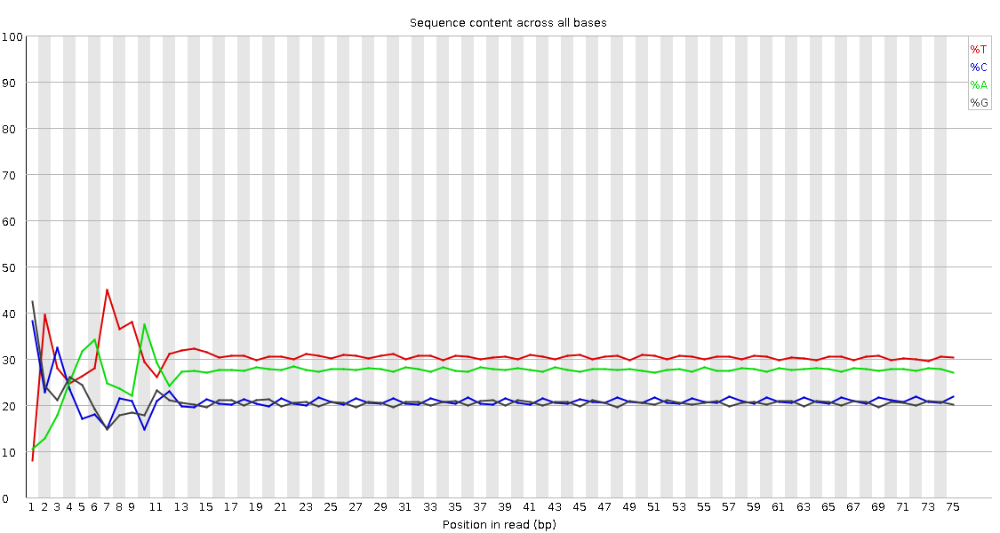

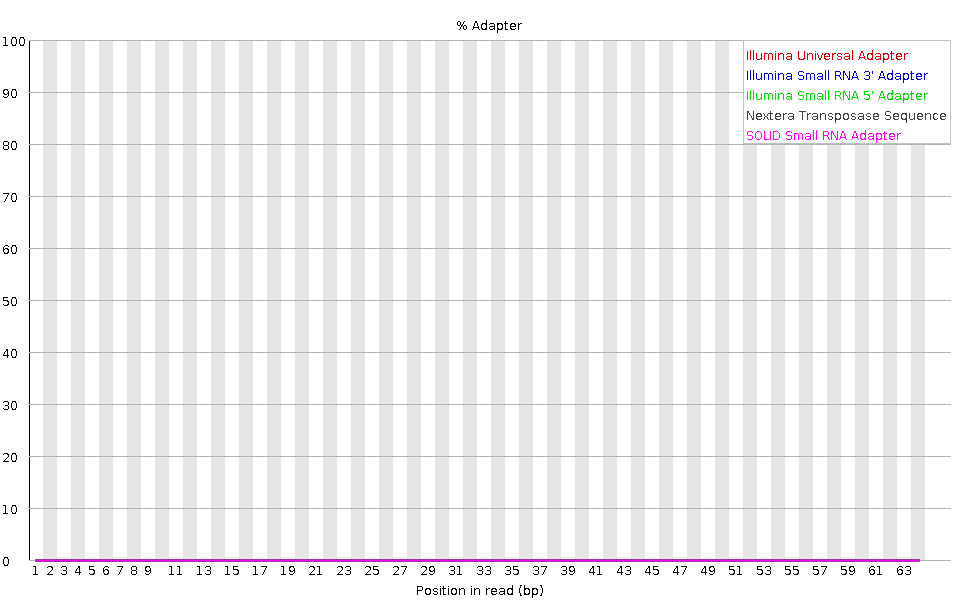

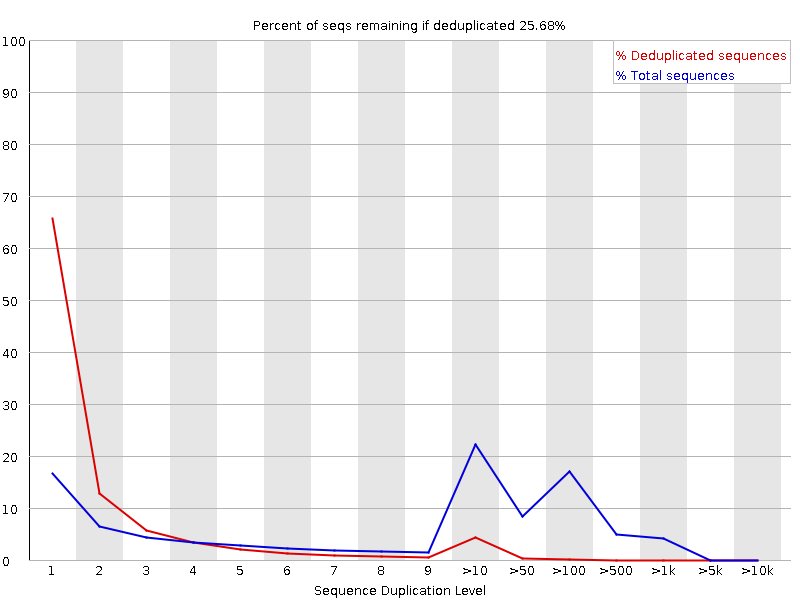

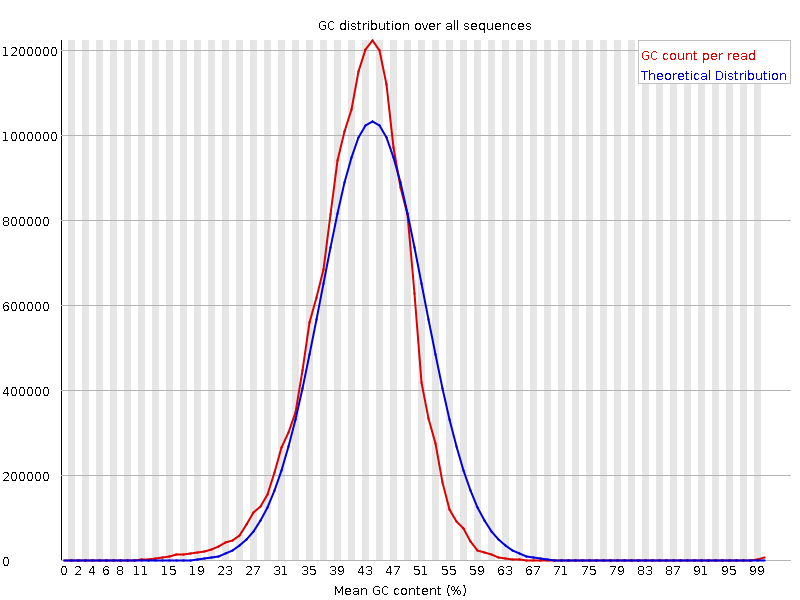

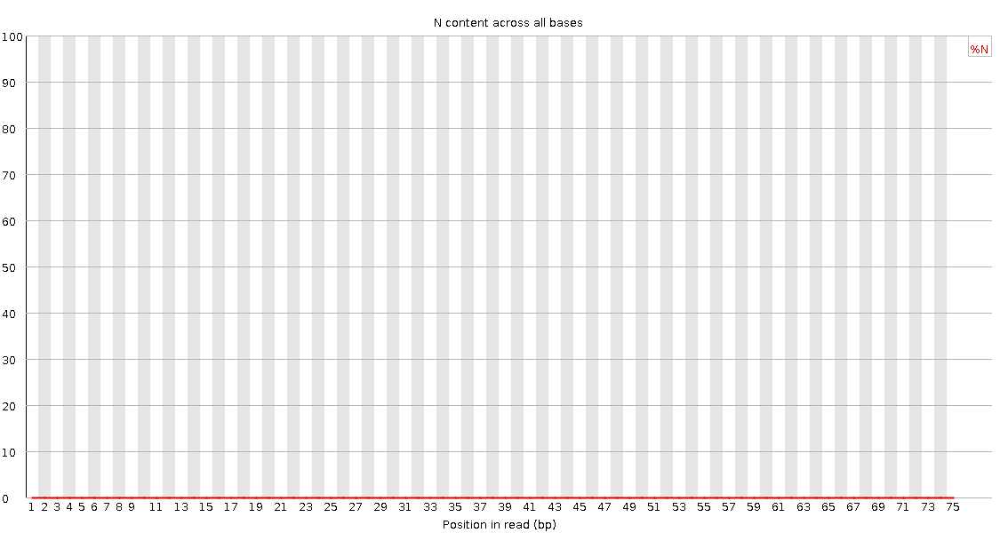

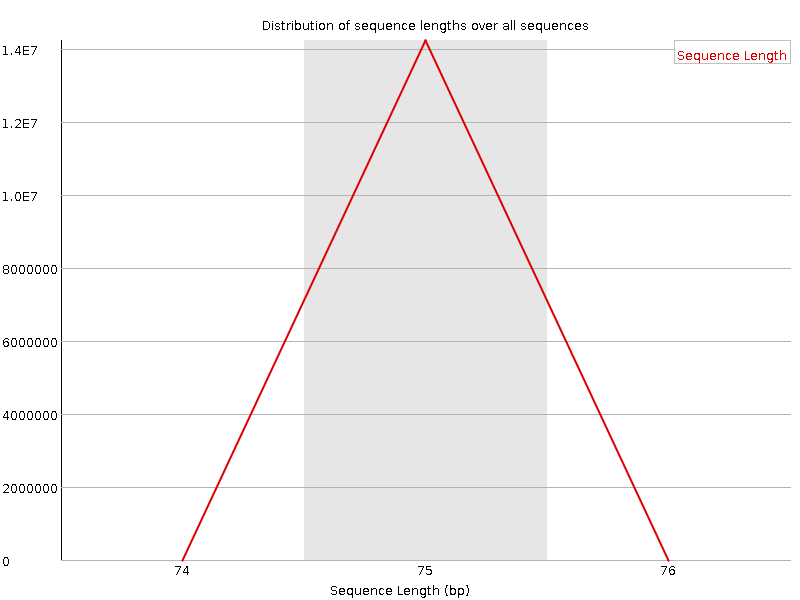

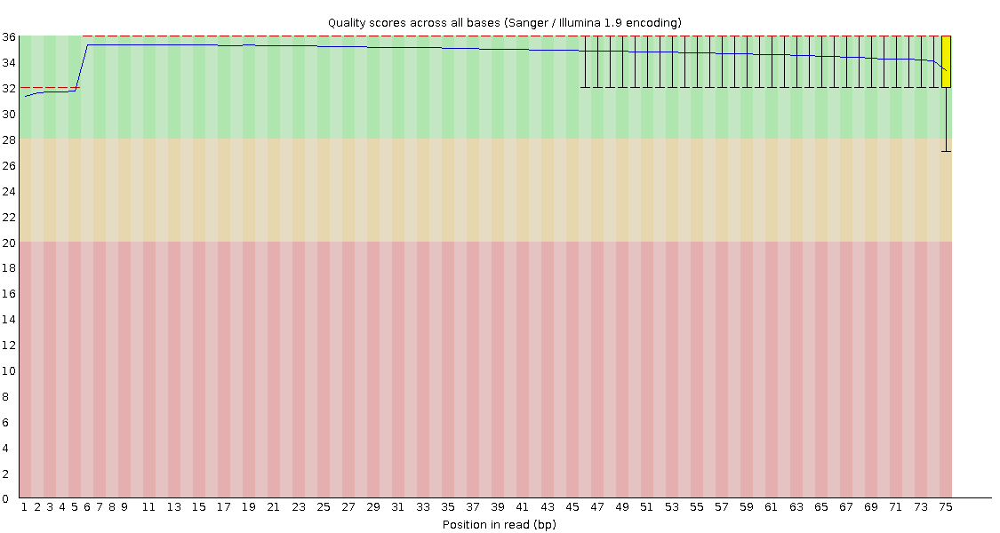

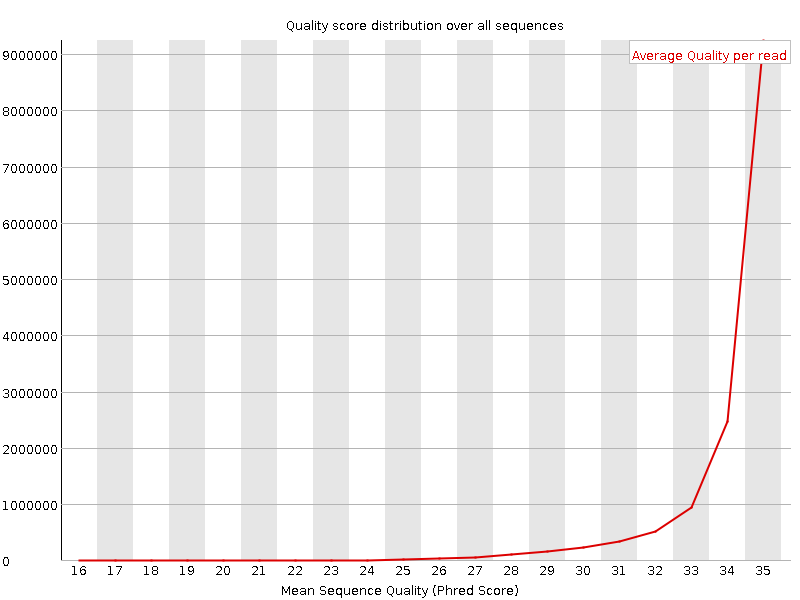

---------------------------------- Reverse Pass ----------------------------------


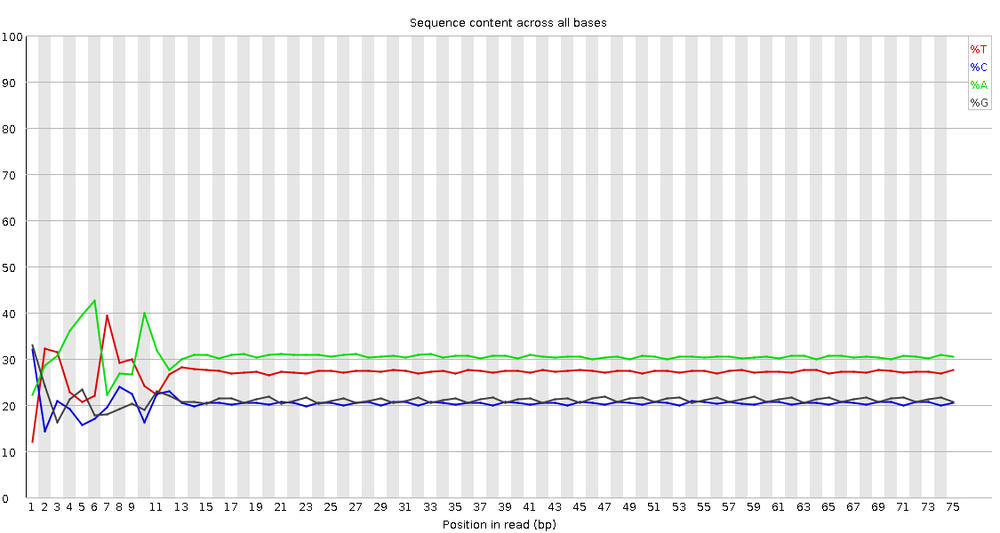

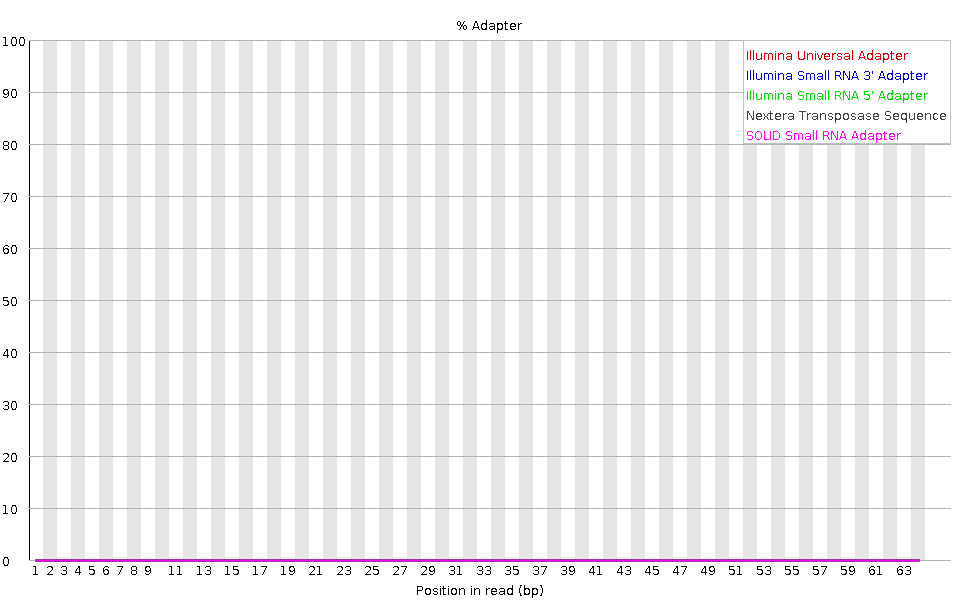

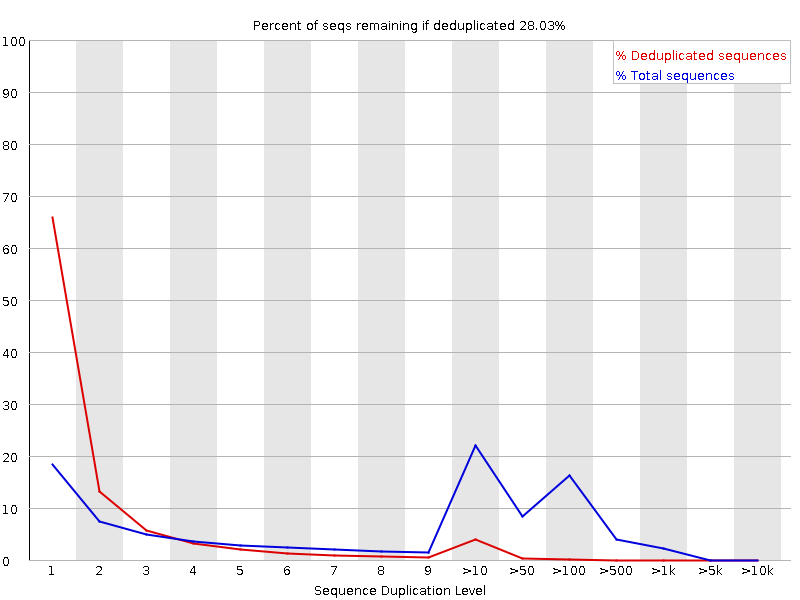

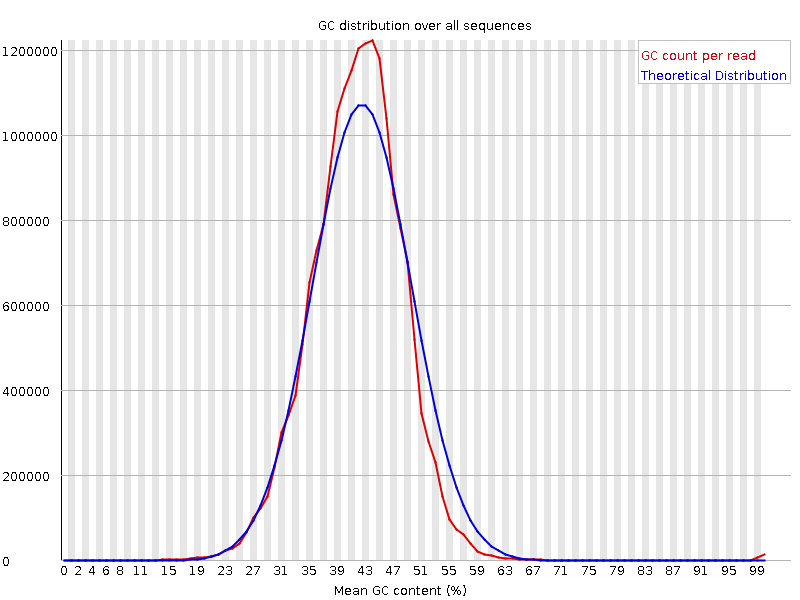

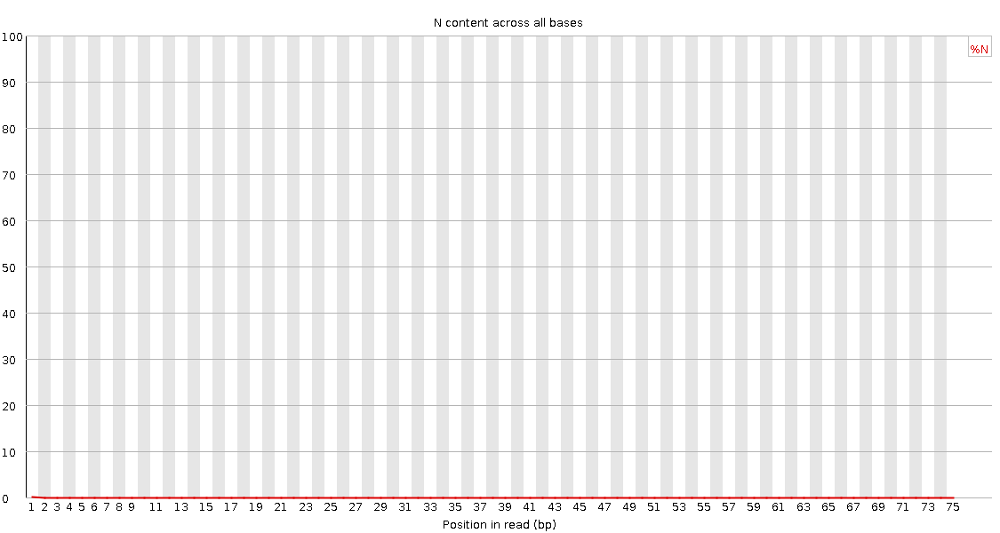

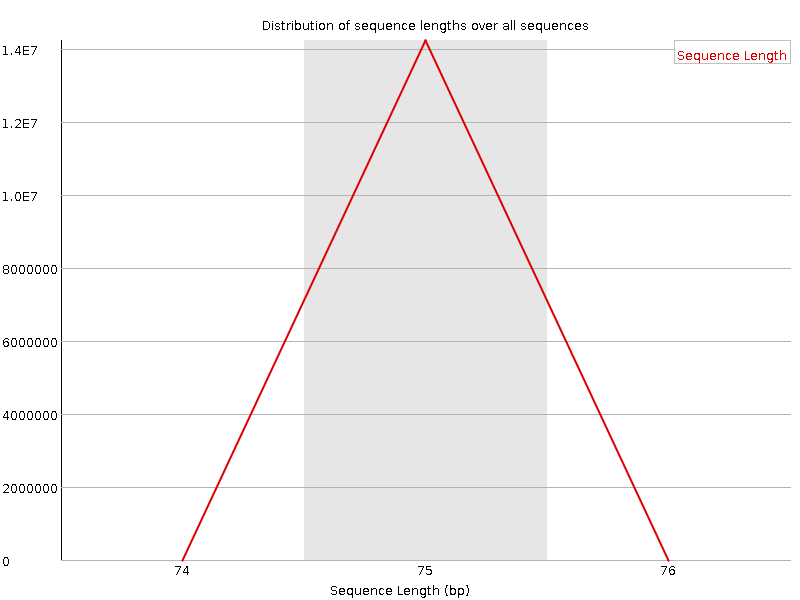

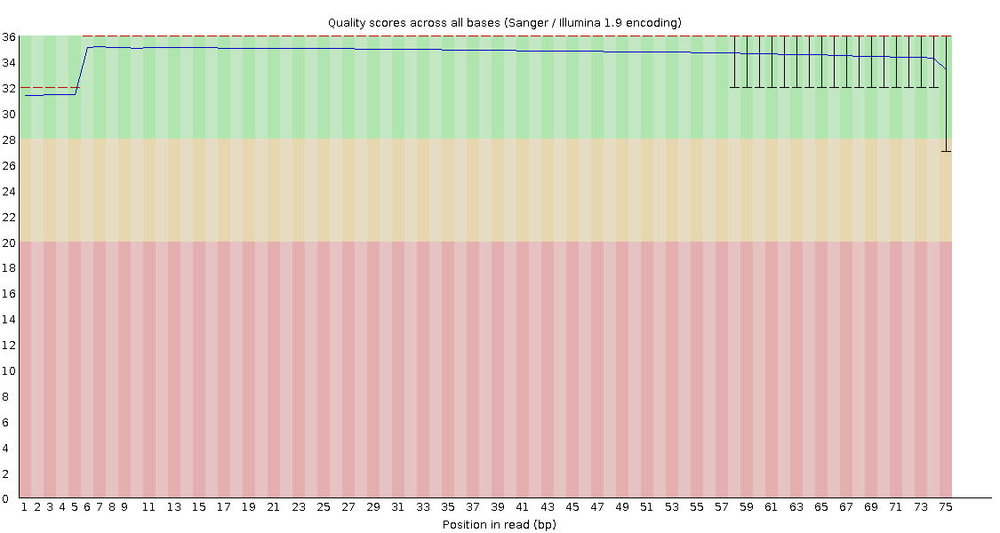

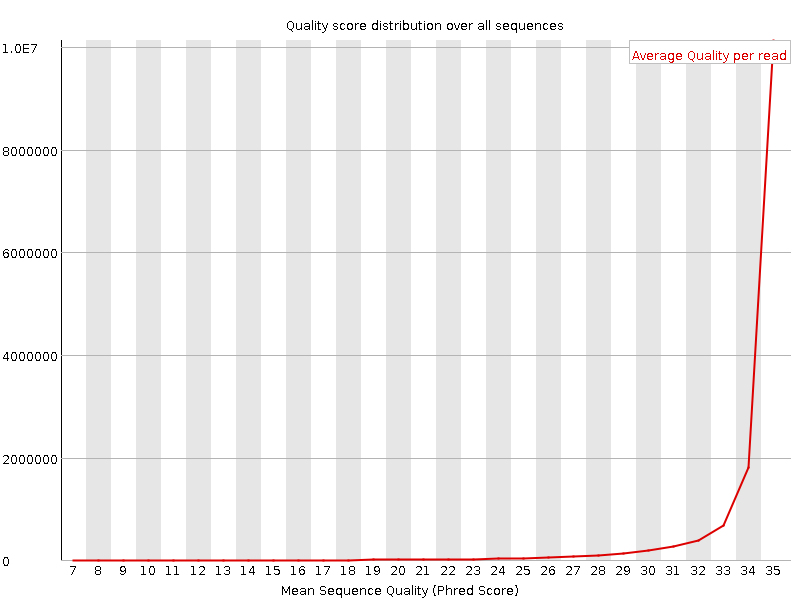

Run: SRR7692240
---------------------------------- Forward Pass ----------------------------------


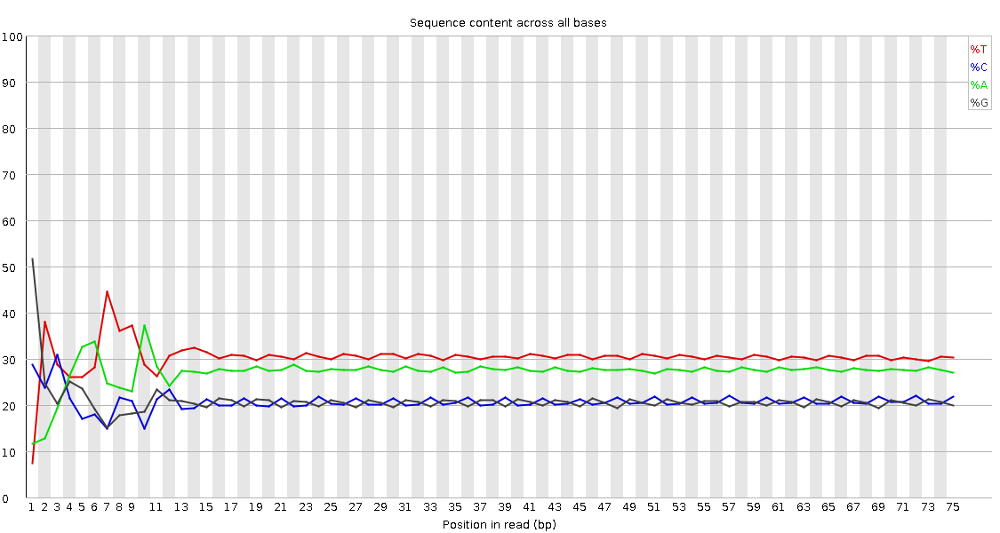

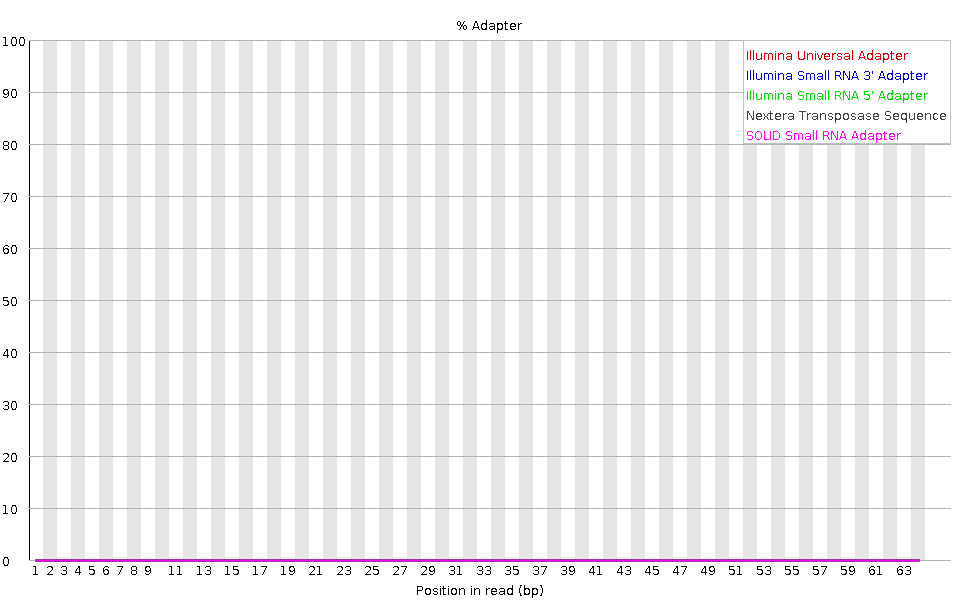

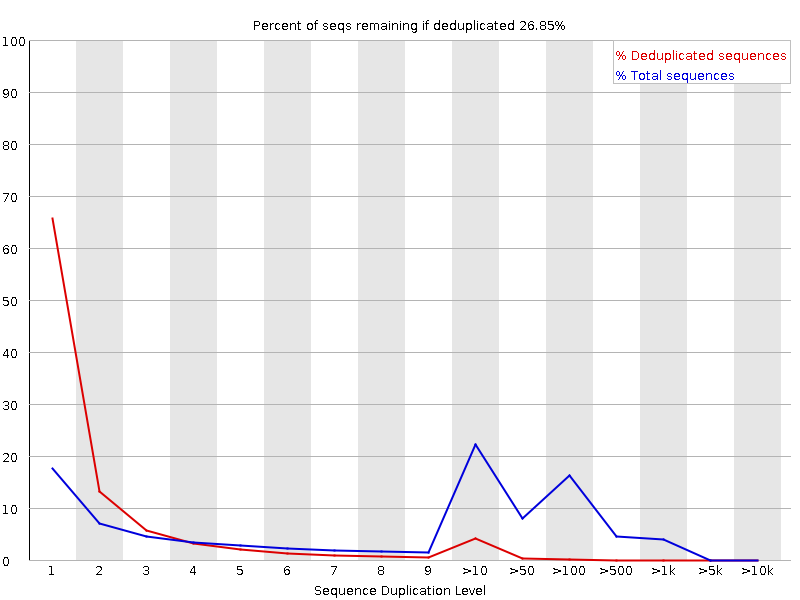

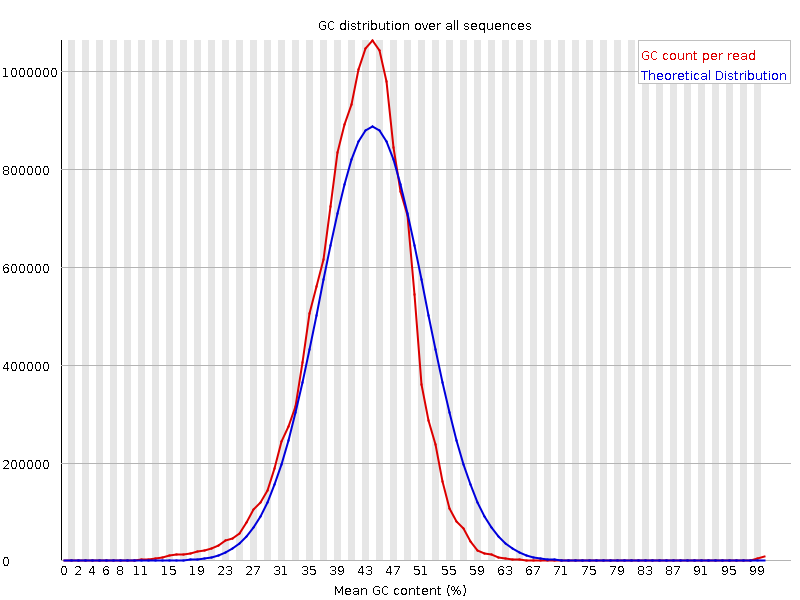

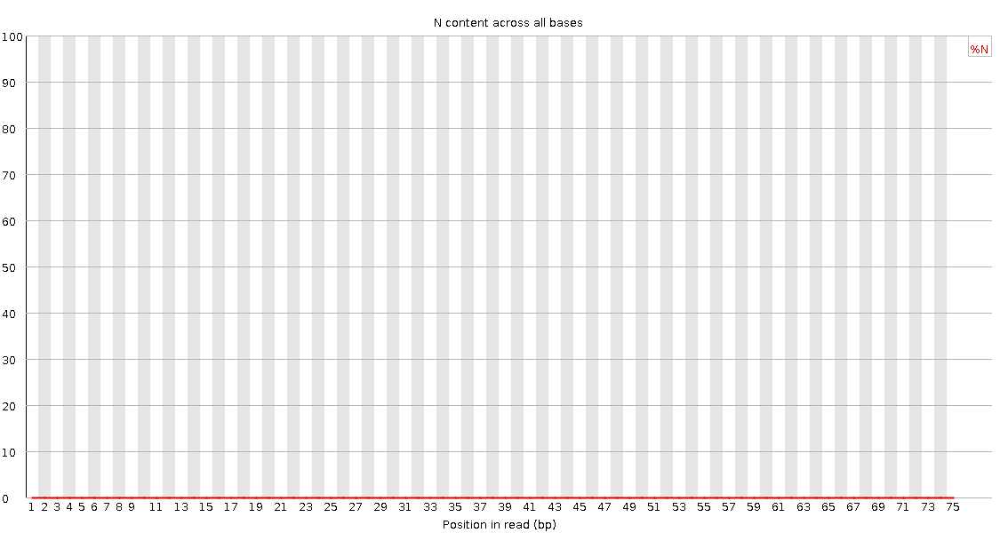

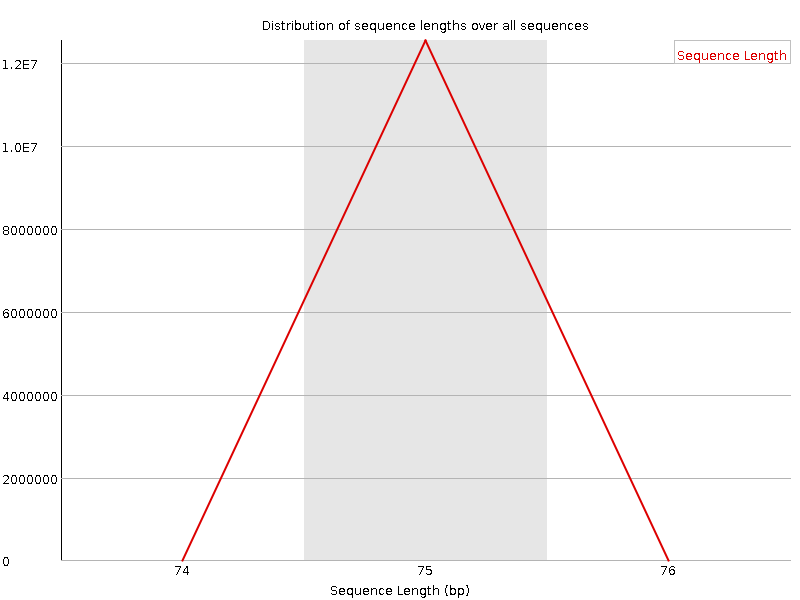

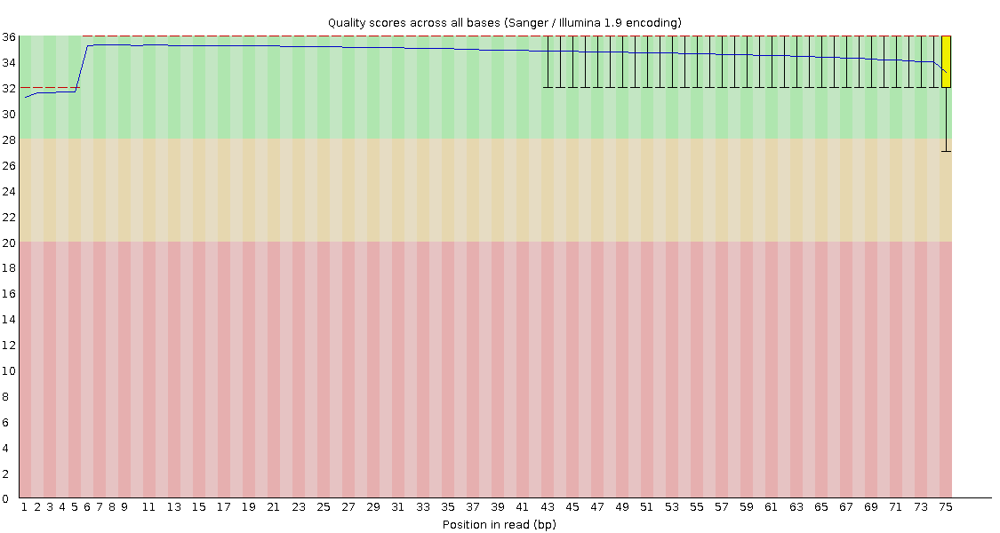

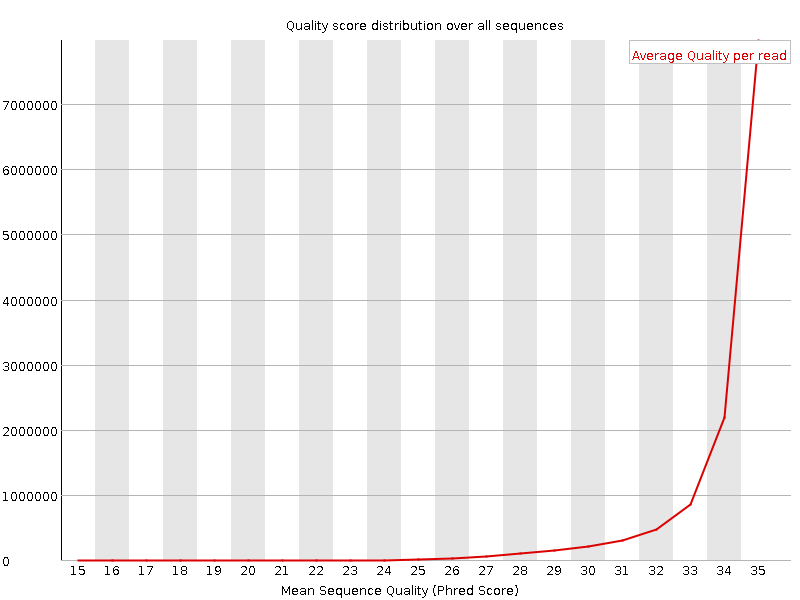

---------------------------------- Reverse Pass ----------------------------------


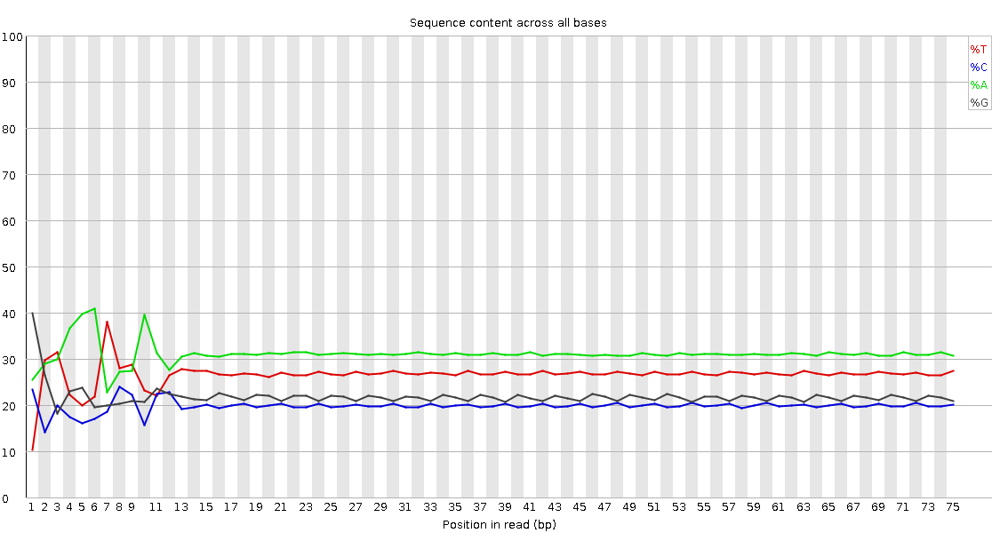

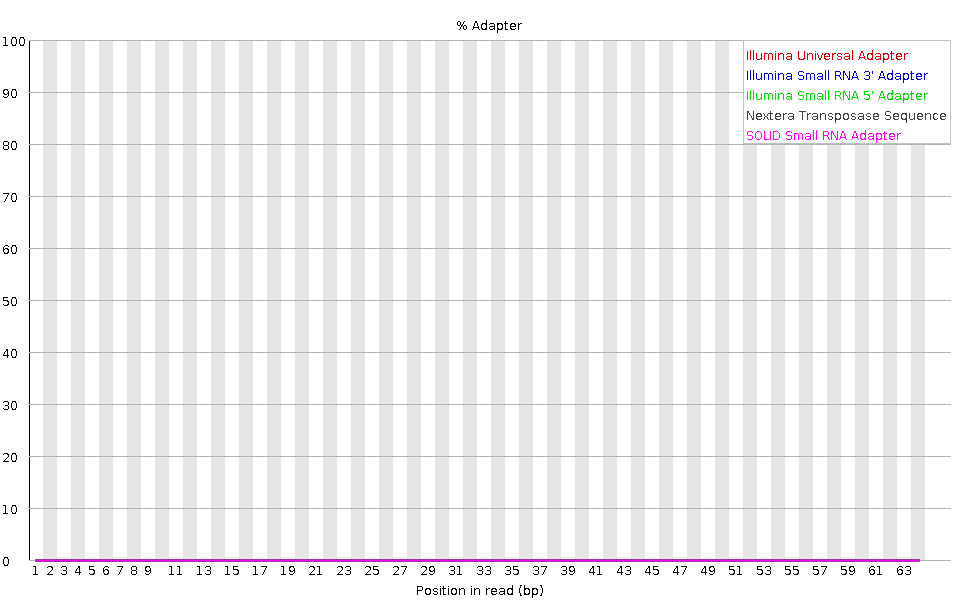

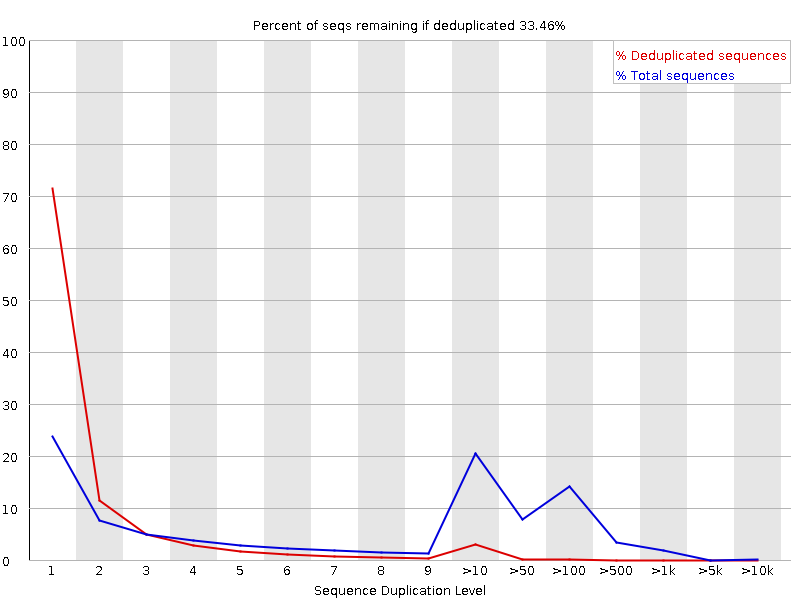

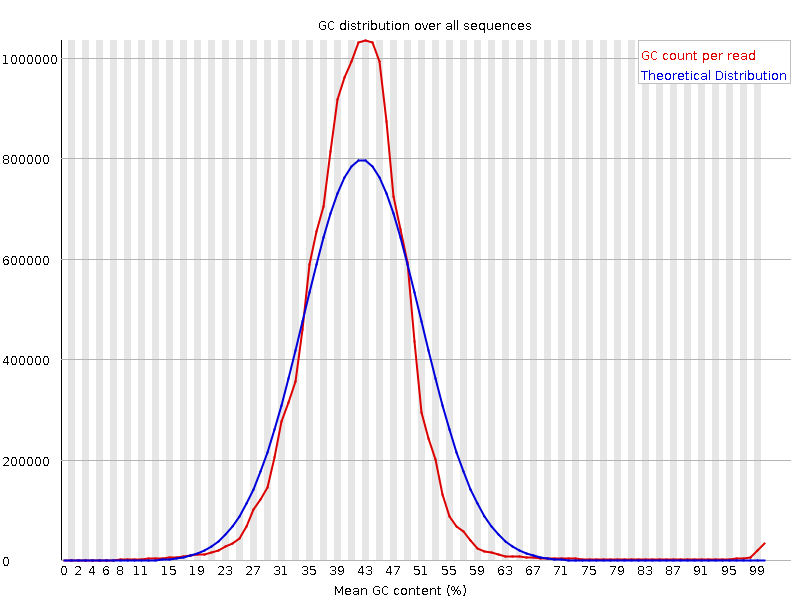

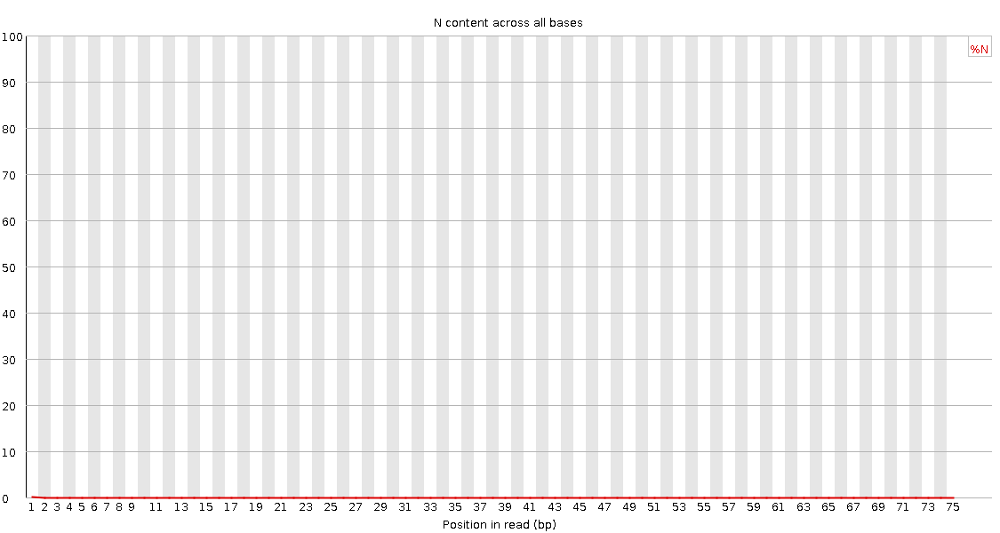

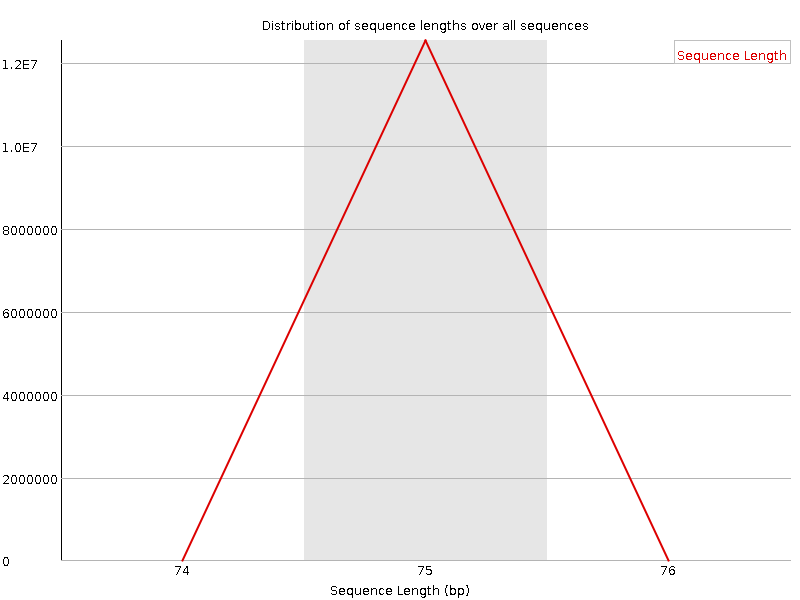

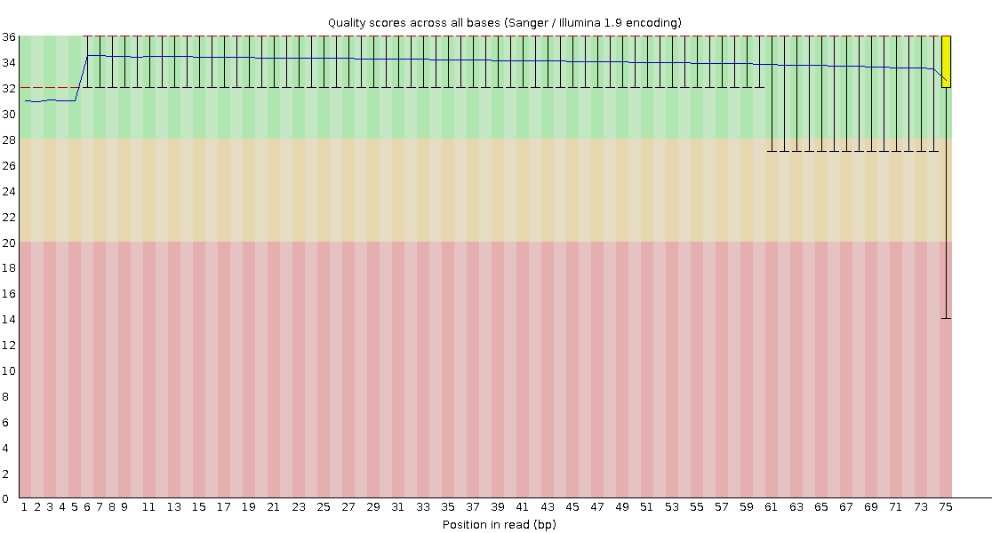

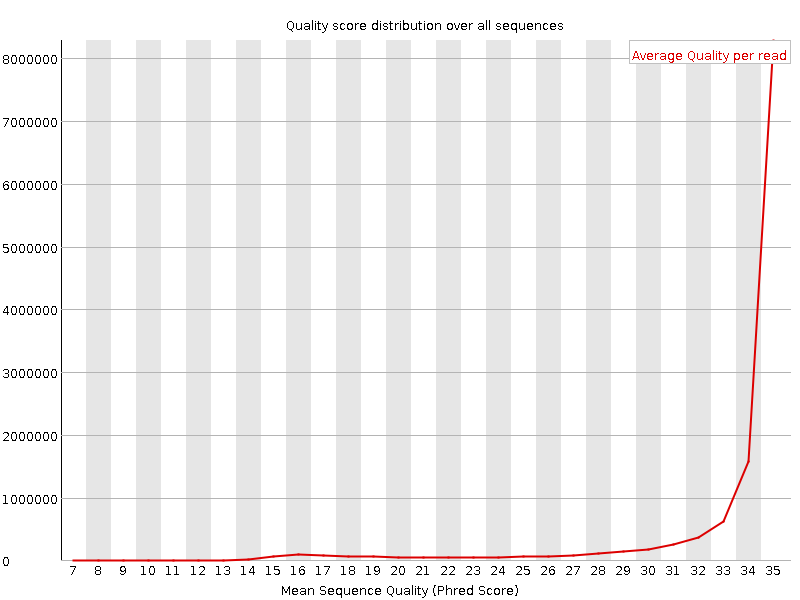

Run: SRR7692239
---------------------------------- Forward Pass ----------------------------------


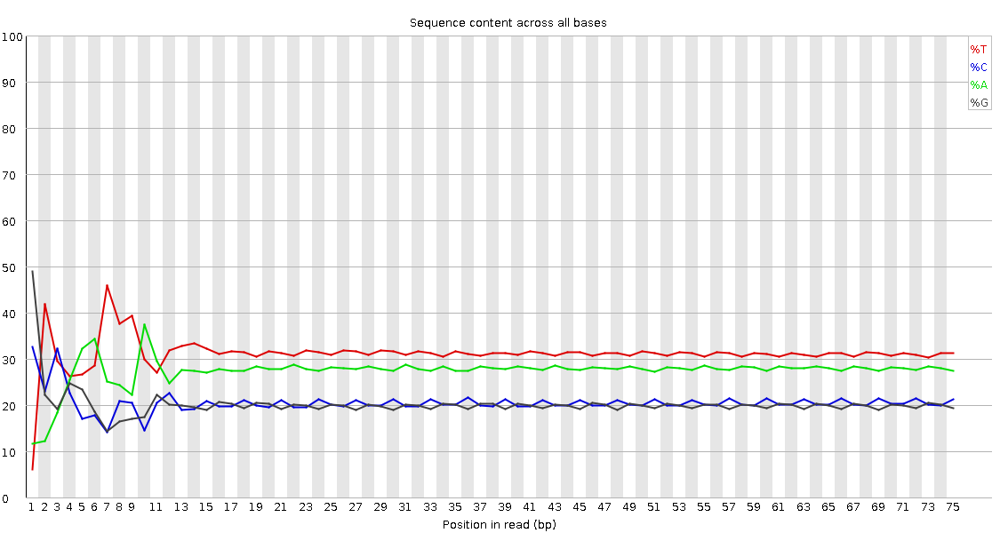

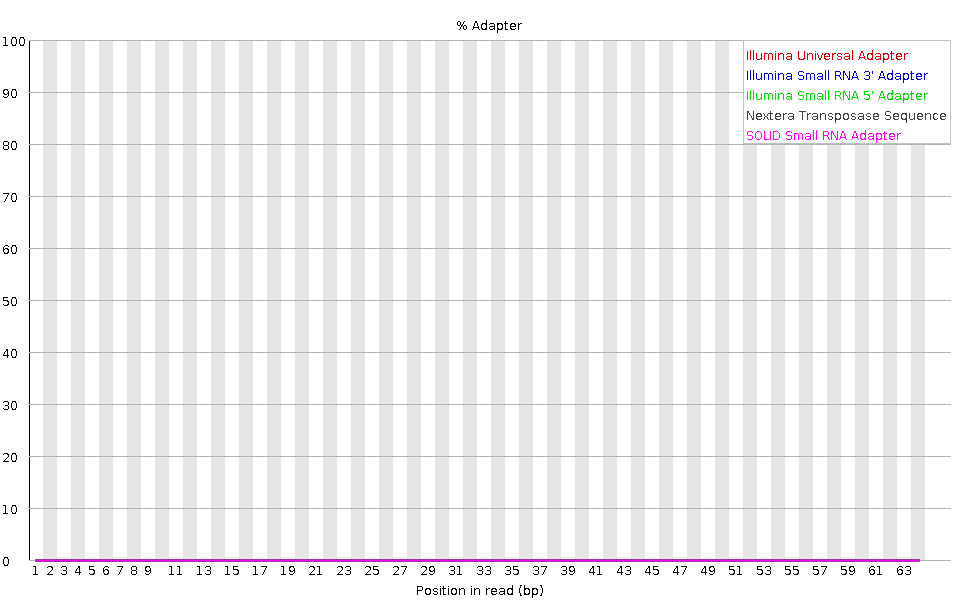

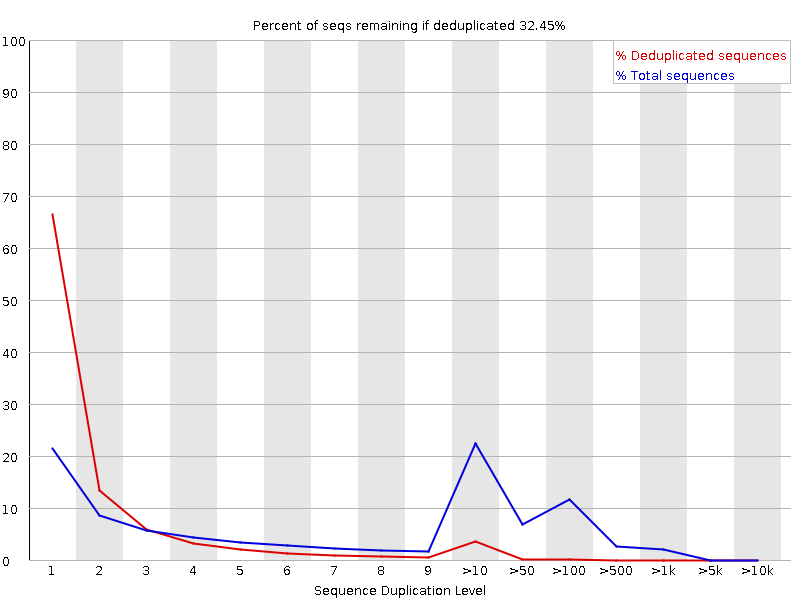

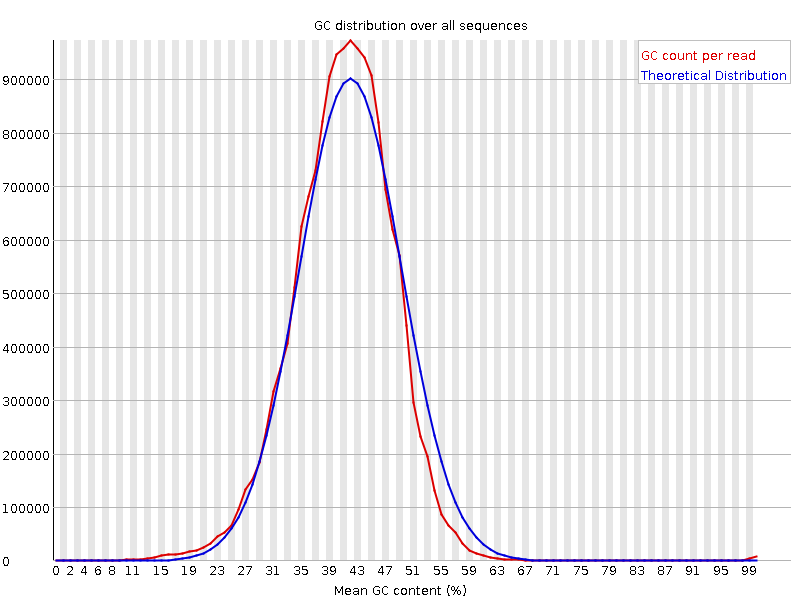

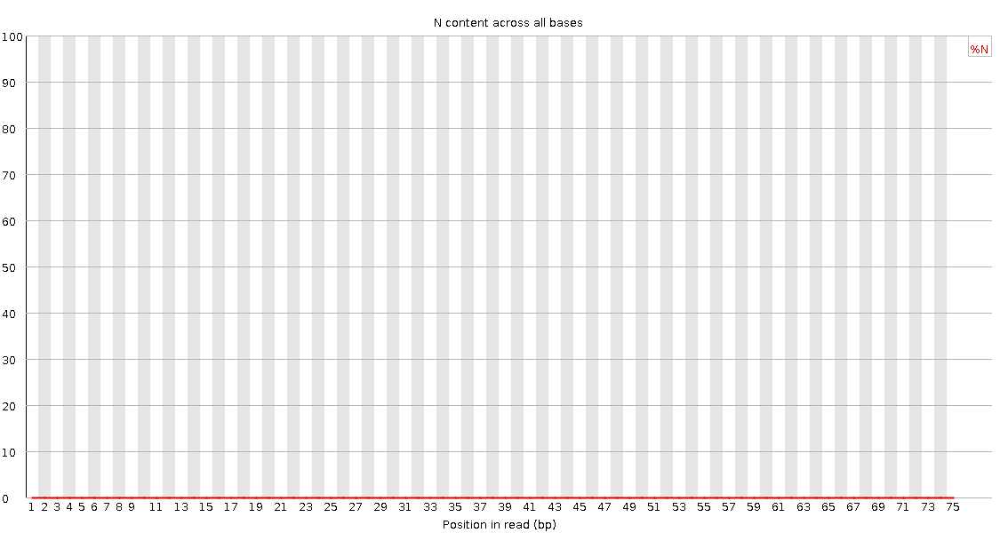

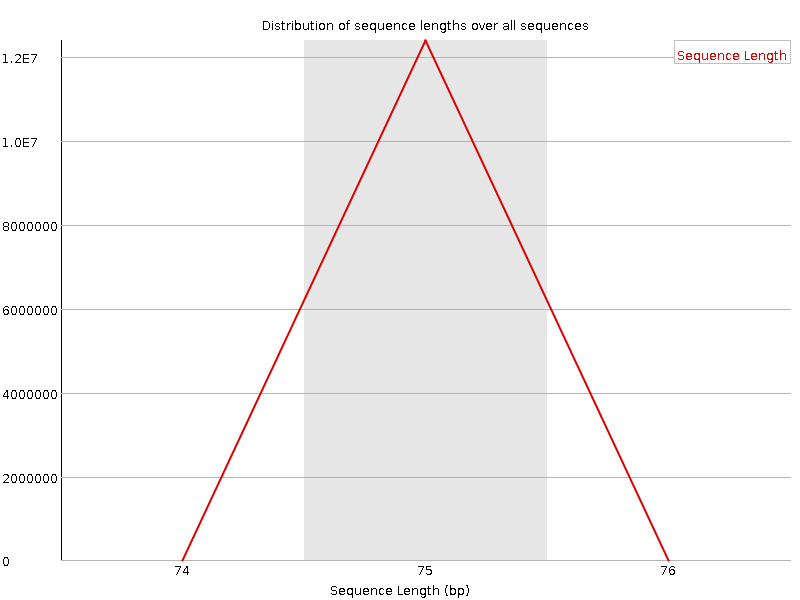

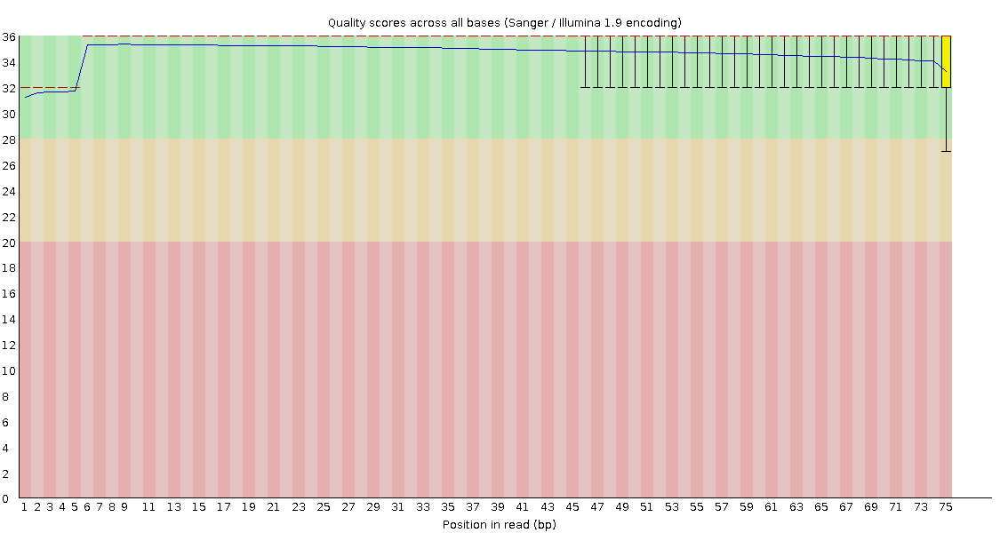

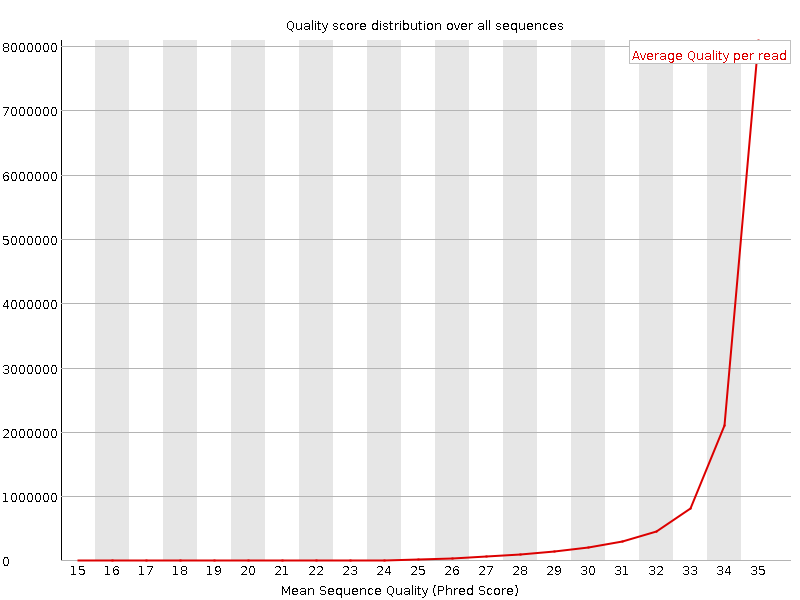

---------------------------------- Reverse Pass ----------------------------------


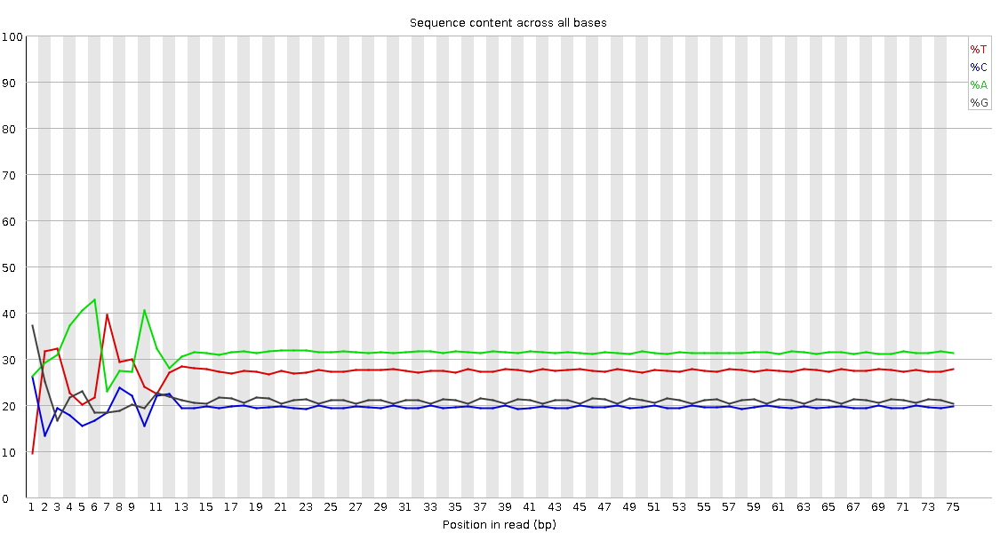

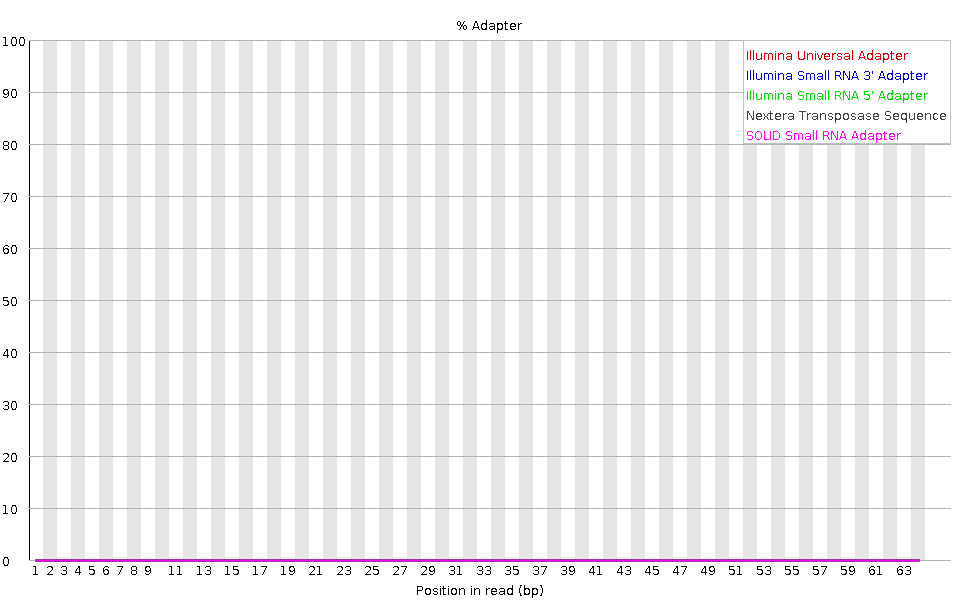

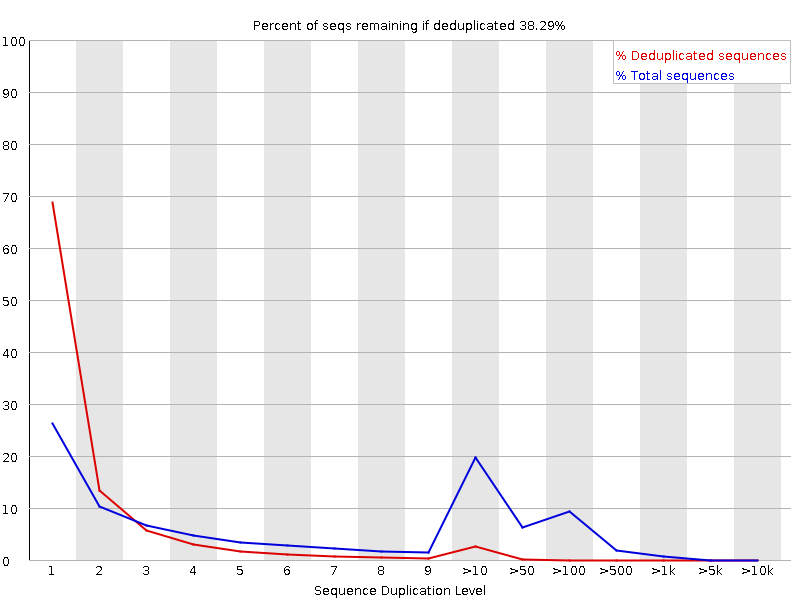

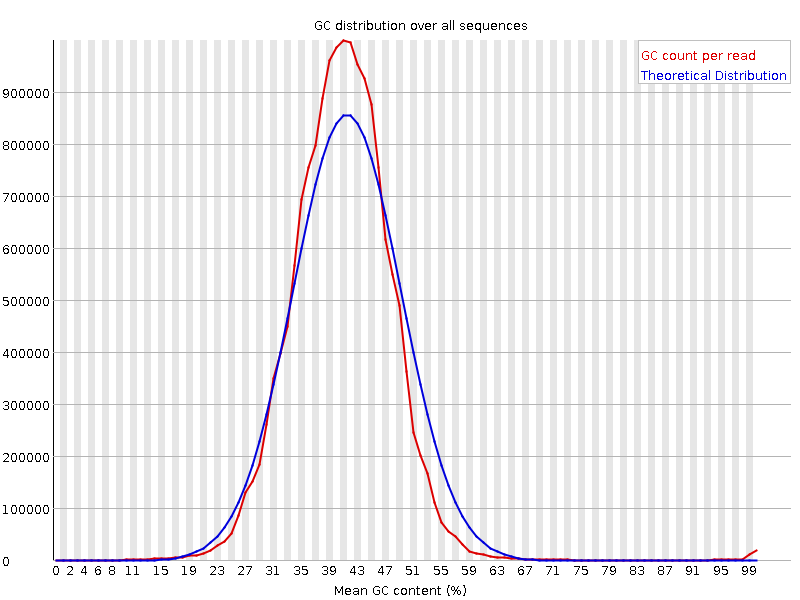

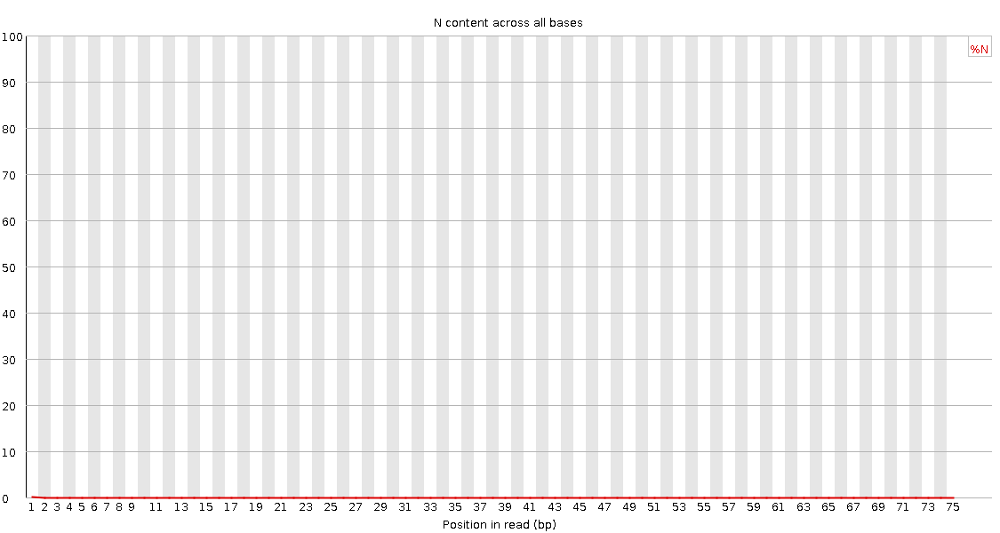

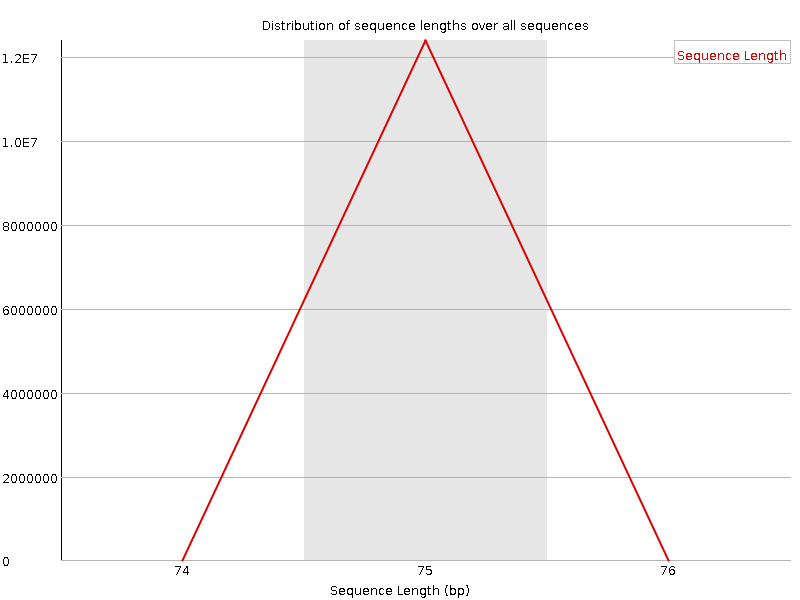

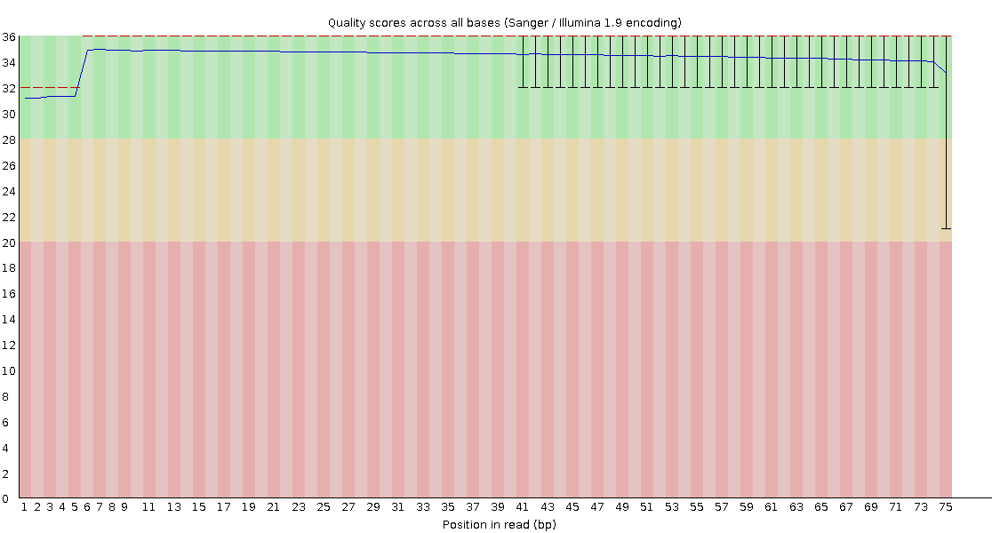

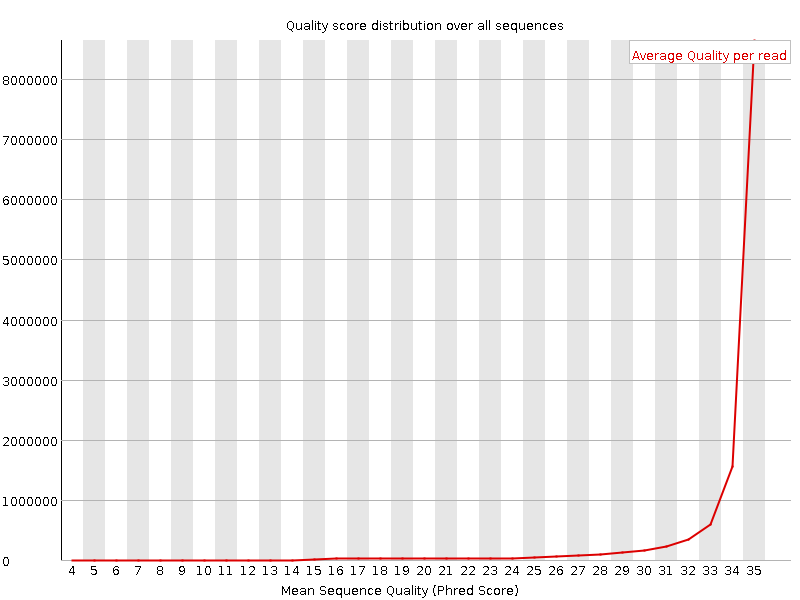

Run: SRR7692238
---------------------------------- Forward Pass ----------------------------------


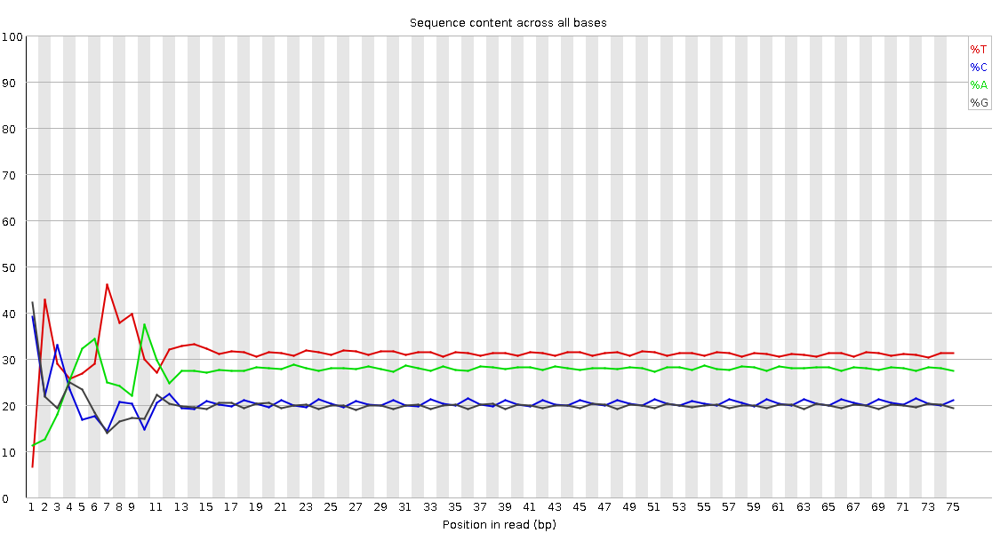

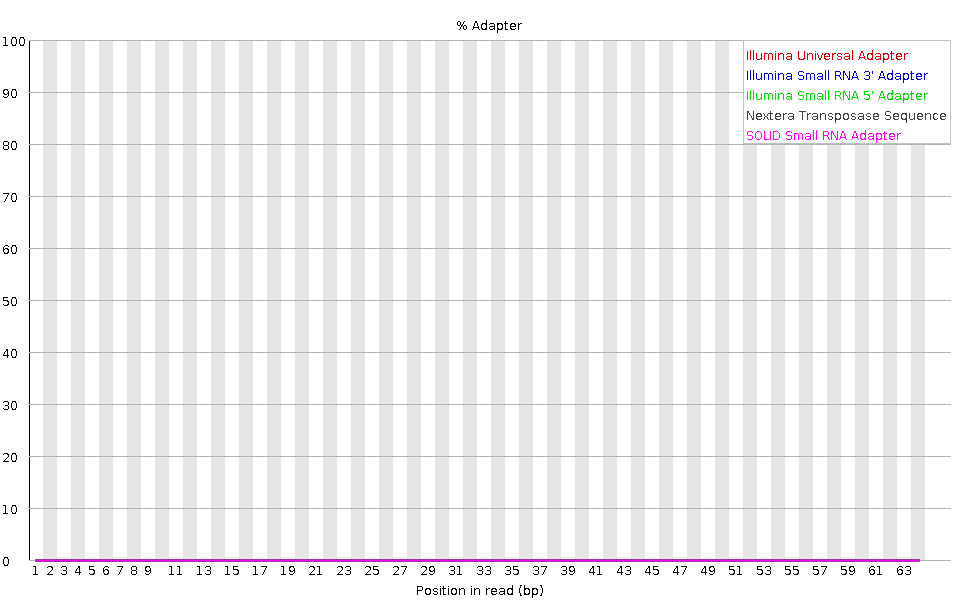

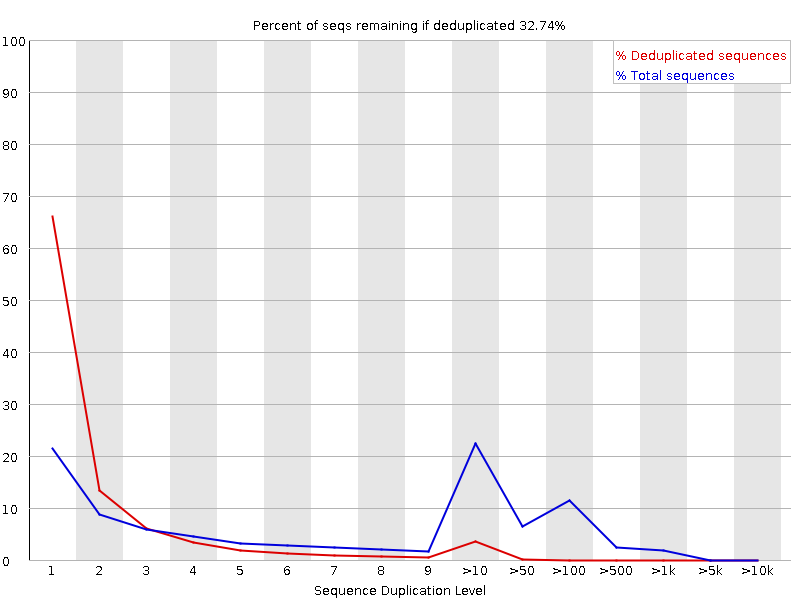

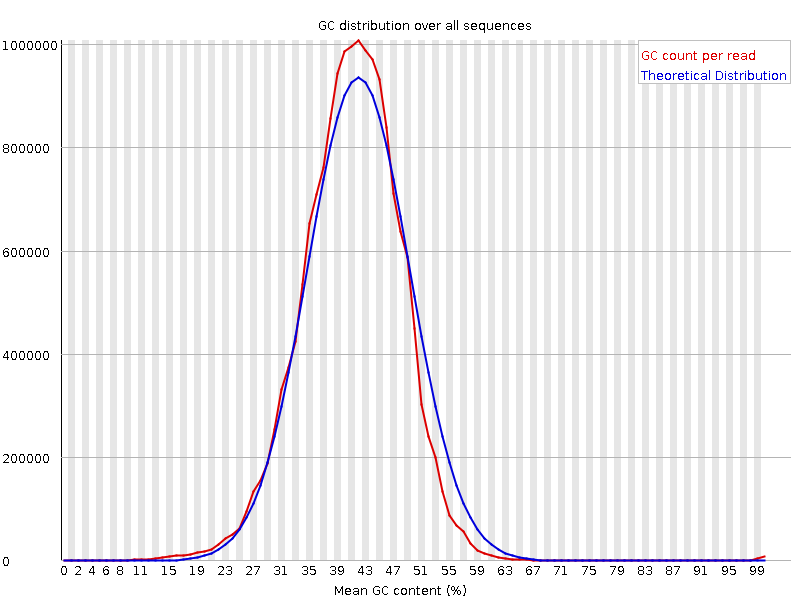

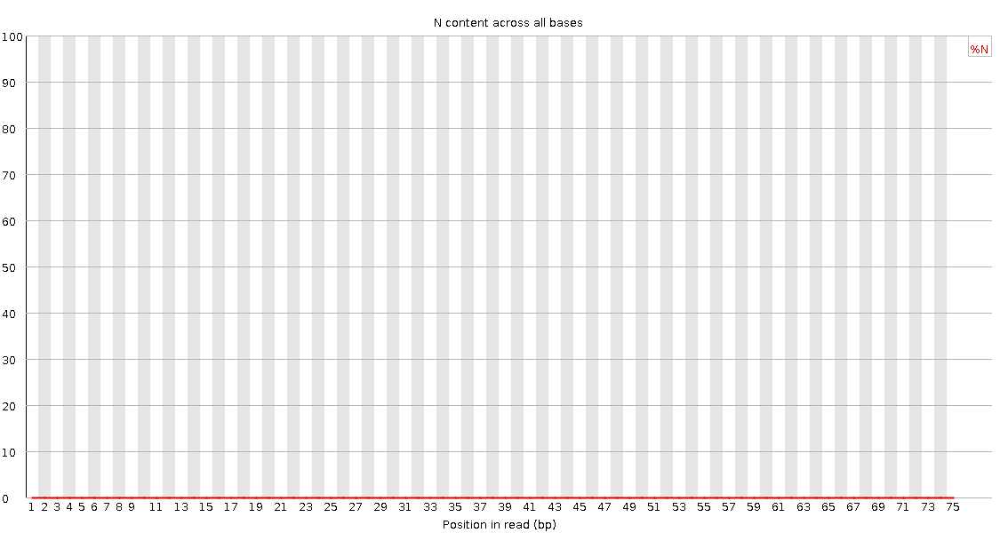

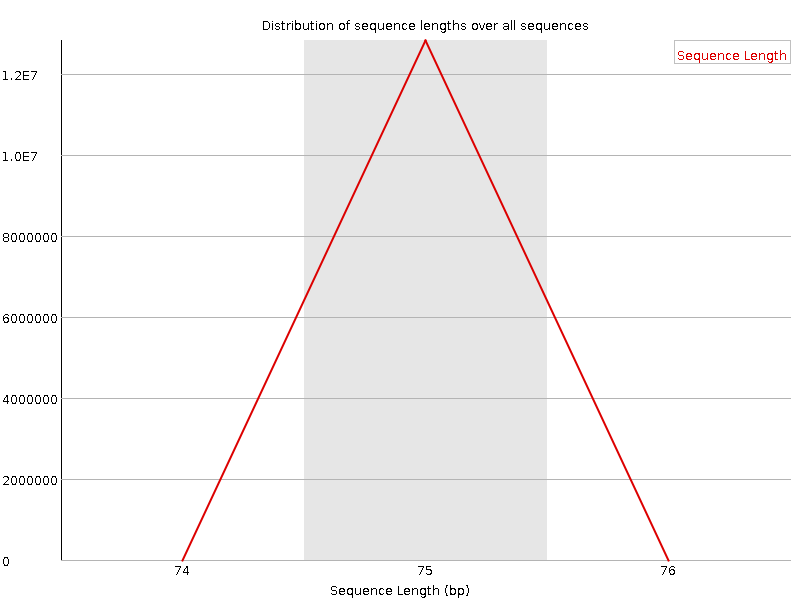

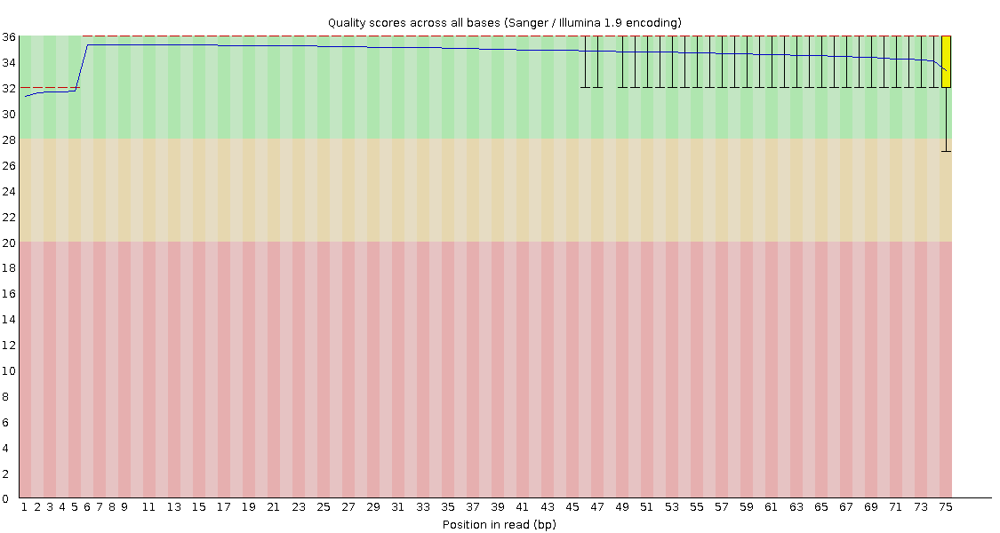

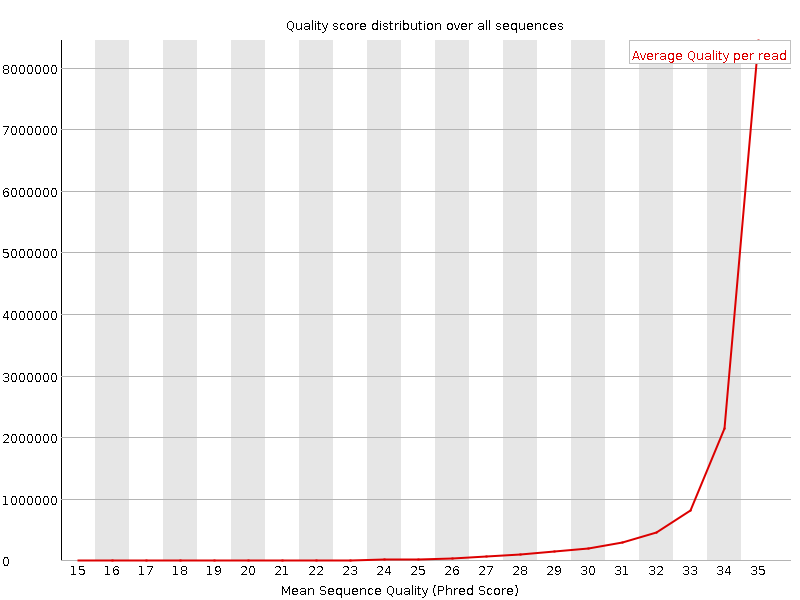

---------------------------------- Reverse Pass ----------------------------------


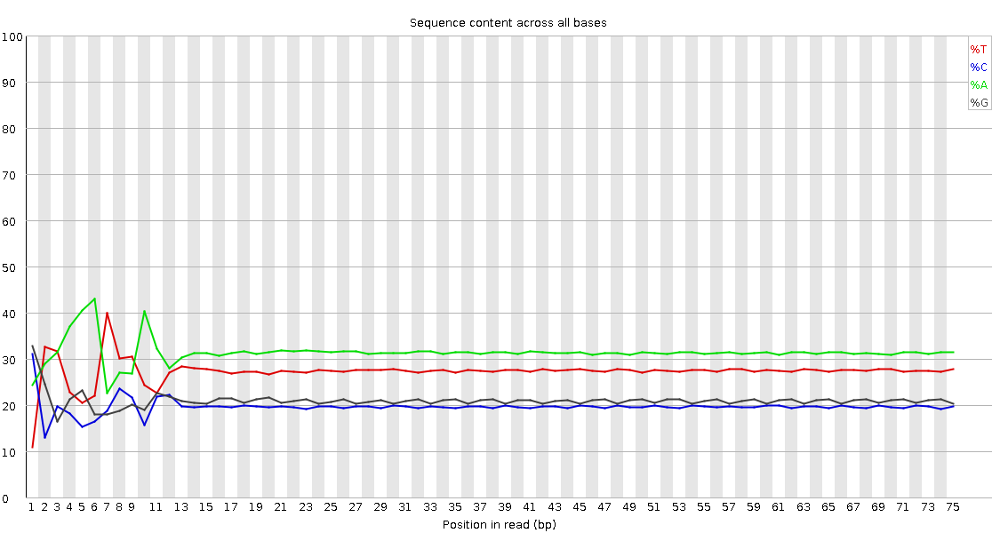

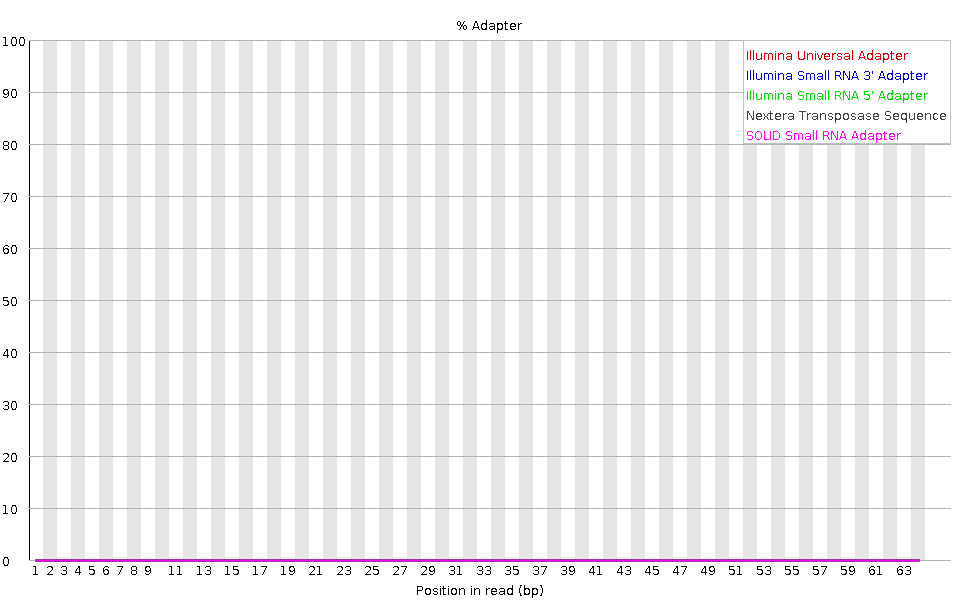

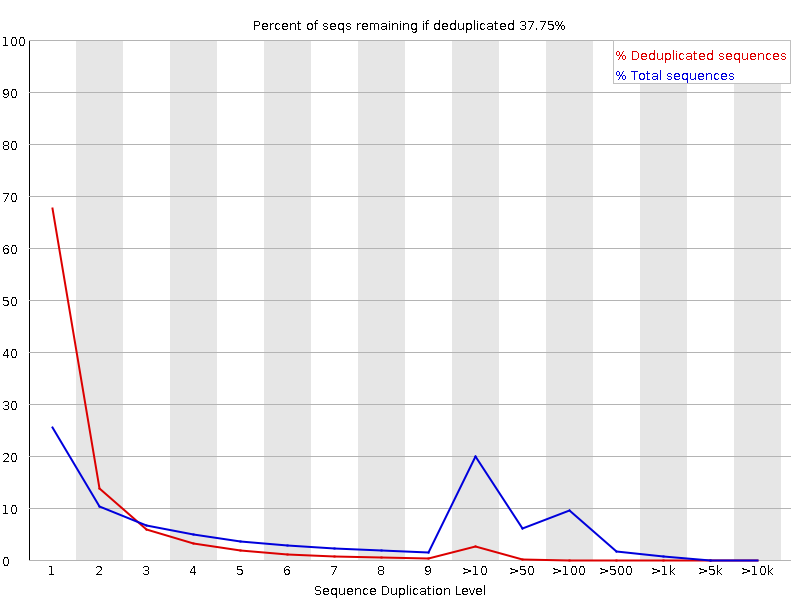

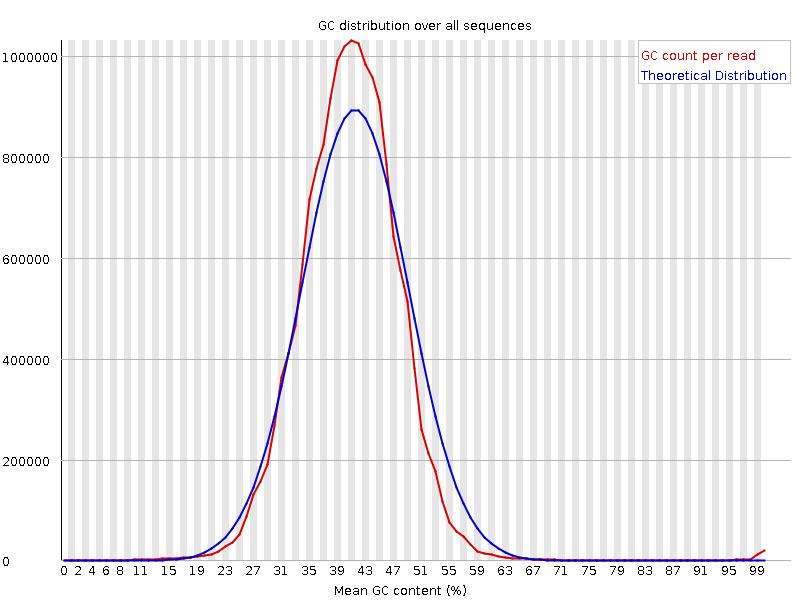

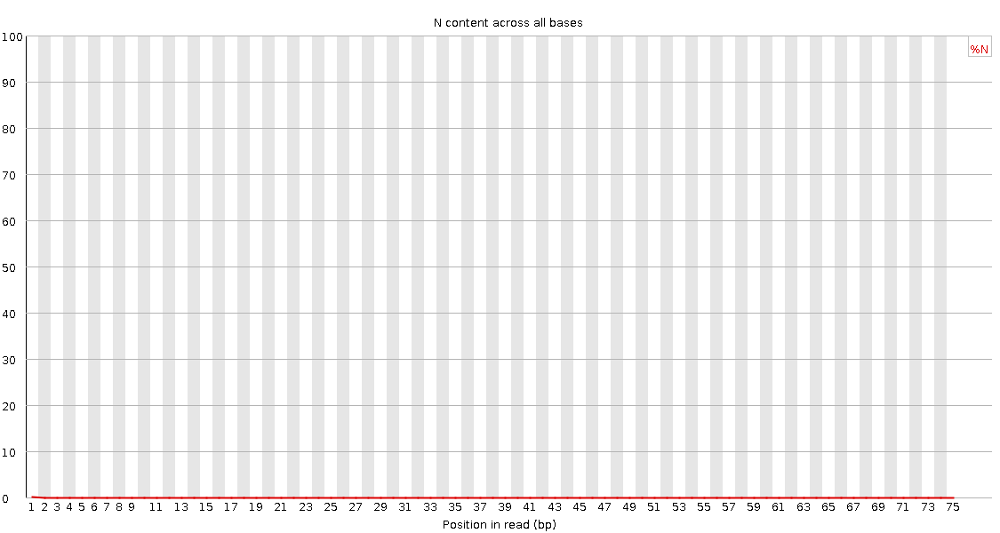

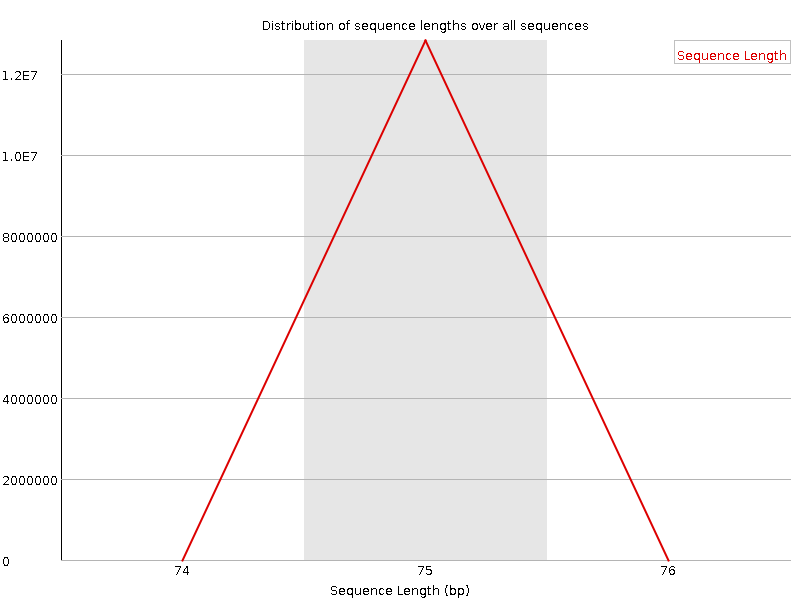

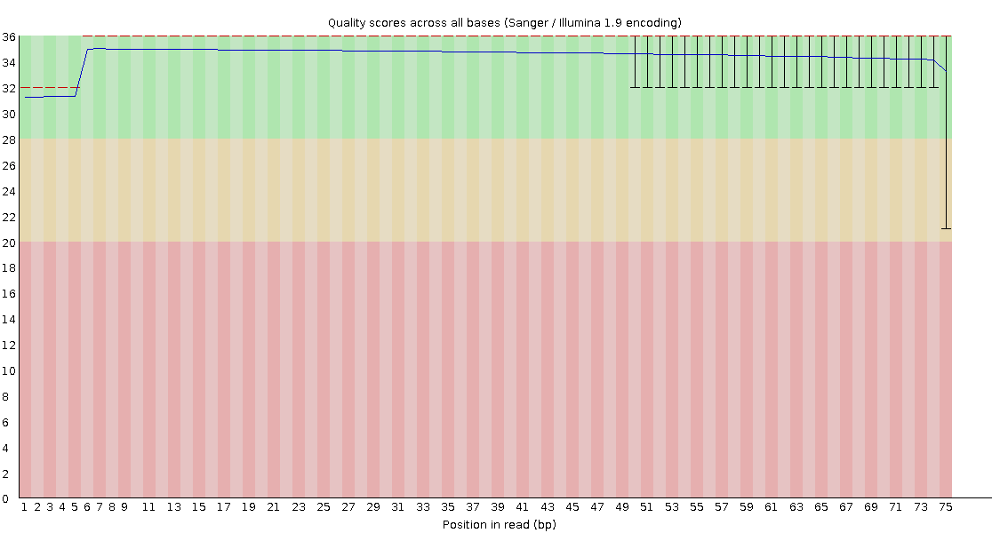

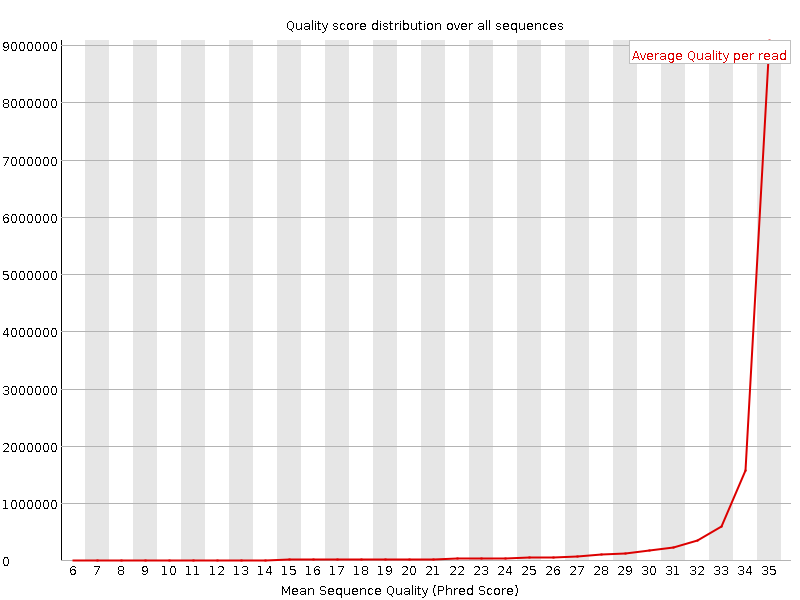

In [58]:
summary(run_numbers, qcfwd_path, qcrvs_path)
image(run_numbers, qcfwd_path, qcrvs_path)

We can check the quality of each run to make sure it's up to our standards. Luckily, the data for this particular study looks pretty good! This definitely will not be the case for all data you'll work with in the future, so let's set see if we can improve the quality.

### Trimmomatic with trimmomatic

Trimmomatic is a command-line tool for quality-based trimming of high-throughput sequencing data. Its primary purpose is to preprocess raw sequencing reads by removing low-quality regions, adapter sequences, and other unwanted artifacts.

We can obtain Trimmomatic from this website: (http://www.usadellab.org/cms/?page=trimmomatic). Make sure to have Java installed on your system as Trimmomatic is a Java-based tool. The current easiest way to install Trimmomatic is downloading a binary release zip, and unpacking it in a directory of your choice.


In [59]:
trimmomatic_path = "/home/sampresman/tools/Trimmomatic-0.39"

In [60]:
def trim(trim_fastq_ds, trimmomatic_p, fwd_q, rvs_q):    
    """
    Perform adapter trimming and quality filtering using Trimmomatic on paired-end FASTQ files.

    Args:
        trim_fastq_ds (list): A list of directories where trimmed FASTQ files will be saved.
        trimmomatic_p (str): Path to the Trimmomatic JAR file and its dependencies.
        fwd_q (list): A list of paths to the forward FASTQ files for each sample.
        rvs_q (list): A list of paths to the reverse FASTQ files for each sample.

    Returns:
        tuple: A tuple containing lists of paths to the trimmed paired-end FASTQ files for each sample.

    Note:
        This function performs adapter trimming, quality filtering, and paired-end read alignment
        using Trimmomatic. It checks if the trimmed FASTQ files already exist and skips trimming if they are present.

    Example:
        To perform adapter trimming and quality filtering on paired-end FASTQ files:

        >>> trim(["/path/to/trimmed_output1", "/path/to/trimmed_output2"], "/path/to/trimmomatic", ["/path/to/forward1.fastq", "/path/to/forward2.fastq"], ["/path/to/reverse1.fastq", "/path/to/reverse2.fastq"])

    """

    p_f_l = []
    p_r_l = []

    for i, trim_fastq_d in enumerate(trim_fastq_ds):
        paired_fwd_path = os.path.join(trim_fastq_d, "output_forward_paired.fq.gz")
        unpaired_fwd_path = os.path.join(trim_fastq_d, "output_forward_unpaired.fq.gz")
        paired_rev_path = os.path.join(trim_fastq_d, "output_reverse_paired.fq.gz")
        unpaired_rev_path = os.path.join(trim_fastq_d, "output_reverse_unpaired.fq.gz")
    
    
        if not os.path.isfile(paired_fwd_path) or not os.path.isfile(unpaired_fwd_path) or not os.path.isfile(paired_rev_path) or not os.path.isfile(unpaired_rev_path):
    
            trimmomatic_command = [
            "java", "-jar",
            os.path.join(trimmomatic_p, "trimmomatic-0.39.jar"),
            "PE",                        
            fwd_q[i], 
            rvs_q[i],
            paired_fwd_path,   
            unpaired_fwd_path,
            paired_rev_path, 
            unpaired_rev_path,
            f"ILLUMINACLIP:{os.path.join(trimmomatic_p, 'adapters', 'TruSeq3-PE.fa')}:2:30:10",  
            "LEADING:2",                 
            "TRAILING:2",               
            "SLIDINGWINDOW:4:10",        
            "MINLEN:36"                 
            ]
            
    
            
            try:
                subprocess.run(trimmomatic_command, check=True)
                print("Trimmomatic completed successfully.")
                
            except subprocess.CalledProcessError as e:
                print("Error: Trimmomatic failed.")
                print(e)
            
        else:
            print("Trimmed FastQ are already downloaded.")

        p_f_l.append(paired_fwd_path)
        p_r_l.append(paired_rev_path)

    return p_f_l, p_r_l

In [61]:
forward_trimmed_q, reverse_trimmed_q = trim(trimmed_fastq_dir, trimmomatic_path, forward_q, reverse_q)

Trimmed FastQ are already downloaded.
Trimmed FastQ are already downloaded.
Trimmed FastQ are already downloaded.
Trimmed FastQ are already downloaded.


We have output the trimmed reads into separate directories to keep track of them. 

### More Quality Control

Now that we have our trimmed sequences, we can check the trimmed data to see if our quality improved!

In [62]:
qcfwd_trimmed_path, qcrvs_trimmed_path = run_fastqc(trimmed_data_dir, run_numbers, forward_trimmed_q, reverse_trimmed_q, fastqc_executable)

FastQCs for SRR7692241 are already downloaded.
FastQCs for SRR7692240 are already downloaded.
FastQCs for SRR7692239 are already downloaded.
FastQCs for SRR7692238 are already downloaded.


Run: SRR7692241
---------------------------------- Forward Pass ----------------------------------

PASS	Basic Statistics	output_forward_paired.fq.gz
PASS	Per base sequence quality	output_forward_paired.fq.gz
PASS	Per sequence quality scores	output_forward_paired.fq.gz
FAIL	Per base sequence content	output_forward_paired.fq.gz
WARN	Per sequence GC content	output_forward_paired.fq.gz
PASS	Per base N content	output_forward_paired.fq.gz
WARN	Sequence Length Distribution	output_forward_paired.fq.gz
FAIL	Sequence Duplication Levels	output_forward_paired.fq.gz
PASS	Overrepresented sequences	output_forward_paired.fq.gz
PASS	Adapter Content	output_forward_paired.fq.gz

---------------------------------- Reverse Pass ----------------------------------

PASS	Basic Statistics	output_reverse_paired.fq.gz
PASS	Per base sequence quality	output_reverse_paired.fq.gz
PASS	Per sequence quality scores	output_reverse_paired.fq.gz
FAIL	Per base sequence content	output_reverse_paired.fq.gz
PASS	Per sequence

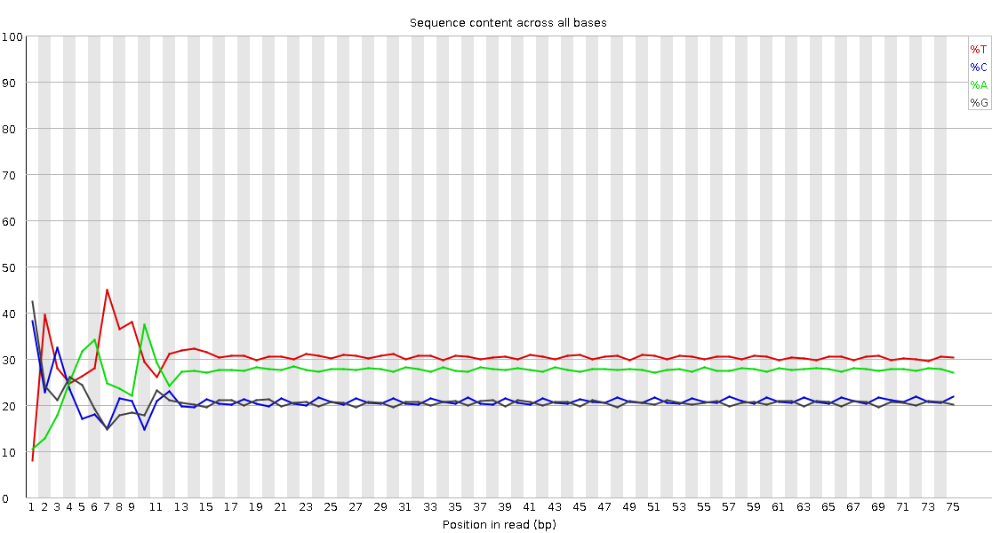

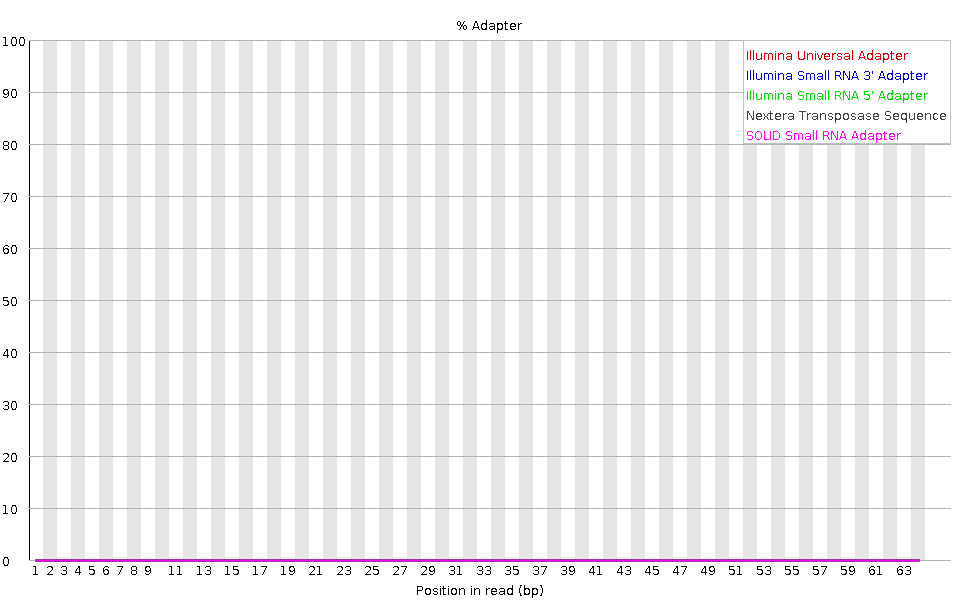

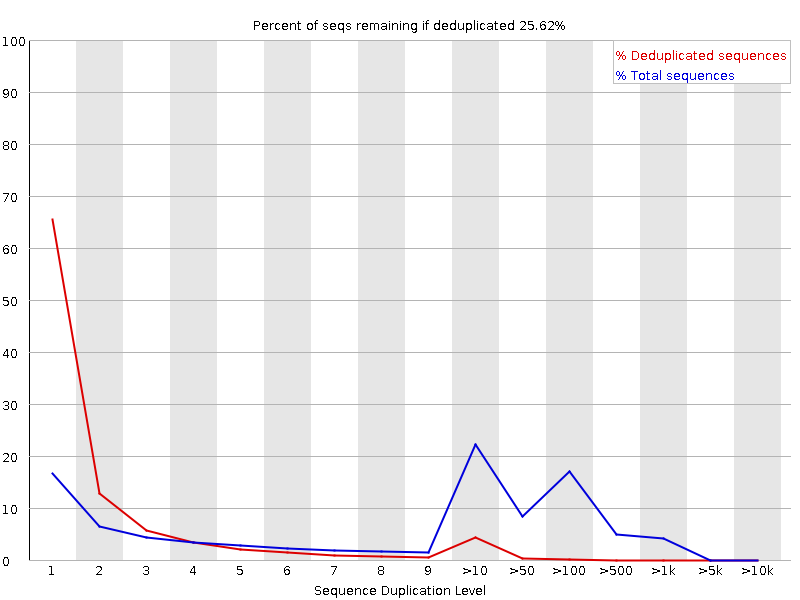

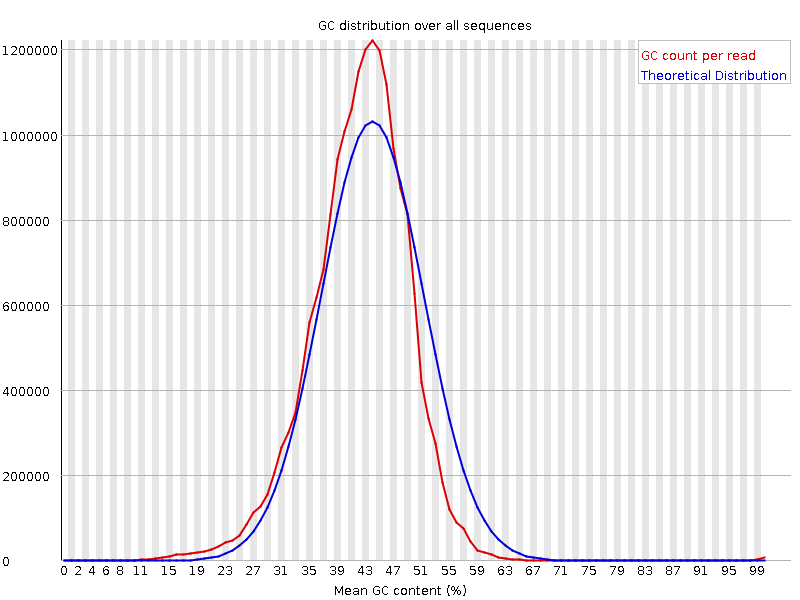

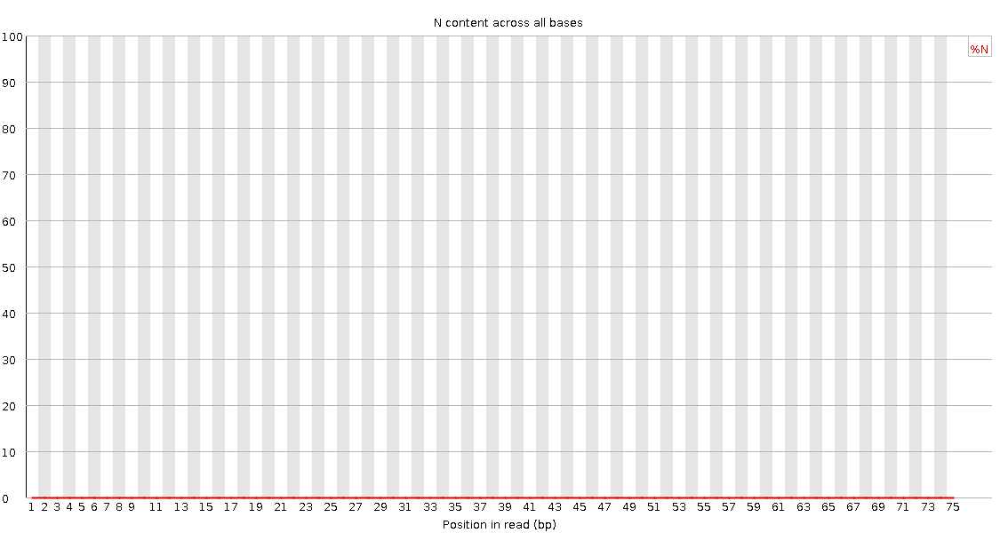

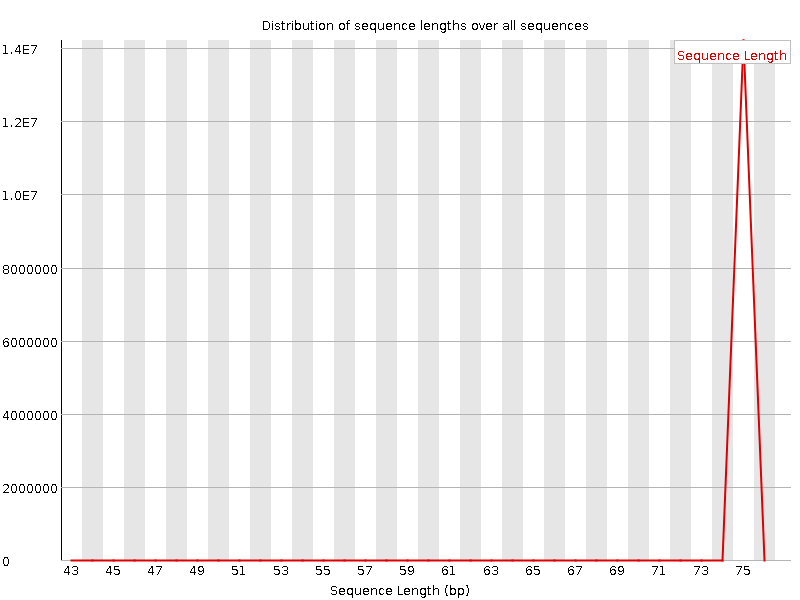

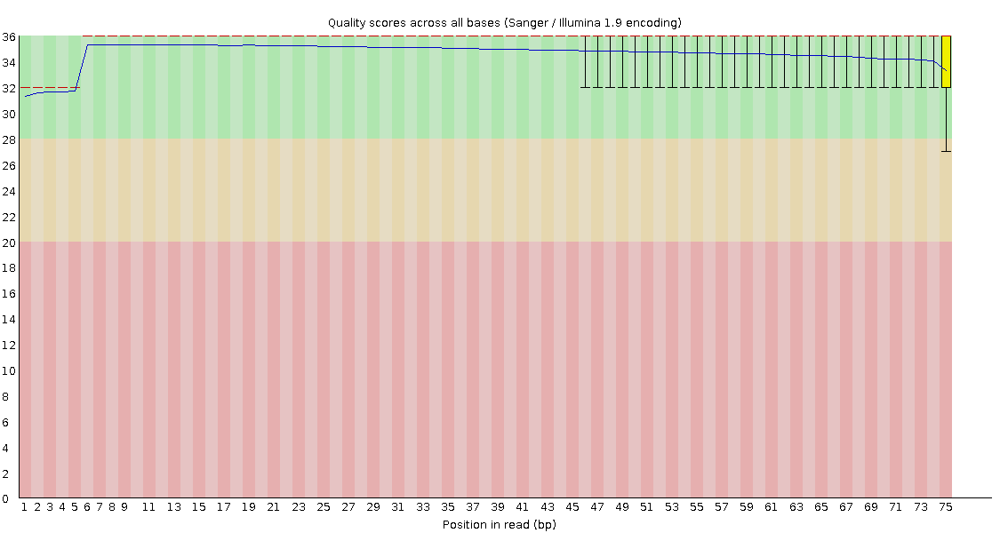

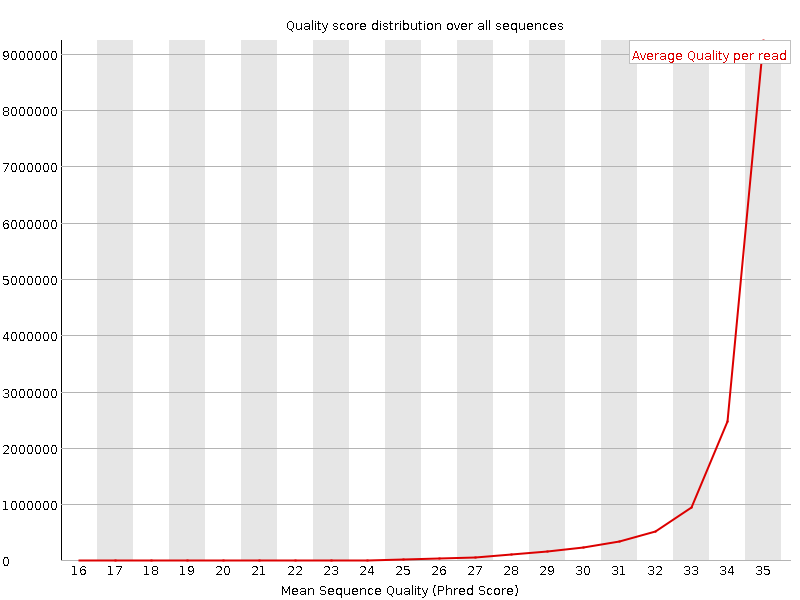

---------------------------------- Reverse Pass ----------------------------------


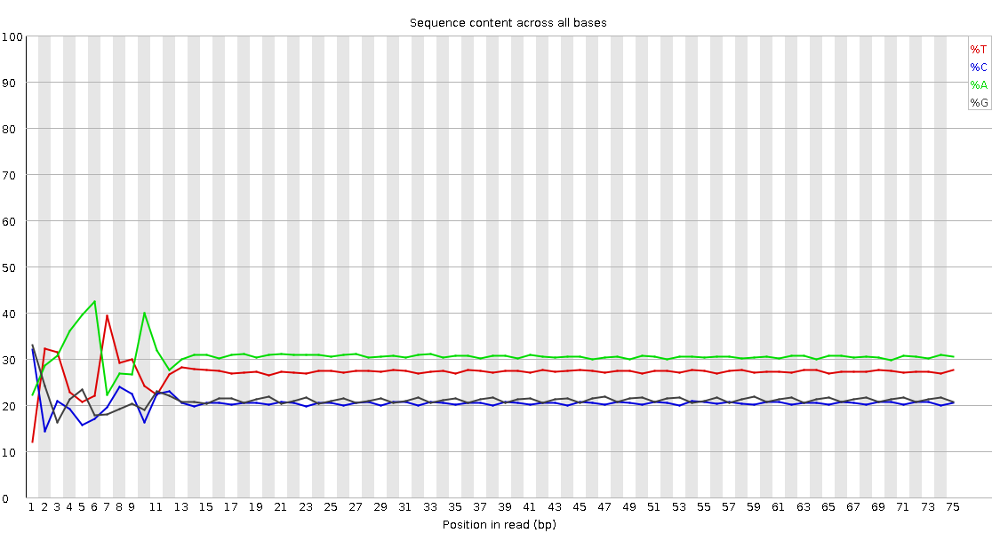

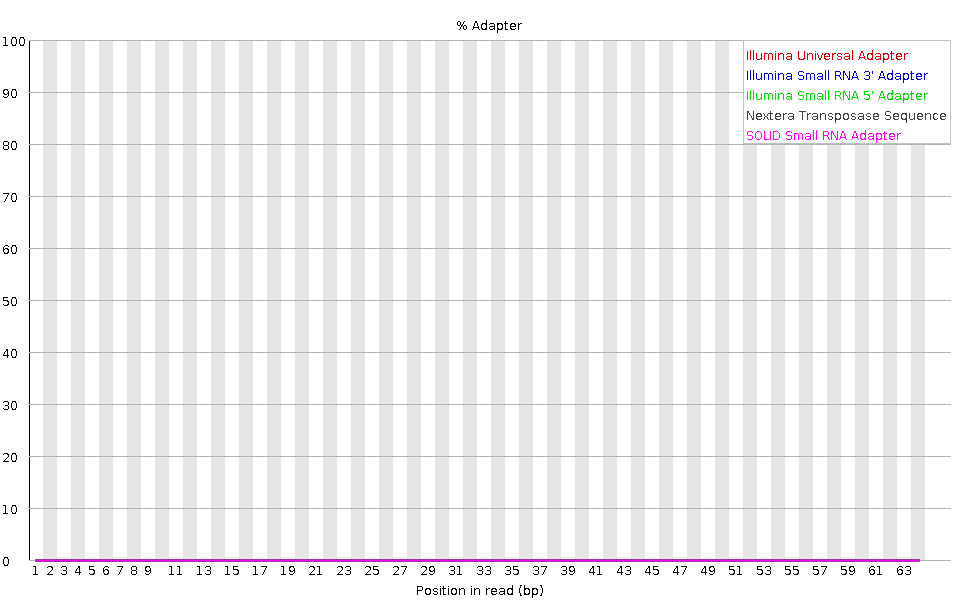

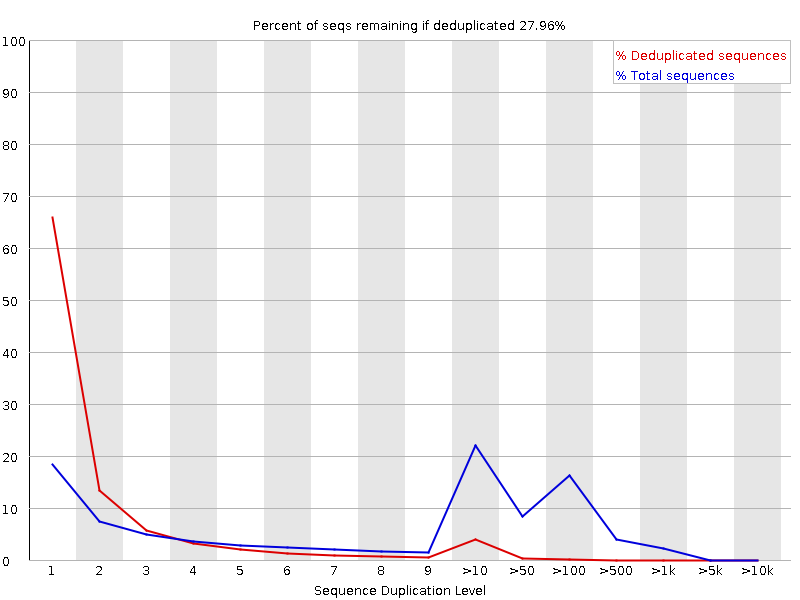

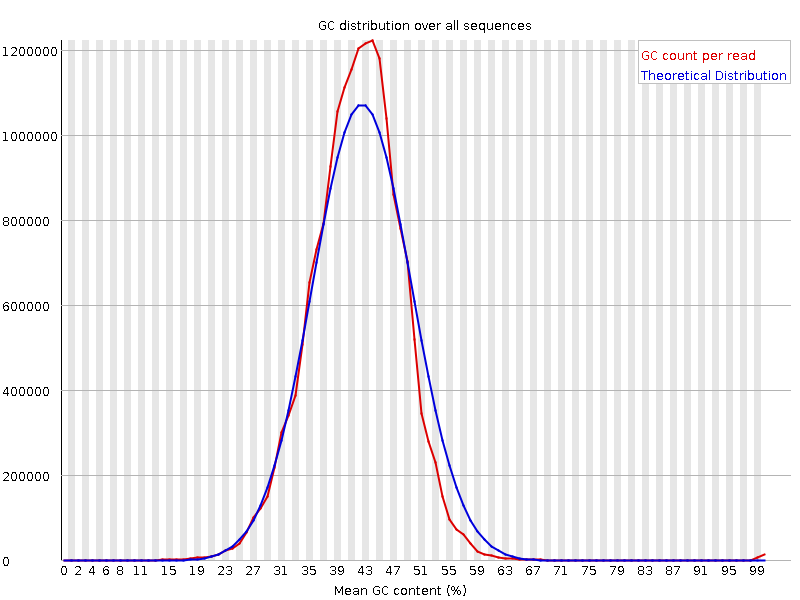

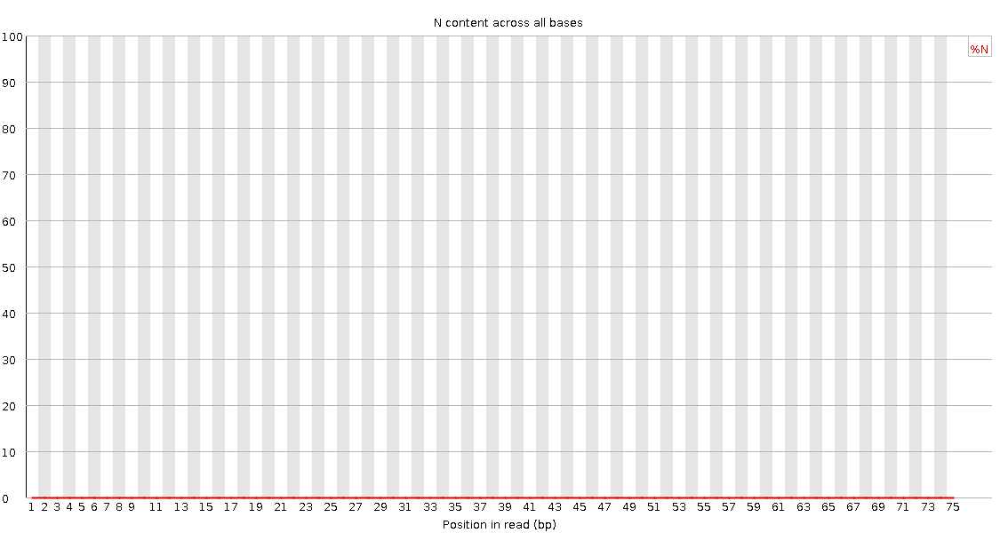

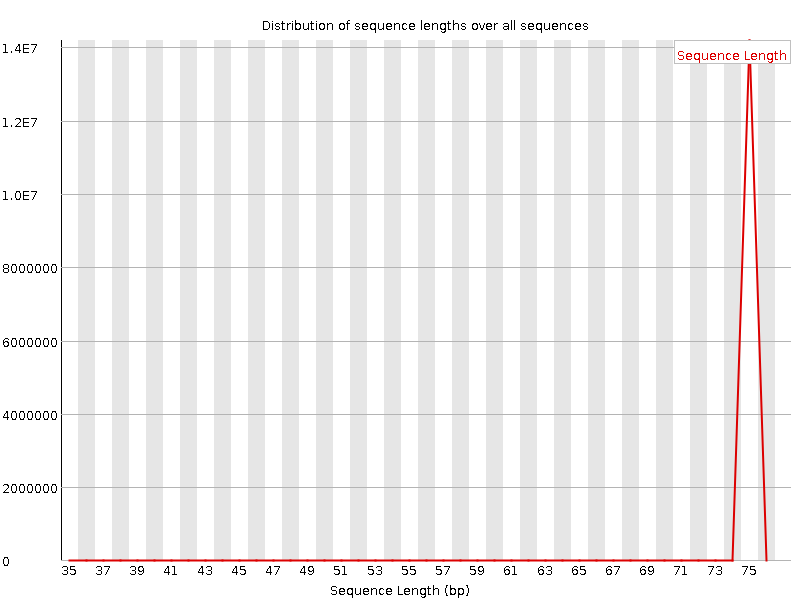

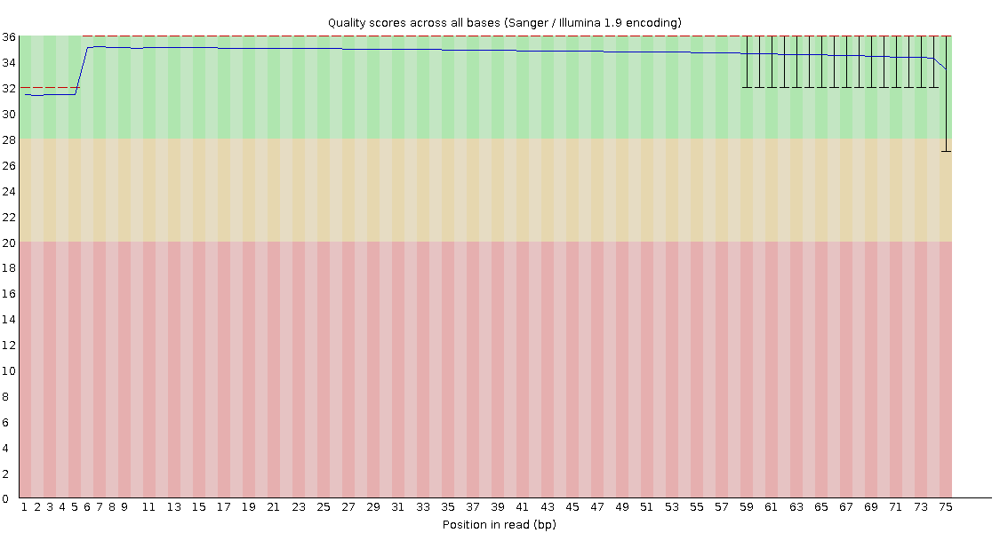

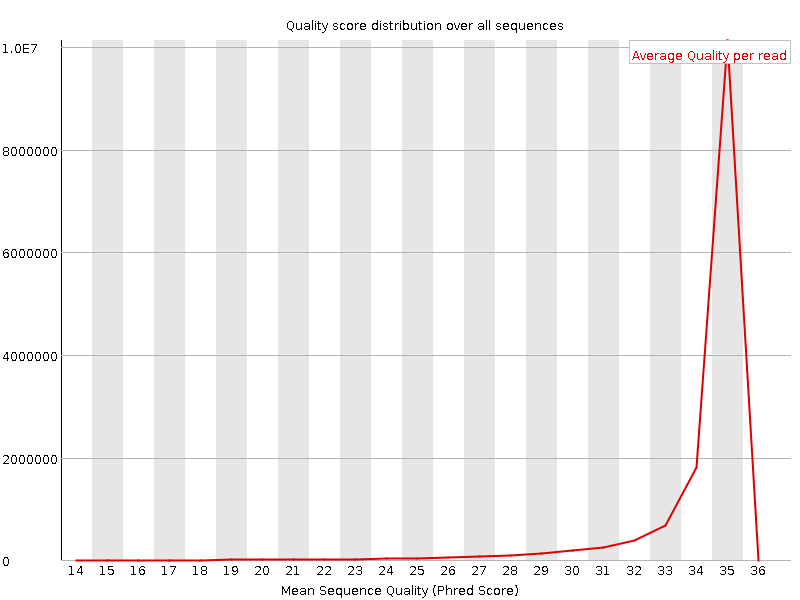

Run: SRR7692240
---------------------------------- Forward Pass ----------------------------------


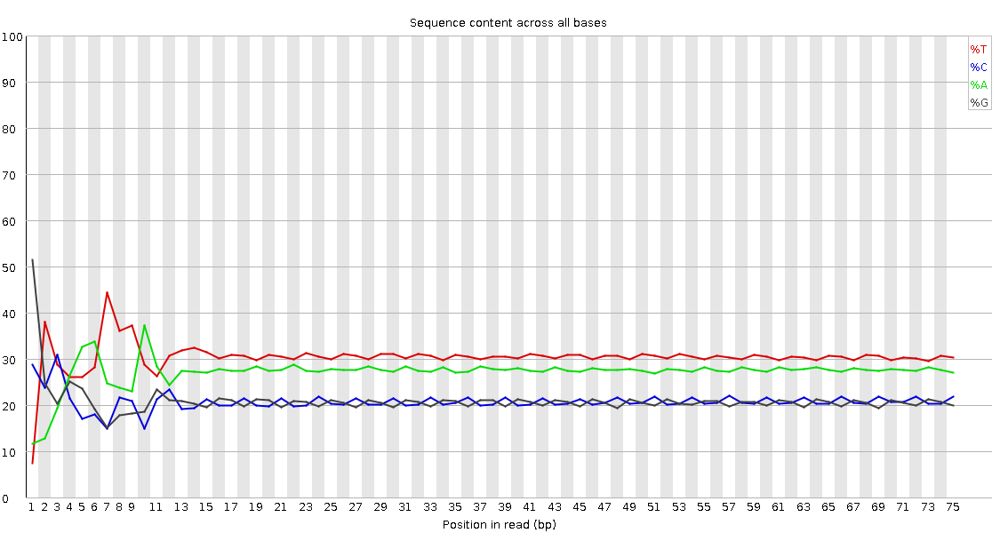

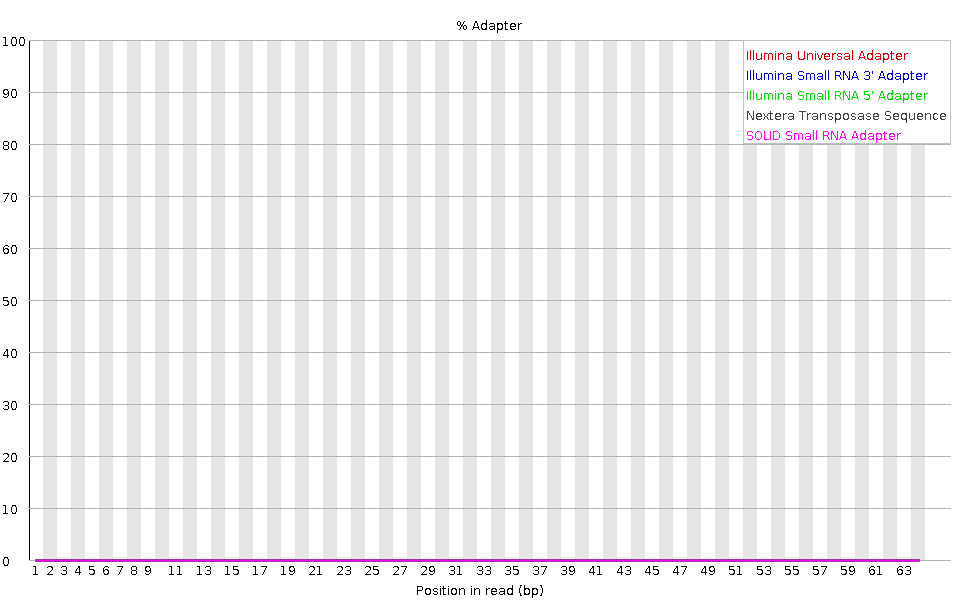

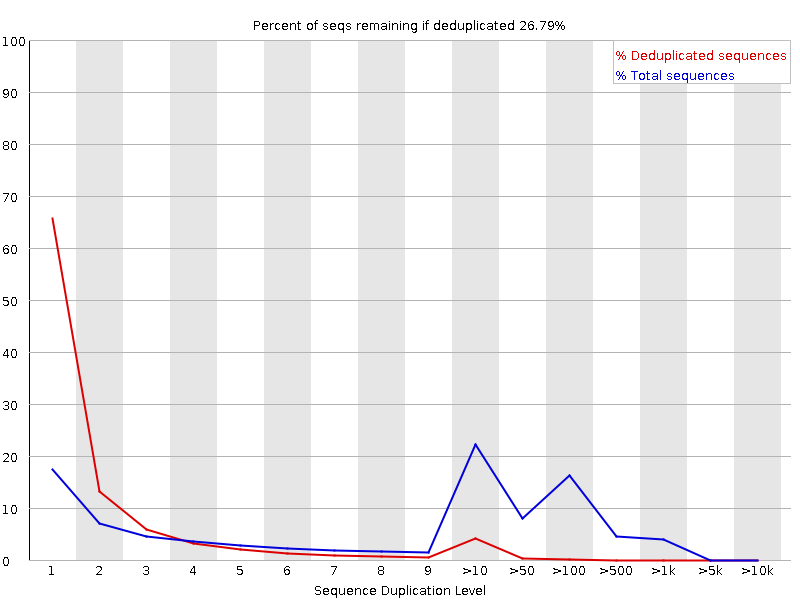

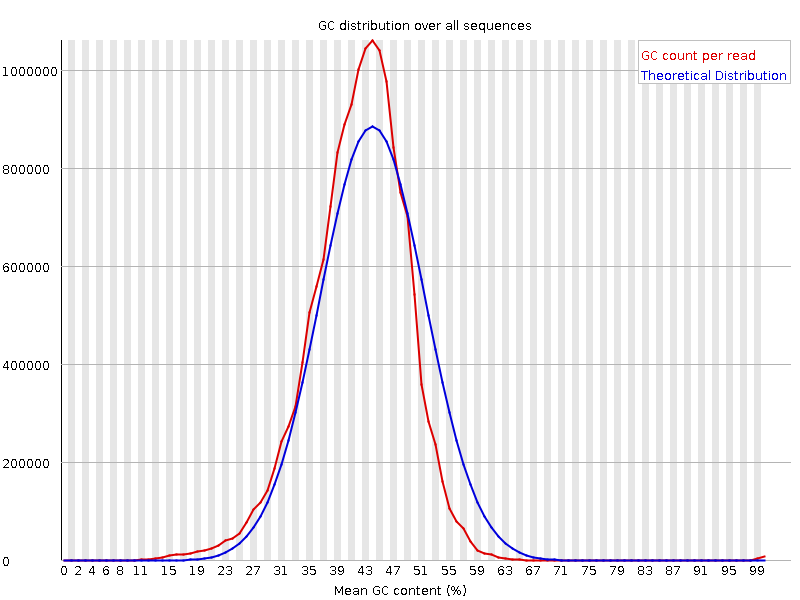

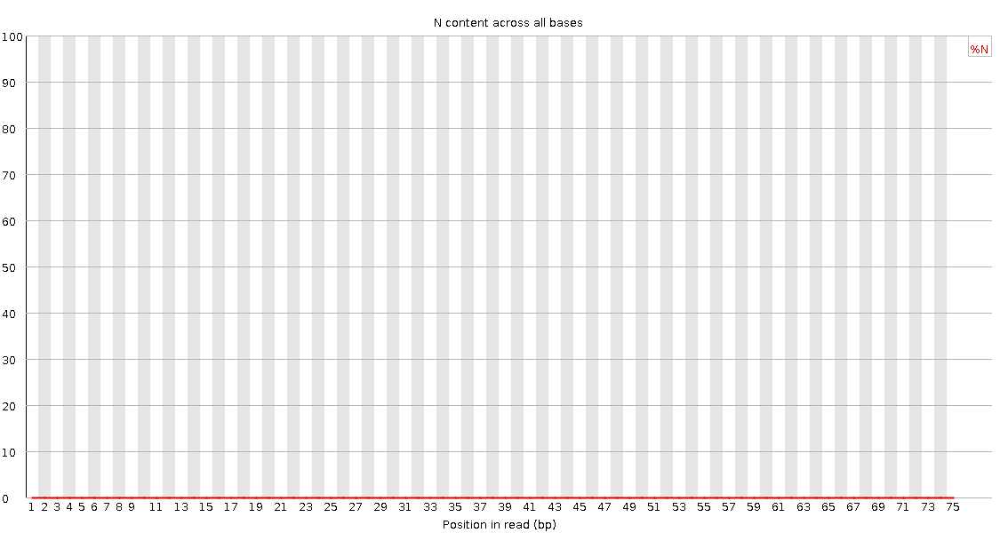

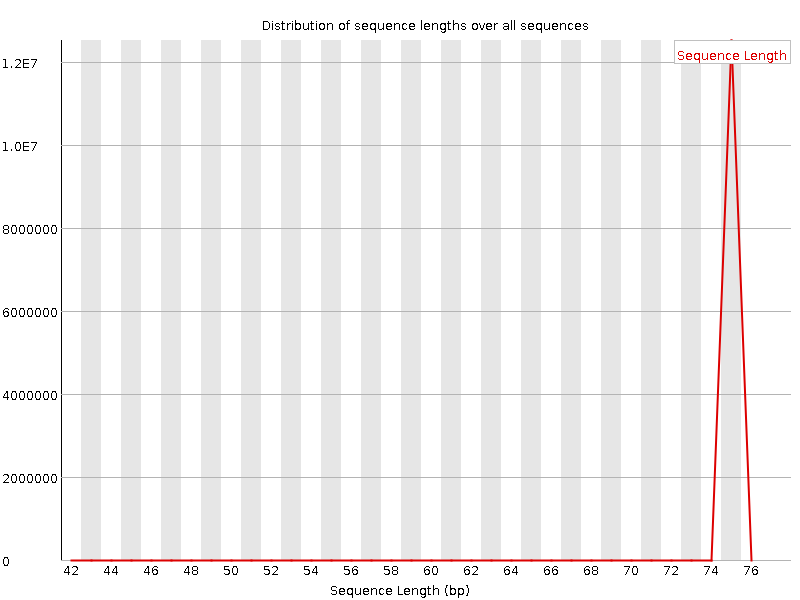

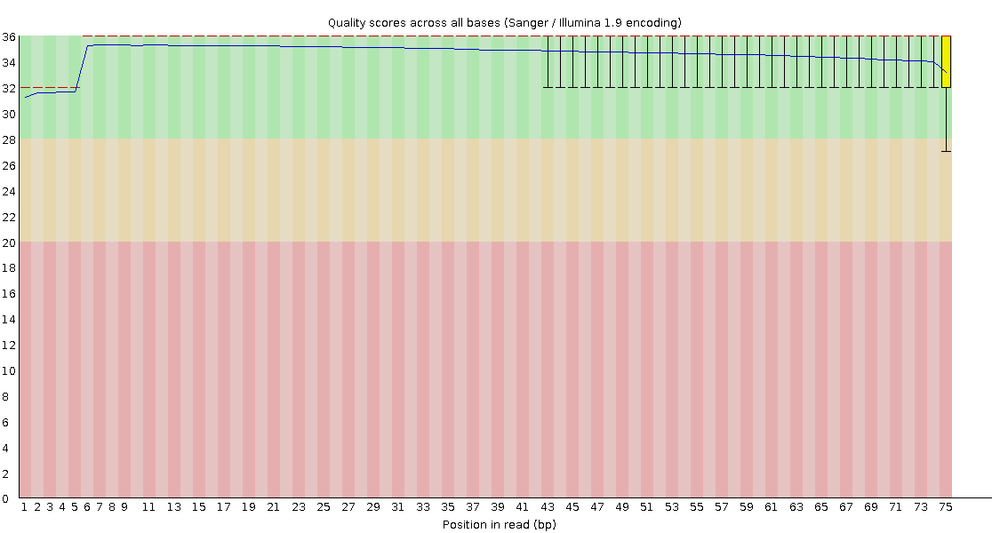

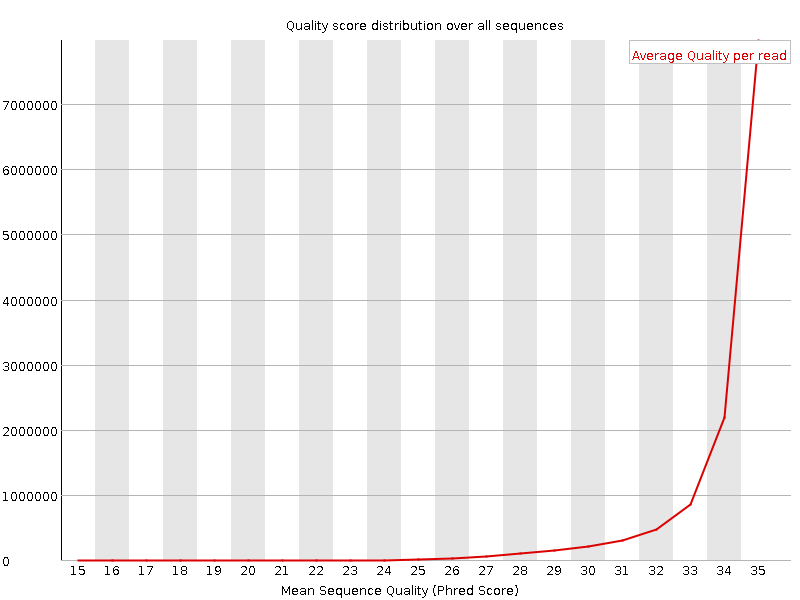

---------------------------------- Reverse Pass ----------------------------------


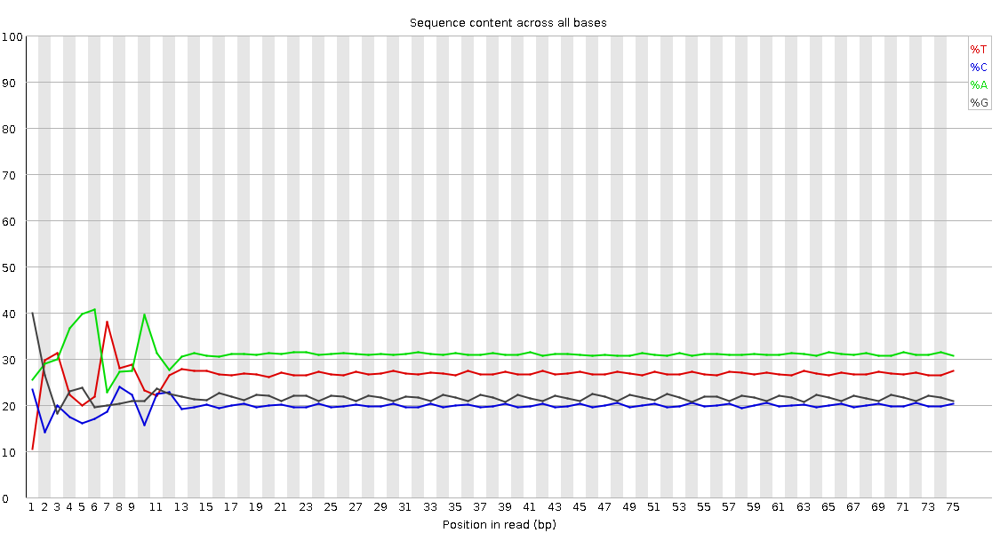

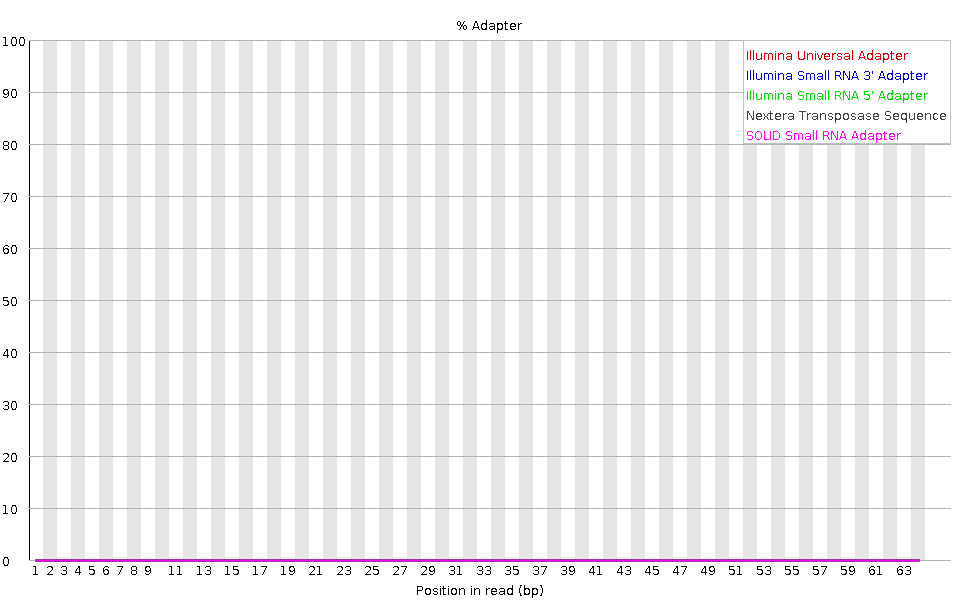

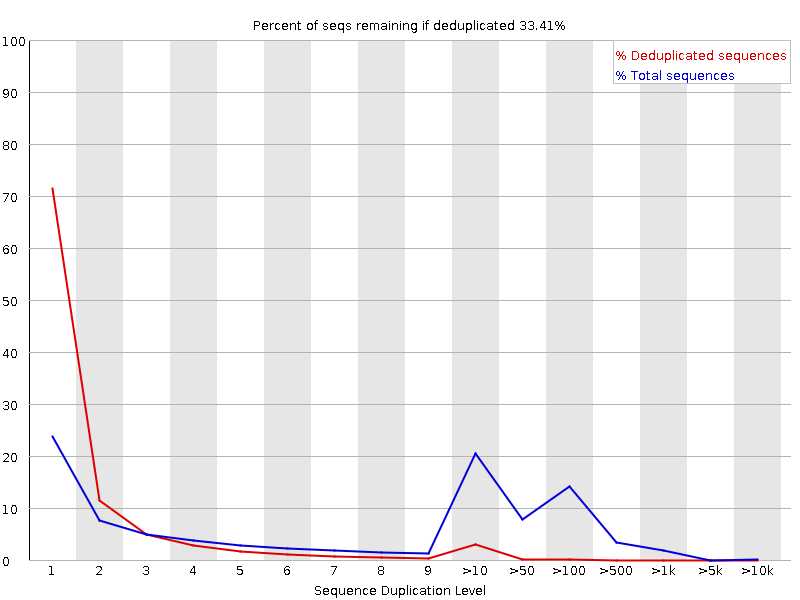

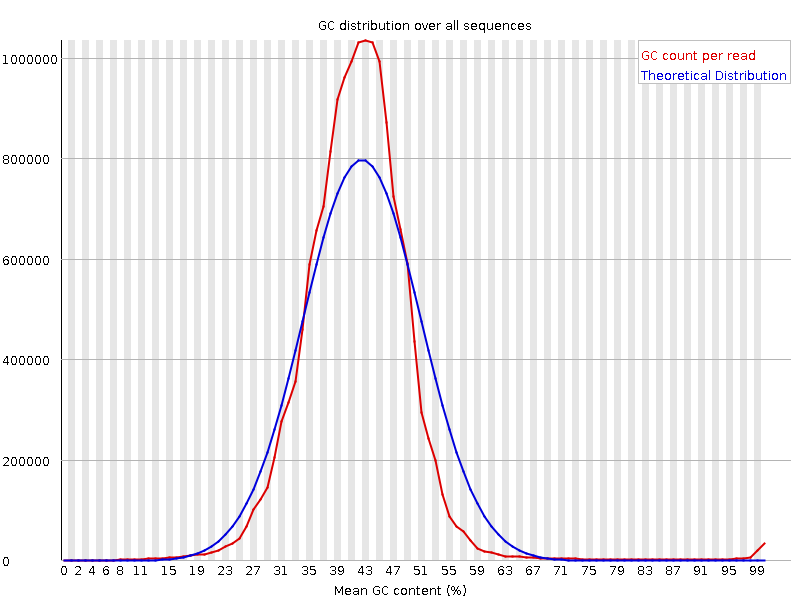

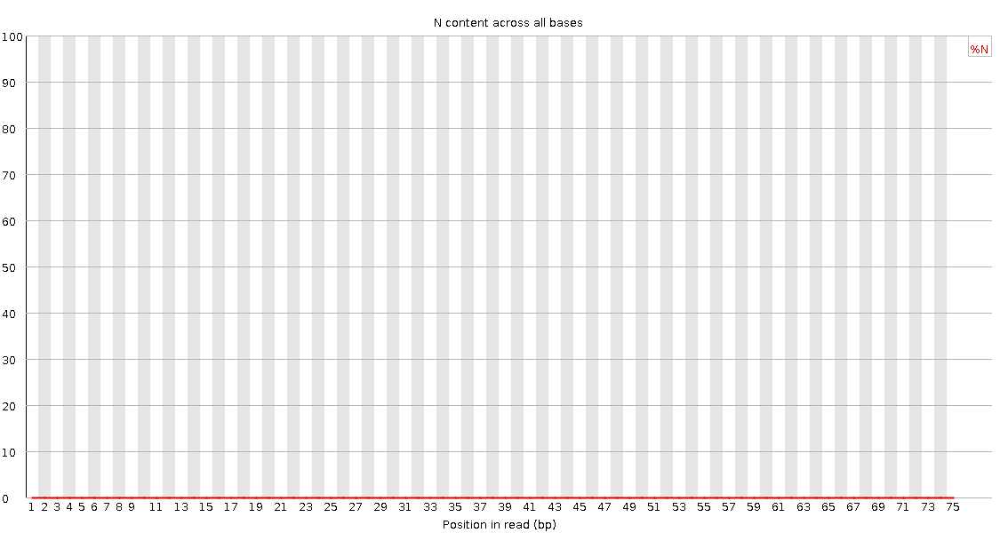

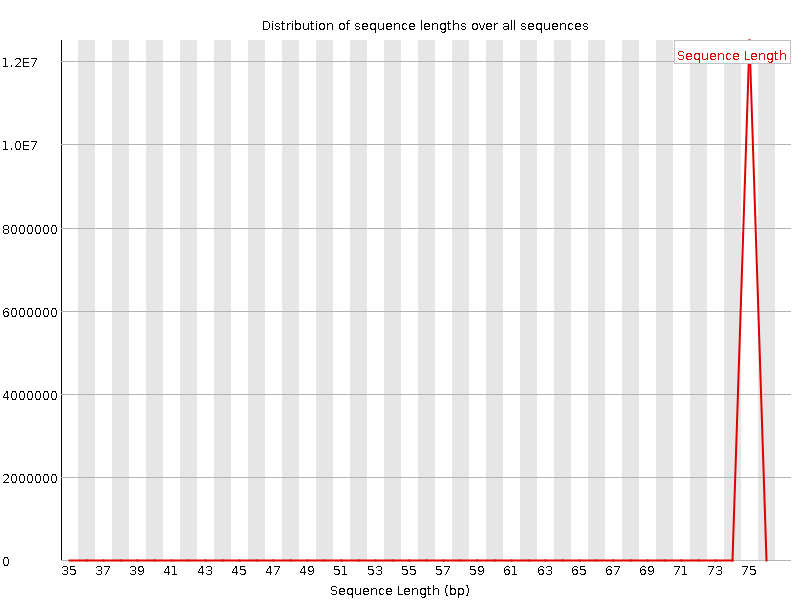

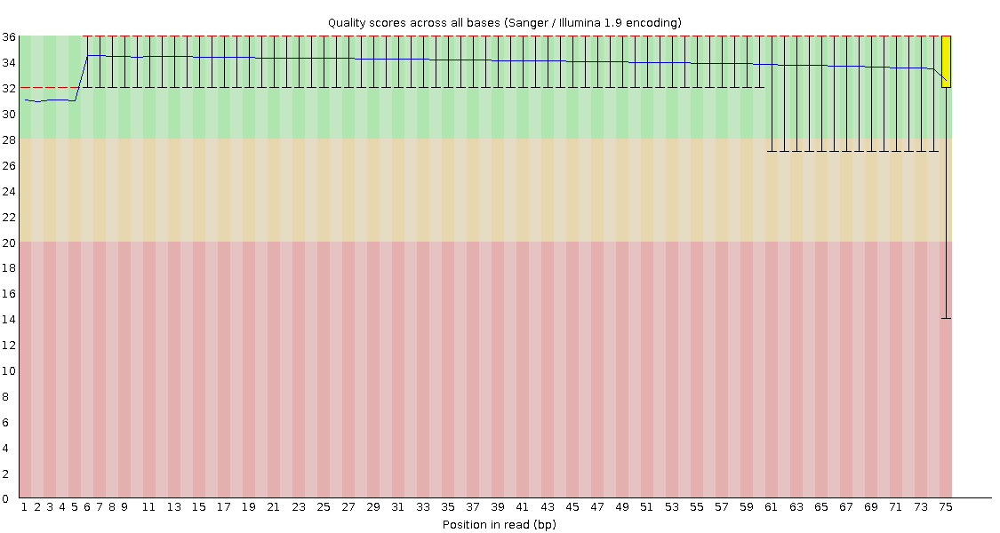

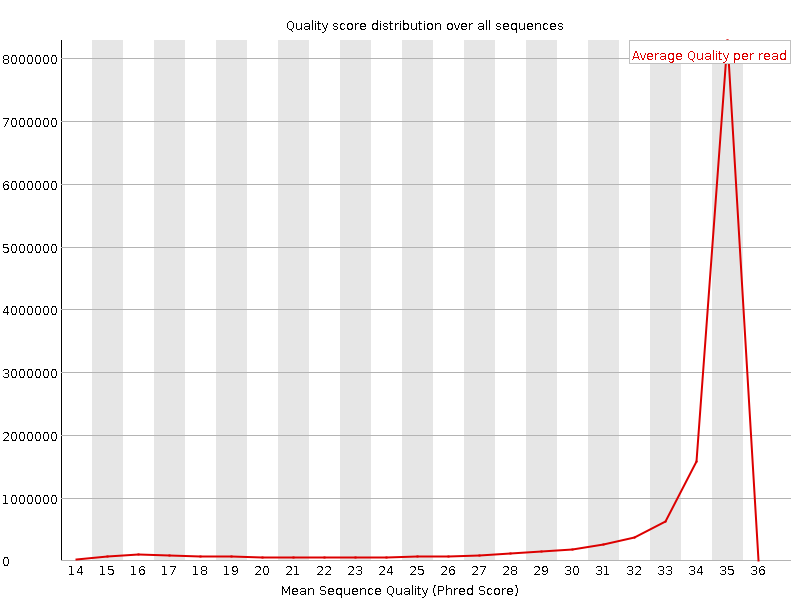

Run: SRR7692239
---------------------------------- Forward Pass ----------------------------------


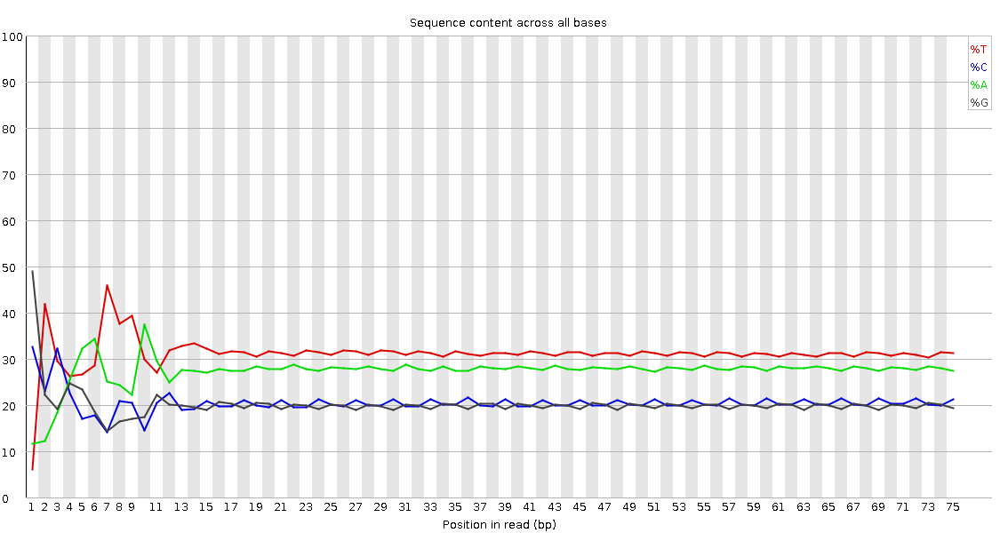

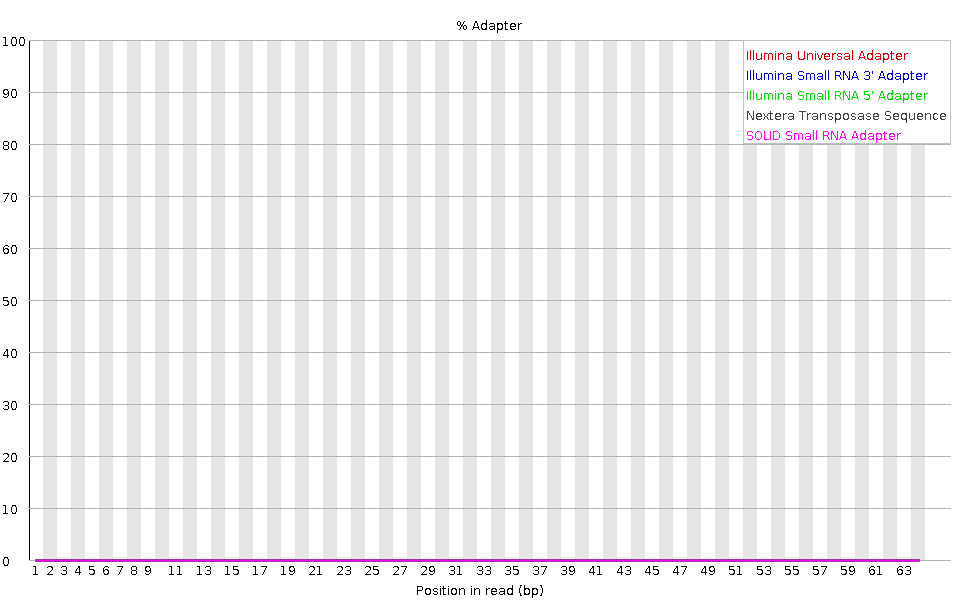

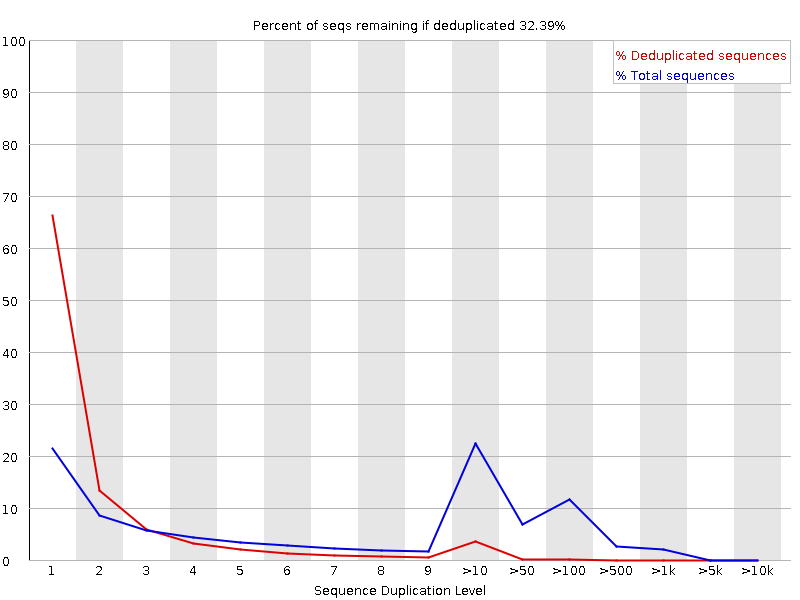

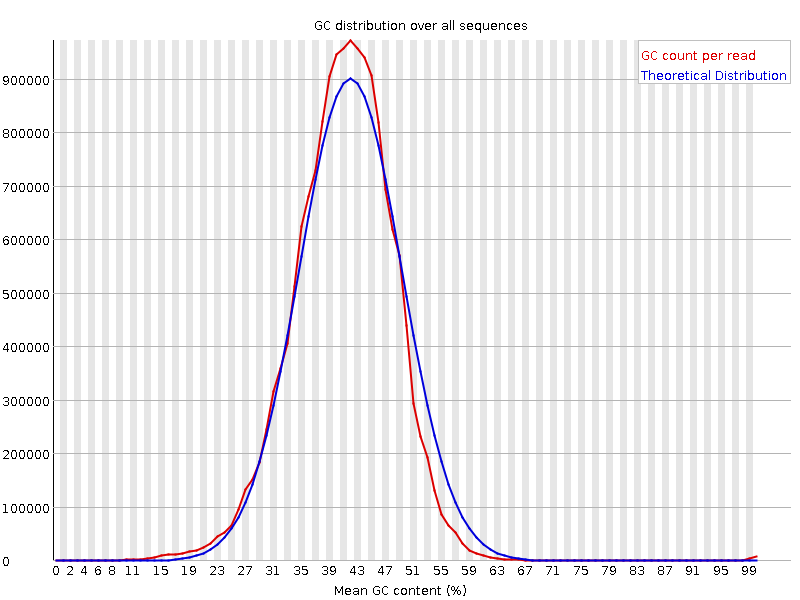

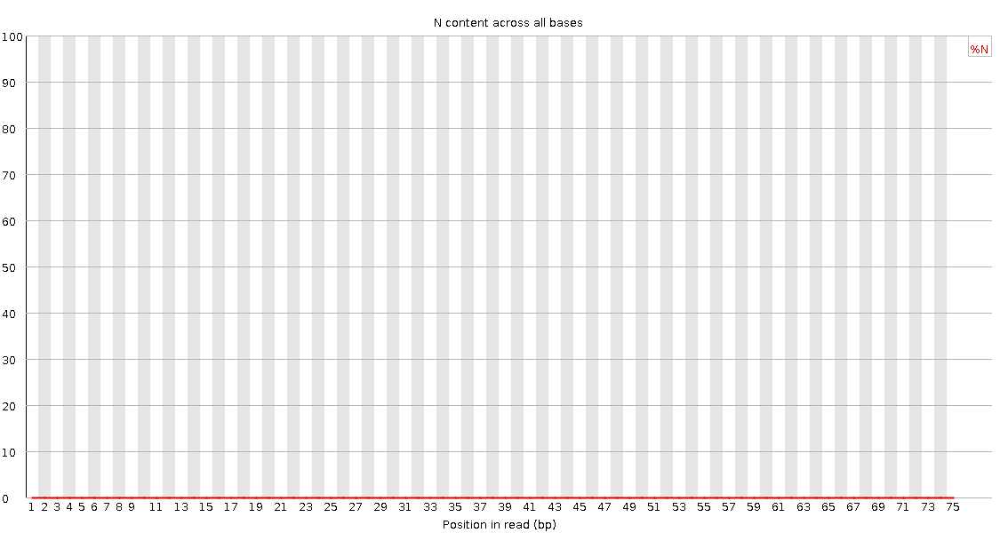

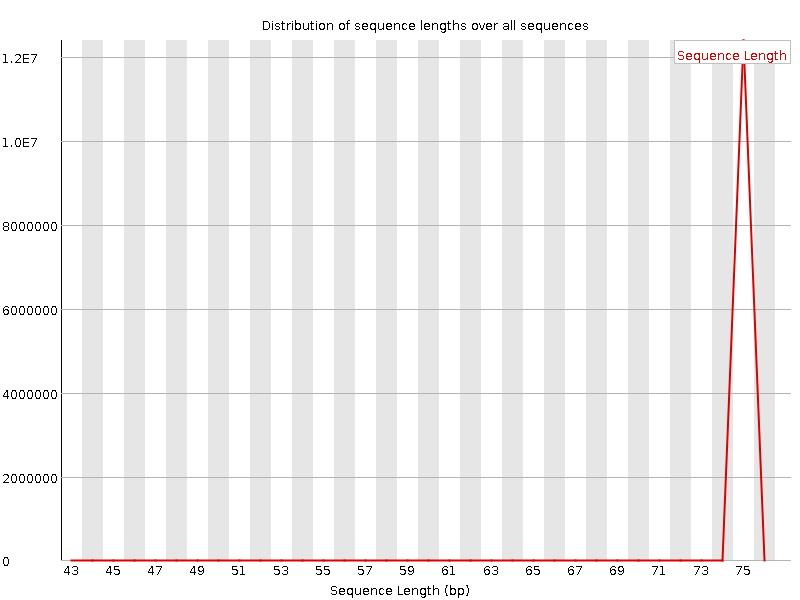

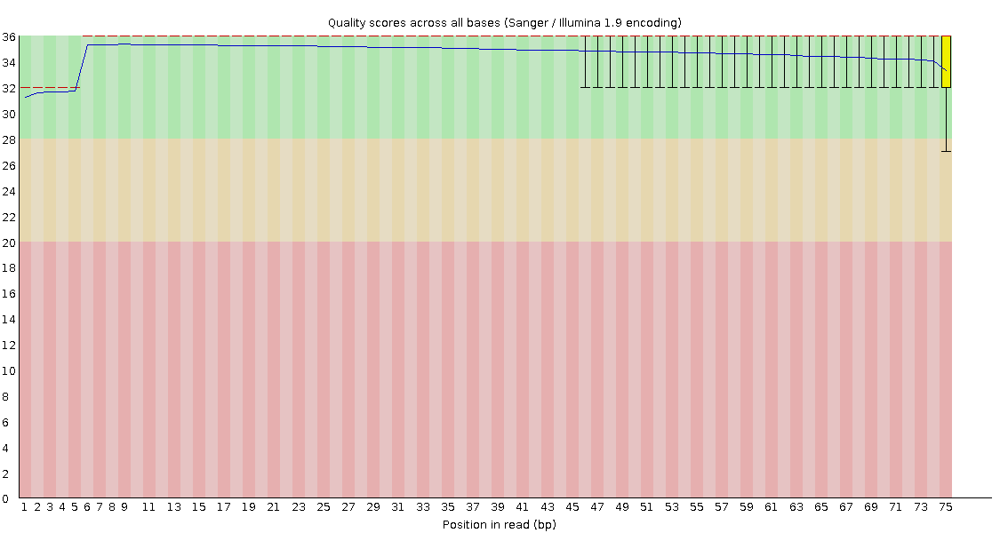

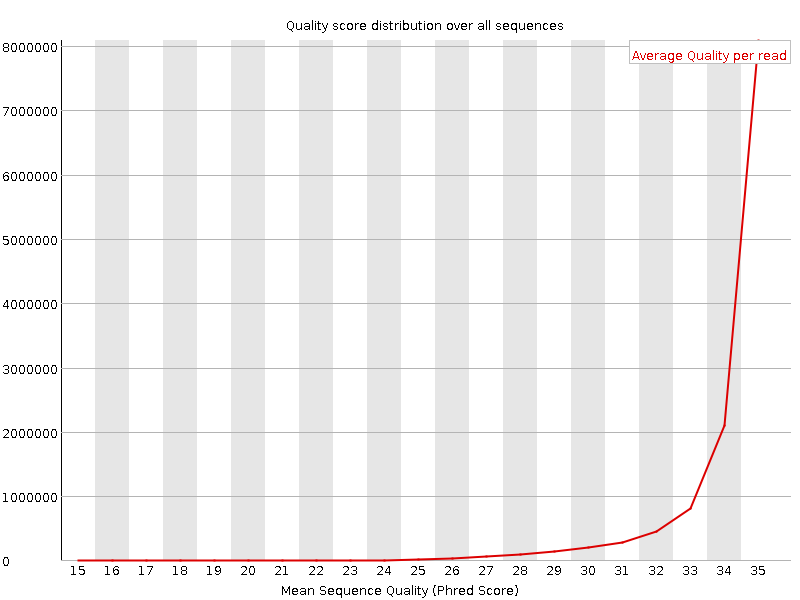

---------------------------------- Reverse Pass ----------------------------------


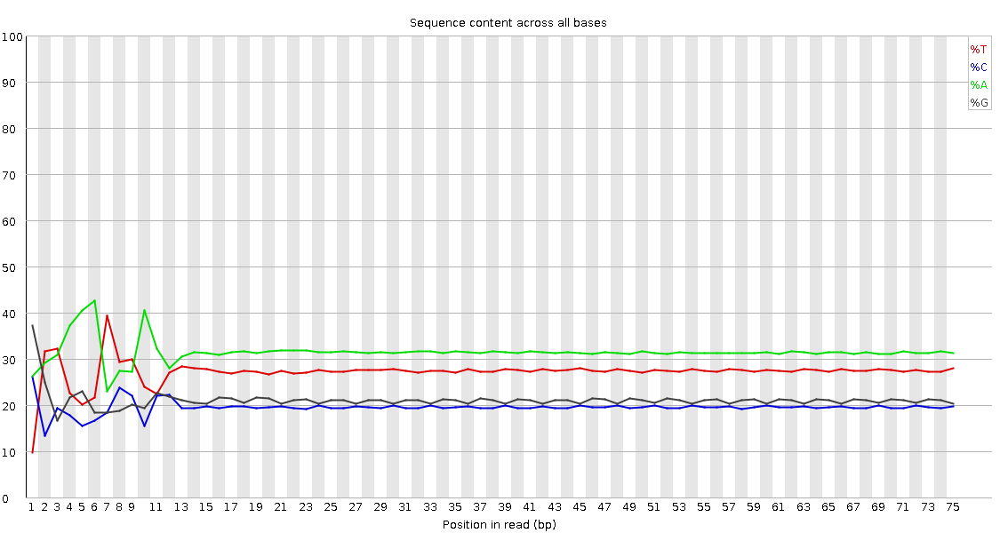

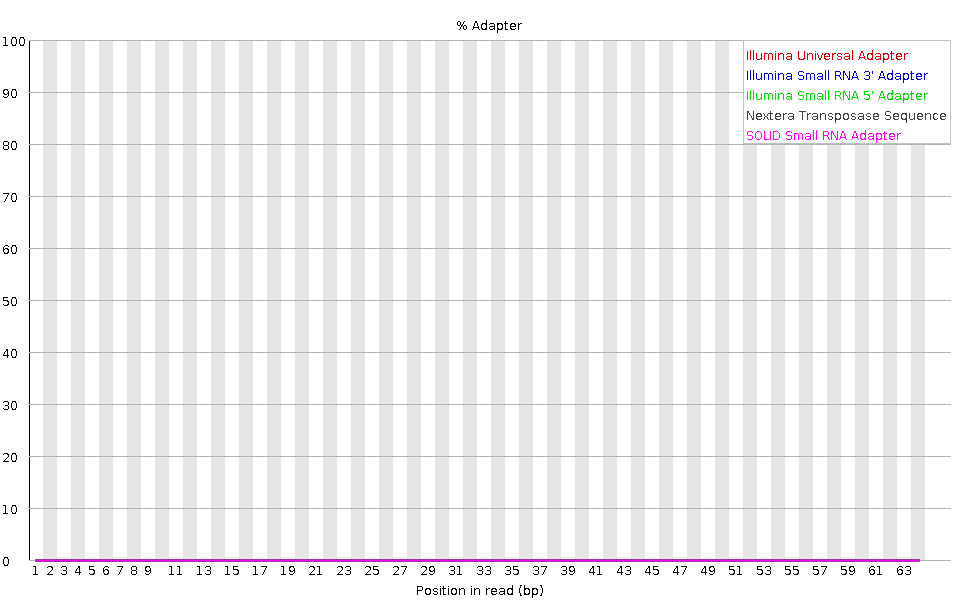

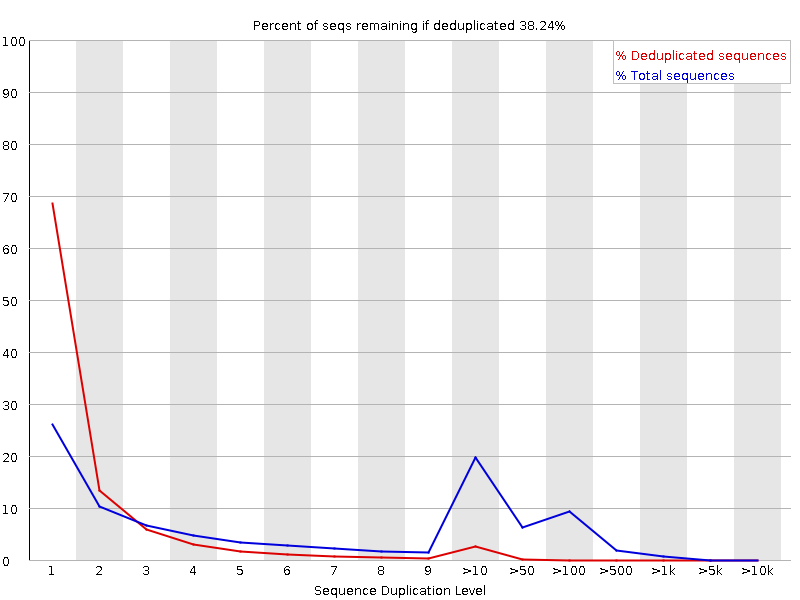

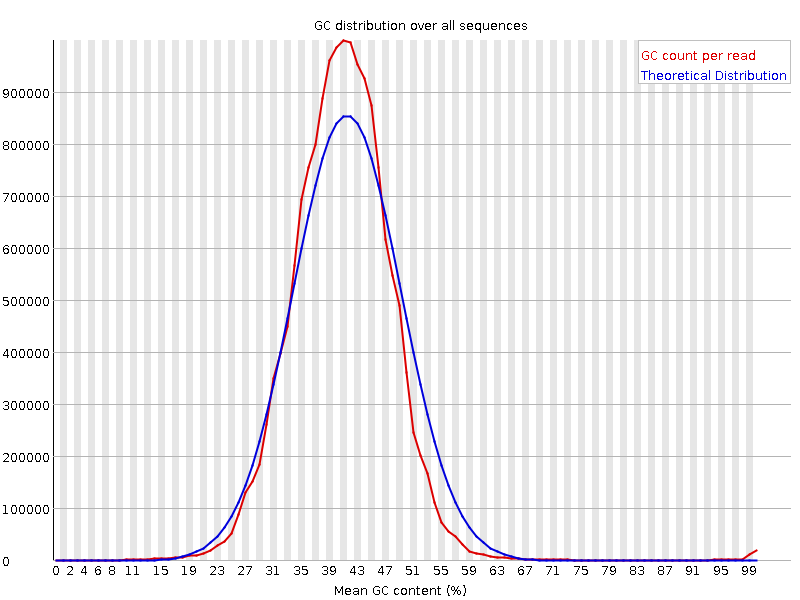

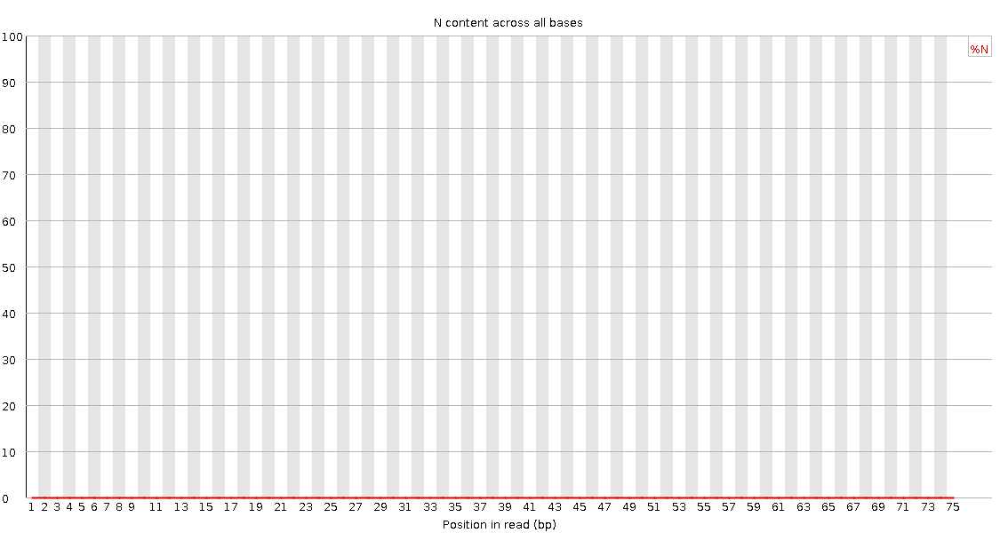

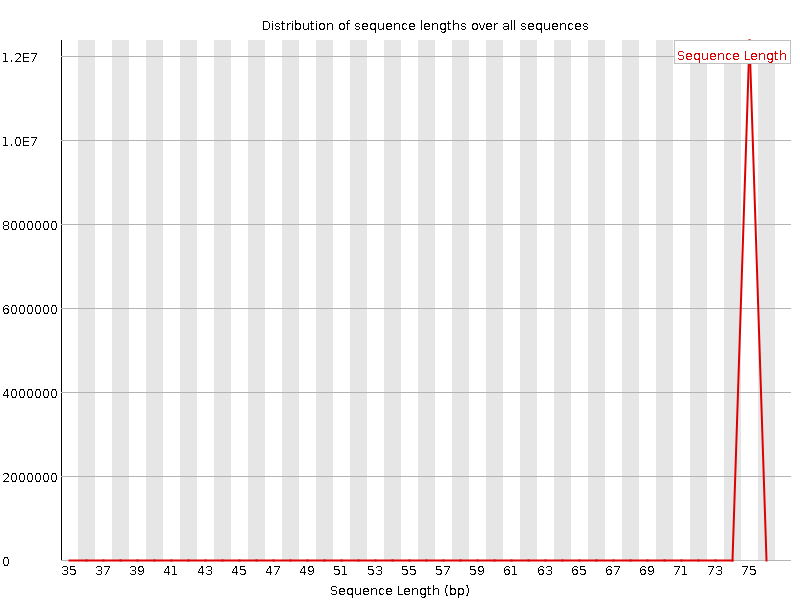

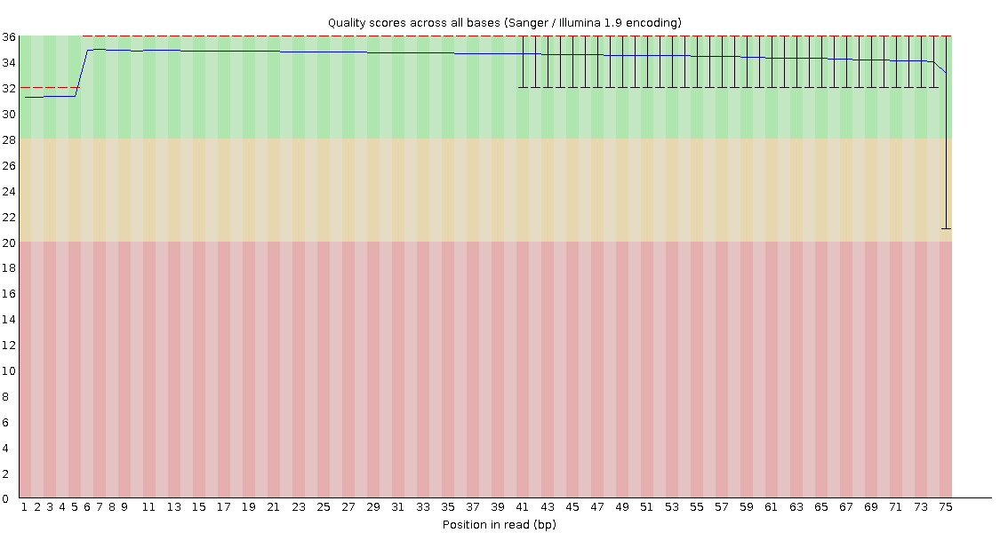

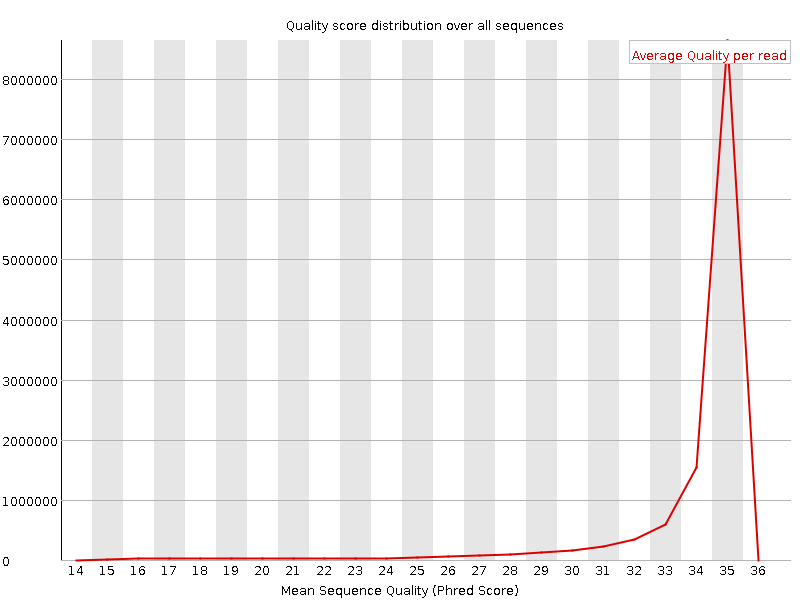

Run: SRR7692238
---------------------------------- Forward Pass ----------------------------------


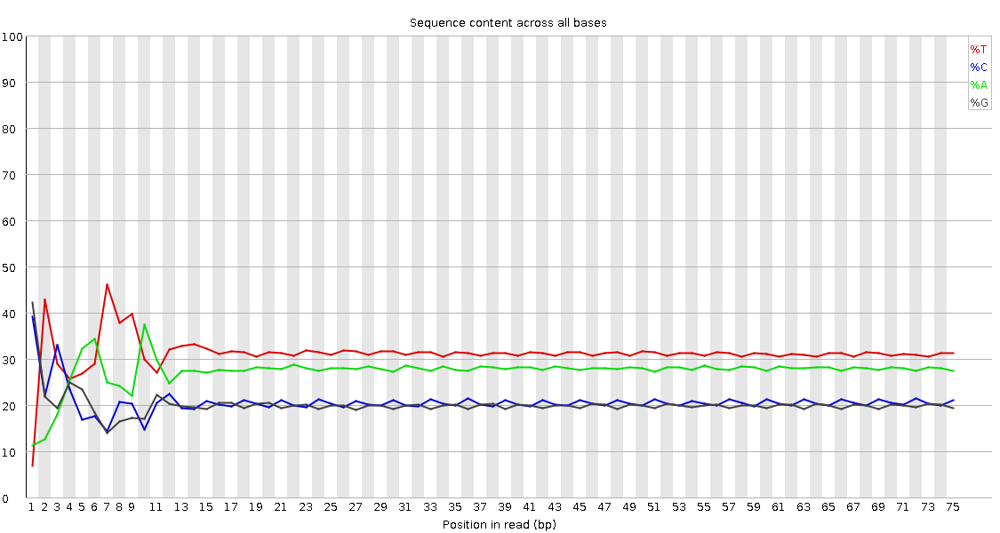

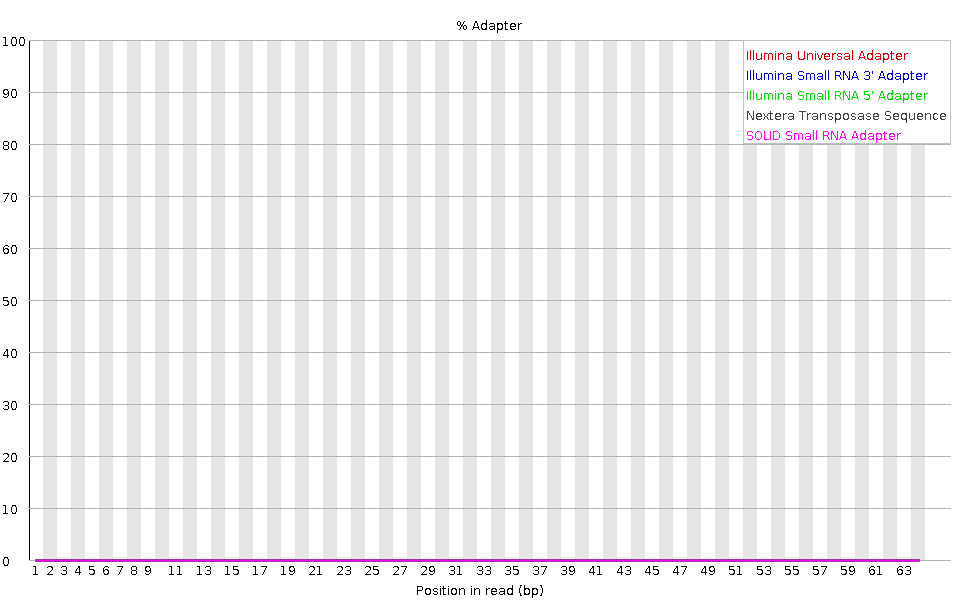

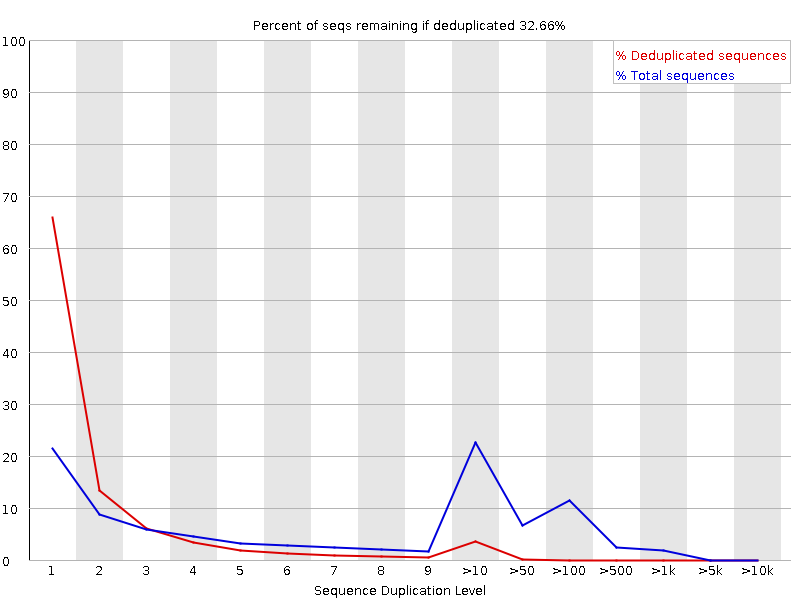

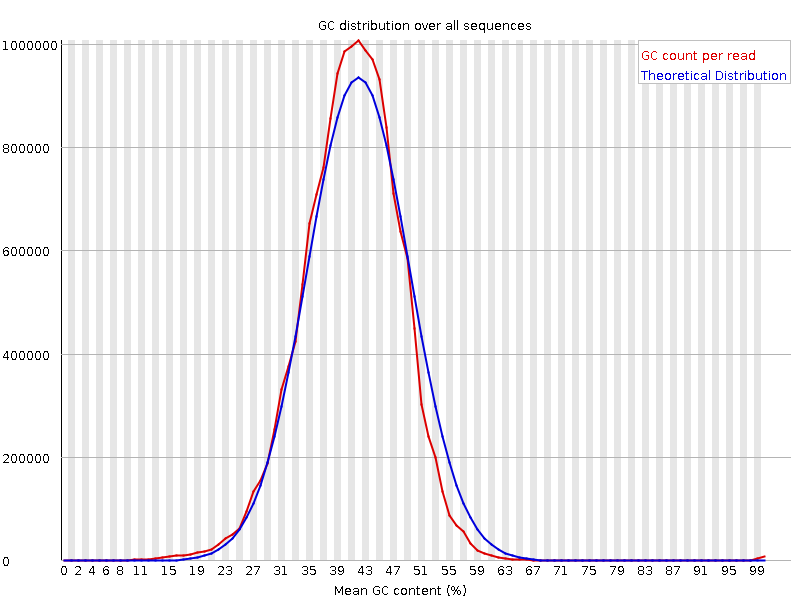

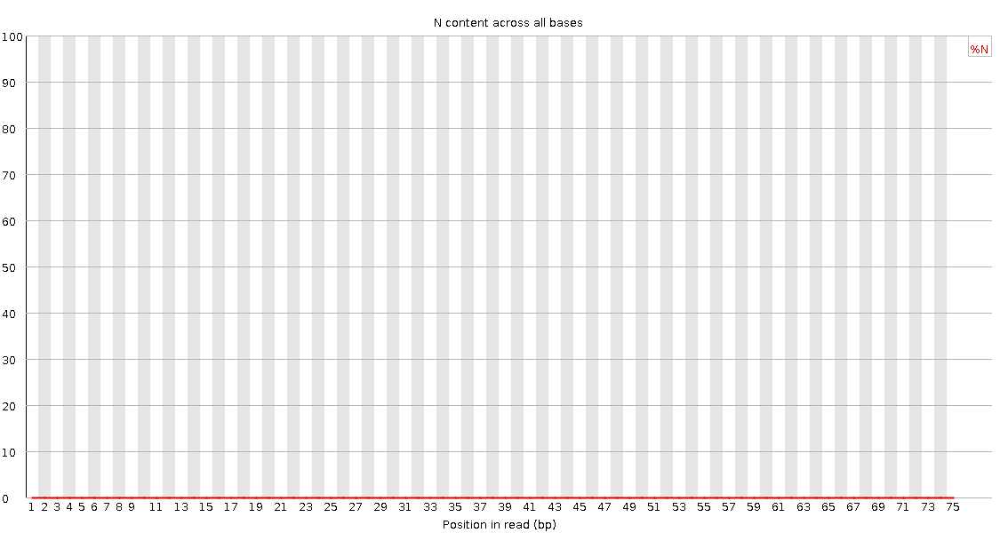

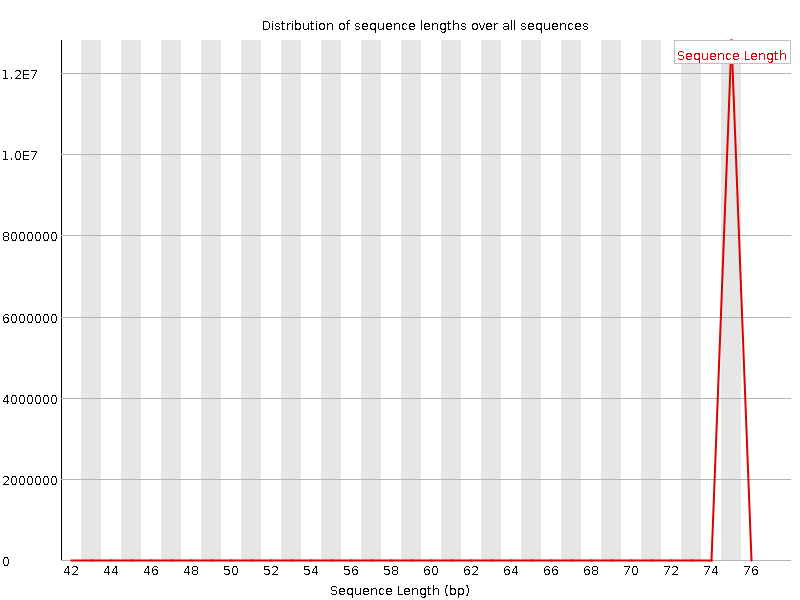

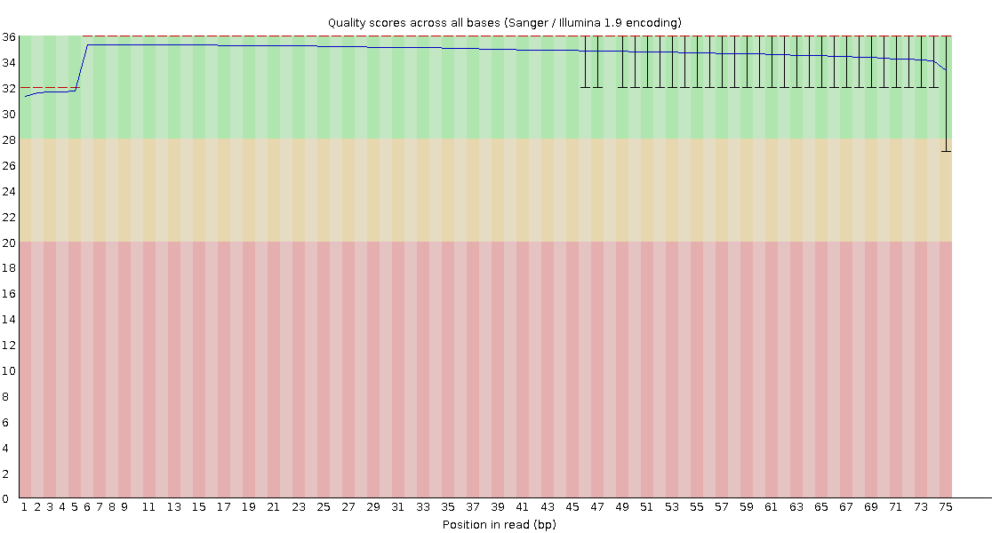

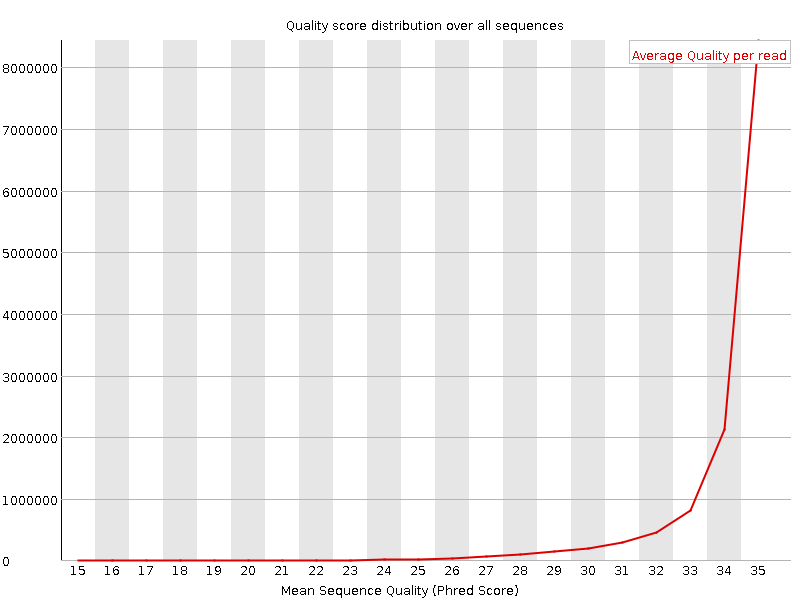

---------------------------------- Reverse Pass ----------------------------------


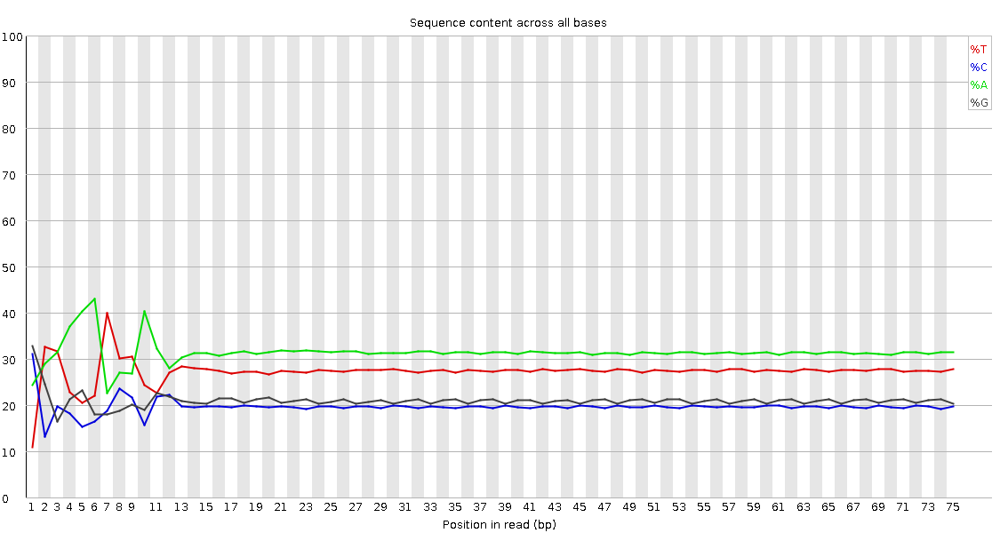

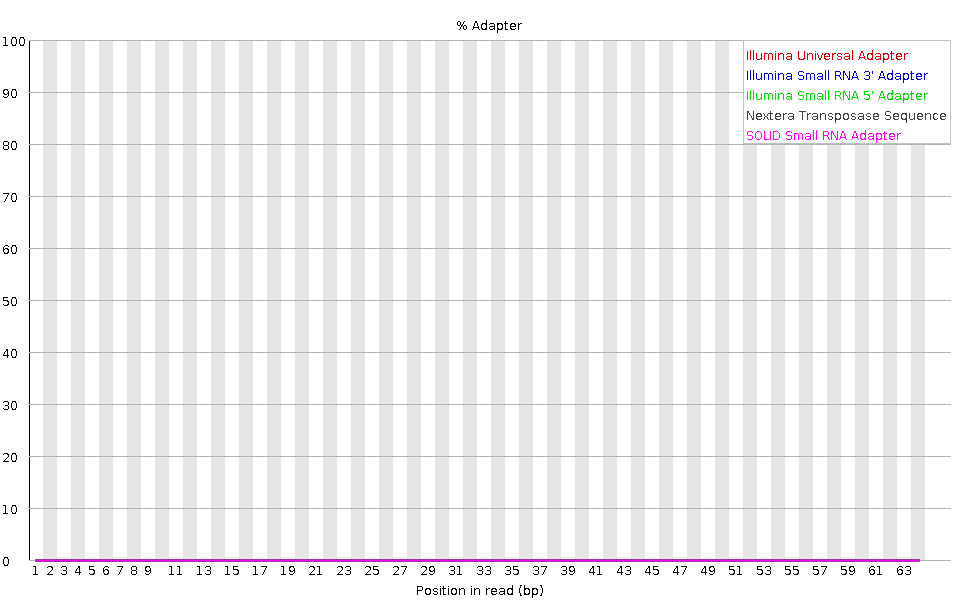

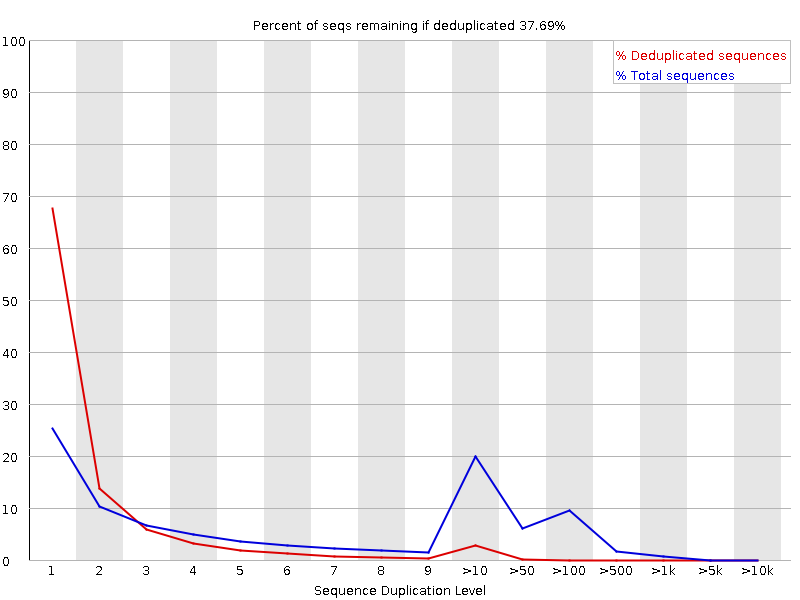

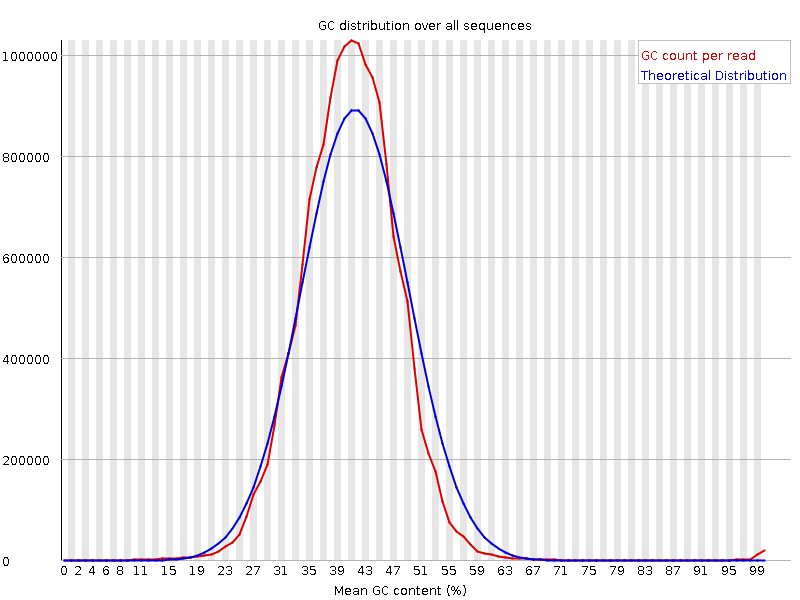

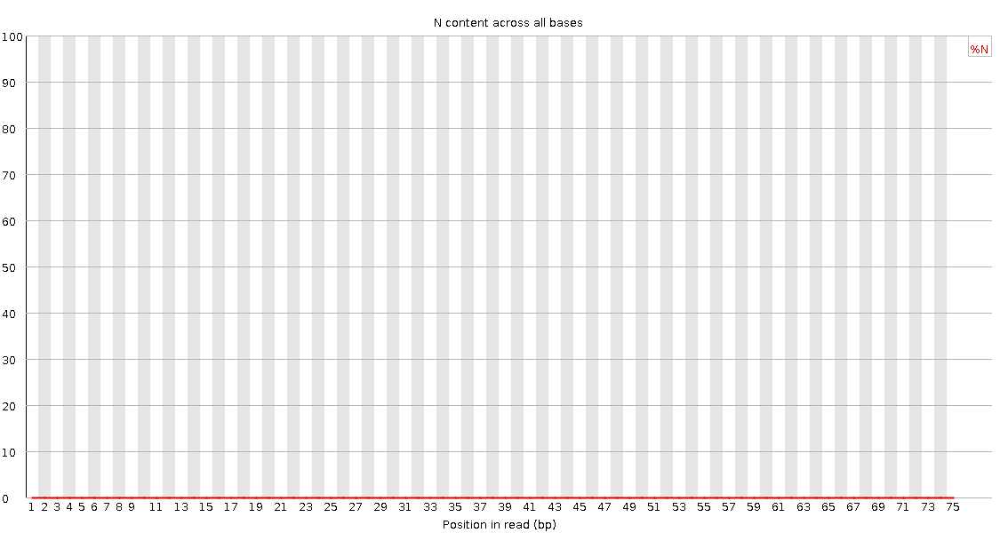

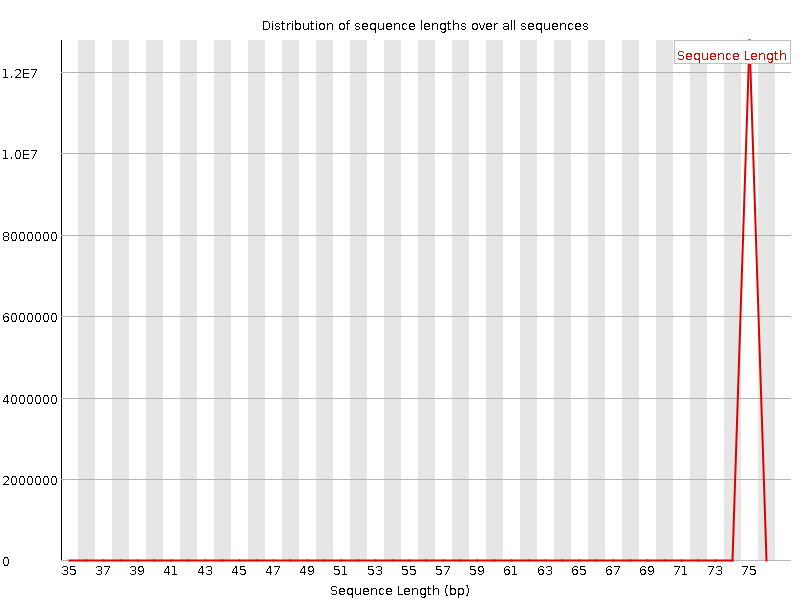

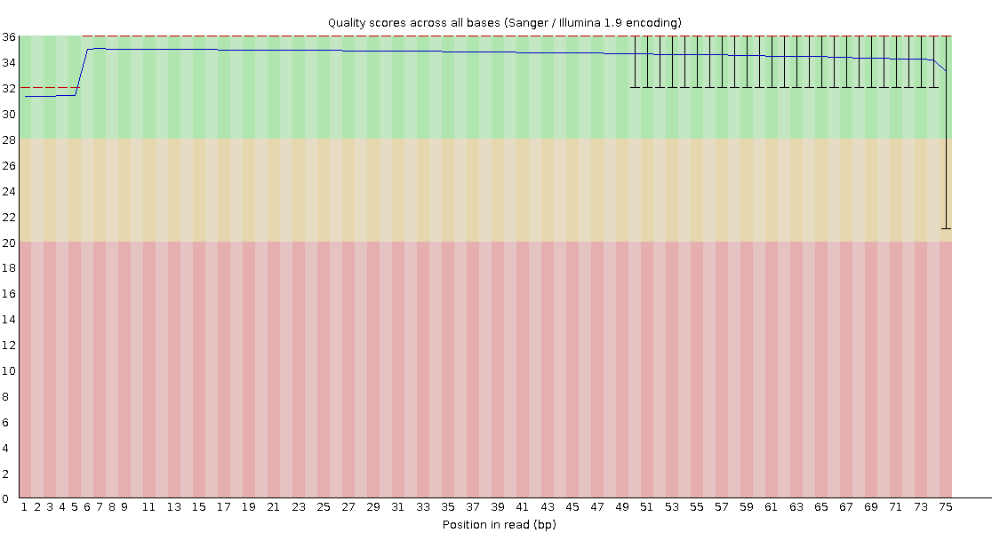

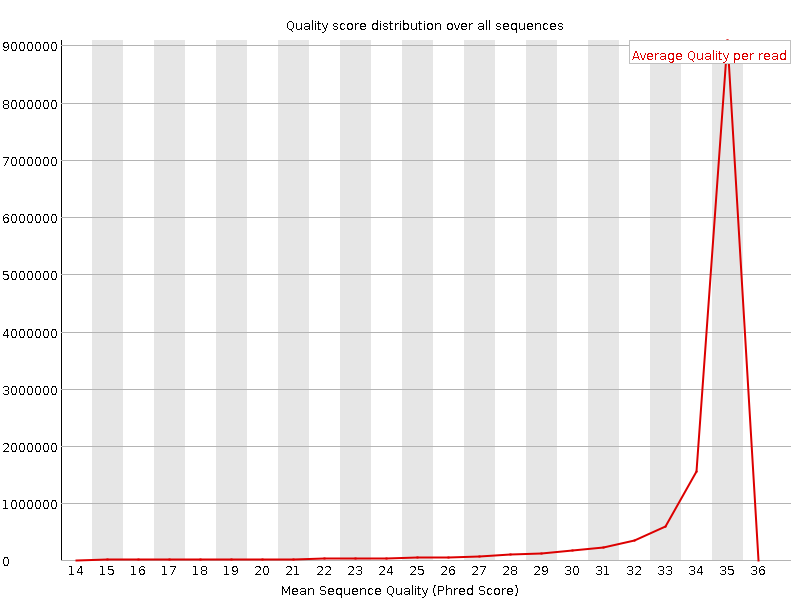

In [63]:
summary(run_numbers, qcfwd_trimmed_path, qcrvs_trimmed_path)
image(run_numbers, qcfwd_trimmed_path, qcrvs_trimmed_path)

## Alignment

### Reference Genome

A reference genome serves as a sort of blueprint of a species' genetic makeup. It provides us with a standardized framework for researchers to compare and analyze DNA sequences. The reference genome is essential for annotating genes, identifying regulatory elements, and understanding the genetic basis of disease and evolution.

Since our RNA-Seq data is yeast data, we will be using the yeast reference genome. The following commands install the yeast genome from UCSC, extract it, and combine all the chromosomes into one file.

$ wget https://hgdownload.soe.ucsc.edu/goldenPath/sacCer3/bigZips/chromFa.tar.gz

Extract the archive:

$ tar -xzvf chromFa.tar.gz

Combine all chromosomes into one file:

$ cat chr*.fa > combined_genome.fa

In [64]:
ref_dir = "../ref_genome"
ref_genome = os.path.join(ref_dir, "combined_genome.fa")

### Indexing

Due to the enormous size of a genome (even our yeast genome is hefty), we will try to enhance the speed and efficiency of algorithms used for sequence analysis by utilizing indexing. Indexing organizes the genome's information, enabling rapid and precise alignment of sequences. 

In [65]:
def index_genome(ref_d, ref_g):
    """
    Index a reference genome using HISAT2 for read alignment.

    Args:
        ref_d (str): Path to the directory where the index files will be stored.
        ref_g (str): Path to the reference genome FASTA file.

    Returns:
        str: Path to the generated HISAT2 index.

    Note:
        This function indexes a reference genome using HISAT2, creating the necessary index files
        required for read alignment. It checks if the index file already exists and skips indexing if they are present.

    Example:
        To index a reference genome using HISAT2:

        >>> index_genome("/path/to/reference_genome", "/path/to/reference.fasta")

    """

    index_dir = os.path.join(ref_d, "index")
    os.makedirs(index_dir, exist_ok=True)
    
    ht2_files = [filename for filename in os.listdir(index_dir) if filename.endswith(".ht2")]
    
    if not ht2_files:

        hisat2_command = [
        "hisat2-build", 
        ref_g,
        os.path.join(ref_d, "index", "index")
        ]
        
        try:
            subprocess.run(hisat2_command, check=True)
            print("Reference genome indexing completed successfully.")
            
        except subprocess.CalledProcessError as e:
            print("Error: HISAT2 indexing failed.")
            print(e)
        
    else:
        print("Reference genome already indexed.")

    return os.path.join(ref_d, "index", "index")

In [66]:
index_dir = index_genome(ref_dir, ref_genome)

Reference genome already indexed.


Now we have an indexed reference genome!

### Alignment

Alignment is the process of actually determining the correspondence between a query sequence and a reference genome. It allows the accurate pinpointing of the locations of genes, mutations, and regulatory elements, and allows us to attribute each read to a specific gene or genomic region. This step is crucial for identifying similarities, differences, and variations between sequences (which is exactly what we will be testing).

In [67]:
def align(ref_d, data_ds, trimmed_fastq_d, index_d):
    """
    Perform read alignment using HISAT2 on multiple samples with paired-end trimmed FASTQ files.

    Args:
        ref_d (str): Path to the directory where the HISAT2 index is located.
        data_ds (list): A list of data directories for each sample.
        trimmed_fastq_d (list): A list of directories containing trimmed paired-end FASTQ files for each sample.
        index_d (str): Path to the HISAT2 index.

    Returns:
        list: A list of paths to the aligned SAM files for each sample.

    Note:
        This function performs read alignment using HISAT2 on multiple samples with paired-end trimmed FASTQ files.
        It checks if the alignment result file already exists and skips alignment if it is present.

    Example:
        To perform read alignment on multiple samples:

        >>> align("/path/to/reference_genome_index", ["/path/to/sample1", "/path/to/sample2"], ["/path/to/trimmed_data1", "/path/to/trimmed_data2"], "/path/to/hisat2_index")

    """

    a_l = []

    for i, data_d in enumerate(data_ds):

        os.makedirs(os.path.join(data_d, "align"), exist_ok=True)
    
        if not os.path.isfile(os.path.join(data_d, "align", "align.sam")):
    
            hisat2_command = [
            "hisat2", 
            "-x", index_d,
            "-1", os.path.join(trimmed_fastq_d[i], "output_forward_paired.fq.gz"),
            "-2", os.path.join(trimmed_fastq_d[i], "output_reverse_paired.fq.gz"),
            "-S", os.path.join(data_d, "align", "align.sam")
            ]
            
    
            
            try:
                subprocess.run(hisat2_command, check=True)
                print("Alignment completed successfully.")
                
            except subprocess.CalledProcessError as e:
                print("Error: Alignment failed.")
                print(e)
            
        else:
            print("Reads already aligned.")

        a_l.append(os.path.join(data_d, "align", "align.sam"))
        
    return a_l

In [68]:
align_dir = align(ref_dir, trimmed_data_dir, trimmed_fastq_dir, index_dir)

Reads already aligned.
Reads already aligned.
Reads already aligned.
Reads already aligned.


### Converting to BAM files

Alignment outputs SAM files. While incredibly useful, SAM files are text-based and can be enormous, making them very inefficient. To get around this, we convert SAM files to BAM files, which are binary and more compact, and delete the SAM files. BAM files must be sorted according to the reference genome's coordinate system. This makes it easier to locate specific genomic regions and facilitates efficient downstream analysis. An index (usually a .bai file), allows for random access to specific regions within a BAM file, saving a huge amount of computational resources. 

We can do all three of these post-alignment steps with a tool called 'samtools'. We can obtain the tool on Linux-based systems with the following command: 

$ sudo apt install samtools

In [69]:
def convert_index(data_ds, align_d):
    """
    Convert aligned SAM files to BAM format, sort, and index them for multiple samples.

    Args:
        data_ds (list): A list of data directories for each sample.
        align_d (list): A list of paths to aligned SAM files for each sample.

    Returns:
        None

    Note:
        This function converts SAM alignment files to BAM format, sorts them, and creates corresponding BAM index files
        using samtools. It checks if the BAM files already exist and skips the conversion and indexing if they are present.

    Example:
        To convert, sort, and index SAM alignment files for multiple samples:

        >>> convert_index(["/path/to/sample1", "/path/to/sample2"], ["/path/to/sample1/align/align.sam", "/path/to/sample2/align/align.sam"])

    """
    
    for i, data_d in enumerate(data_ds):
    
        bam_files = [filename for filename in os.listdir(os.path.join(data_d, "align")) if filename.endswith(".bam")]
    
        if not bam_files:
    
            # change all these
            convert_command = [
            "samtools",
            "view",
            "-bS",
            align_d[i],
            "-o", os.path.join(data_d, "align", "align.bam")
            ]
    
            sort_command = [
            "samtools",
            "sort",
            os.path.join(data_d, "align", "align.bam"),
            "-o", os.path.join(data_d, "align", "sorted.bam")
            ]
    
            index_command = [
            "samtools",
            "index",
            os.path.join(data_d, "align", "sorted.bam")
            ]
            
    
            try:
                subprocess.run(convert_command, check=True)
                print("Conversion to BAM completed successfully.")
    
                subprocess.run(sort_command, check=True)
                print("BAM sorting completed successfully.")
    
                subprocess.run(index_command, check=True)
                print("BAM indexing completed successfully.")

                os.remove(align_d[i])
                print("SAM file deleted.")
                
            except subprocess.CalledProcessError as e:
                print("Error: BAM Conversion/Indexing failed.")
                print(e)
            
        else:
            print("BAM already created and indexed.")

In [70]:
convert_index(trimmed_data_dir, align_dir)

Conversion to BAM completed successfully.


[bam_sort_core] merging from 11 files and 1 in-memory blocks...


BAM sorting completed successfully.
BAM indexing completed successfully.
SAM file deleted.
Conversion to BAM completed successfully.


[bam_sort_core] merging from 9 files and 1 in-memory blocks...


BAM sorting completed successfully.
BAM indexing completed successfully.
SAM file deleted.
Conversion to BAM completed successfully.


[bam_sort_core] merging from 10 files and 1 in-memory blocks...


BAM sorting completed successfully.
BAM indexing completed successfully.
SAM file deleted.
Conversion to BAM completed successfully.


[bam_sort_core] merging from 10 files and 1 in-memory blocks...


BAM sorting completed successfully.
BAM indexing completed successfully.
SAM file deleted.


### Counting

Now that we have determined the genomic locations to which each read corresponds, the next step is to count how many reads align to each specific genomic feature (genes, transcripts, or exons). To do this, we use a tool called 'featureCounts' to tally the number of reads that overlap with each gene or feature.

We can obtain the tool on Linux-based systems with the following command:

$ sudo apt install subread

We will also download a file that is used to represent gene annotation information for use in downstream analysis. This file is a compressed GTF (Gene Transfer Format) file that provides us with details about the location and structure of genes and their transcripts within a genome.

$ wget https://ftp.ensembl.org/pub/release-110/gtf/saccharomyces_cerevisiae/Saccharomyces_cerevisiae.R64-1-1.110.gtf.gz

Extract the archive:

$ gunzip Saccharomyces_cerevisiae.R64-1-1.110.gtf.gz

[Important!] The Saccharomyces_cerevisiae.R64-1-1.110.gtf file is a tab-separated file that contains values for every gene. For our purposes, we want gene names to show up for every row of genes we have (so we can later identify them). This file currently has every gene's systematic gene name (e.g. YFG1), but lacks some standard gene names (e.g. ACT1). Our workflow has trouble recognizing systematic names, so we will have to rely on standard gene names to identify and recognize differentially expressed genes. The workaround I came up with is changing 'gene_id' columns (systematic names) to 'gene_name' columns (standard names) for all genes that don't have an available 'gene_name'. This way we don't lose any data by interpolating names for genes that we would otherwise delete! 

Here's how we can do that:

$ sed 's/gene_id/gene_name/g' Saccharomyces_cerevisiae.R64-1-1.110.gtf > modified_output.gtf


In [71]:
def count_reads(run_ns):
    """
    Count reads in sorted BAM files using featureCounts.

    Args:
        runs (list): A list of run identifiers.
        data_d (str): The main data directory containing sorted BAM files and reference annotations.

    Returns:
        None

    Note:
        This function counts reads in sorted BAM files using featureCounts. It checks if the counts
        file already exists and skips counting if it's present.

    Example:
        To count reads in sorted BAM files:

        >>> count_reads(["run1", "run2"], "/path/to/data_directory")

    """

    if not os.path.isfile(os.path.join("./data", "counts.txt")):

        for i, run_n in enumerate(run_ns):
            if i == 0:
                count_command = [
                "featureCounts",
                "-p",
                "-a", os.path.join(ref_dir, "modified_output.gtf"),
                "-o", os.path.join("./data", "counts.txt"),
                "-g", "gene_name",
                os.path.join("./data", run_n + "_trimmed", "align", "sorted.bam")
                ]
            else:
                count_command.extend([os.path.join("./data", run_n + "_trimmed", "align", "sorted.bam")])
        
        try:
            subprocess.run(count_command, check=True)
            print("Counting reads completed successfully.")
            
        except subprocess.CalledProcessError as e:
            print("Error: Read counting failed.")
            print(e)
        
    else:
        print("Reads already counted.")

In [72]:
count_reads(run_numbers)

Reads already counted.


## Running the data pipeline for multiple libraries

Just in case we want to put it all in one function:

In [73]:
def main():

    run_numbers = ["SRR7692241", "SRR7692240", "SRR7692239", "SRR7692238"]

    data_dir, fastq_dir, trimmed_data_dir, trimmed_fastq_dir = setup_dir(run_numbers)

    forward_q, reverse_q = fastq_dump(run_numbers, fastq_dir, fastq_dump_executable)
        
    forward_trimmed_q, reverse_trimmed_q = trim(trimmed_fastq_dir, trimmomatic_path, forward_q, reverse_q)
        
    index_dir = index_genome(ref_dir, ref_genome)
        
    align_dir = align(ref_dir, trimmed_data_dir, trimmed_fastq_dir, index_dir)
        
    convert_index(trimmed_data_dir, align_dir)

    count_reads(run_numbers)

In [ ]:
# main()

# Analysis

With our data neatly counted and organized, we can get to the exciting part -analysis!

In [75]:
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats
import pandas as pd
import os

Let's read in our data with Pandas:

In [76]:
counts = pd.read_csv(os.path.join("./data", "counts.txt"), delimiter='\t', skiprows=1)
counts = counts.set_index("Geneid")

# counts

For nicer formatting, I kept only the relevant columns and changed their names to just their SRA run numbers:

In [77]:
srr_columns = [col for col in counts.columns if "SRR" in col]

new_col = {}
for col in srr_columns:
    srr_num = ''.join(filter(str.isdigit, col.split("SRR")[1].split("_")[0]))
    new_name = f'SRR{srr_num}'
    new_col[col] = new_name

counts_df = counts[srr_columns]
counts_df = counts_df.rename(columns=new_col)

counts_df

,SRR7692241,SRR7692240,SRR7692239,SRR7692238
Geneid,,,,
SOR2,42,43,798,811
AAD4,469,389,23060,24341
CIN10,1299,1064,2683,3116
YDL094C,64,51,82,106
THI74,609,488,1071,1166
...,...,...,...,...
AI3,0,0,0,0
COX1,0,0,0,0
tP(UGG)Q,0,0,0,0


Let's remove all genes with a 0 expression across all variants (we don't want them anyway), and transpose the data to have columns of genes:

In [78]:
counts_df = counts_df[counts_df.sum(axis=1) > 0]

counts_df = counts_df.T

In [79]:
counts_df

Geneid,SOR2,AAD4,CIN10,YDL094C,THI74,SPS1,PAU10,IZH1,YDR018C,RBS1,...,YAR068W,CNE1,CYS3,TDA8,YAR028W,HRA1,ERP2,CLN3,YAR010C,YAR009C
SRR7692241,42,469,1299,64,609,226,34,1637,600,1967,...,32,1050,9387,101,937,3,4130,6387,35,1643
SRR7692240,43,389,1064,51,488,156,13,1574,484,1875,...,13,947,7384,93,709,3,3402,7235,25,1633
SRR7692239,798,23060,2683,82,1071,1070,407,2390,368,2883,...,413,859,7447,219,380,95,1440,2105,50,1475
SRR7692238,811,24341,3116,106,1166,1281,392,2318,421,3132,...,435,925,7409,227,482,114,1500,2118,62,1586


Now we can create our own metadata to give the software we will be working with information about our data. We create a dataframe with each sample assigned to a condition: 'C' for control and 'R' for comparison (remember that '38 and '39 are our experimental runs and '40 and '41 are our controls).

In [80]:
metadata = pd.DataFrame(zip(counts_df.index, ['C', 'C', 'R', 'R']),
                            columns = ['Sample', 'Condition'])

metadata = metadata.set_index('Sample')
metadata

,Condition
Sample,
SRR7692241,C
SRR7692240,C
SRR7692239,R
SRR7692238,R


The DeseqDataSet class is used for read counts modeling.

In [81]:
dds = DeseqDataSet(counts=counts_df, metadata=metadata, design_factors="Condition")

In [82]:
dds.deseq2()

Fitting size factors...
... done in 0.02 seconds.

Fitting dispersions...
... done in 2.21 seconds.

Fitting dispersion trend curve...
... done in 6.41 seconds.

/home/sampresman/.local/lib/python3.10/site-packages/pydeseq2/dds.py:363: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 2.00 seconds.

Fitting LFCs...
... done in 4.17 seconds.

Refitting 0 outliers.



To actually obtain statistical analysis, we input the fitted DeseqDataSet object 'dds' into the DeseqStats class, along with the contrast of what we will be comparing. 

In [83]:
stat = DeseqStats(dds, contrast=("Condition", "R", "C"))

In [84]:
stat.summary()

res = stat.results_df

Running Wald tests...


Log2 fold change & Wald test p-value: Condition R vs C


... done in 0.54 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
Geneid,,,,,,
SOR2,384.196259,3.934298,0.217269,18.107983,2.756663e-73,3.294478e-72
AAD4,10851.950432,5.482443,0.097946,55.974277,0.000000e+00,0.000000e+00
CIN10,1949.647347,0.988865,0.106471,9.287604,1.578008e-20,5.098638e-20
YDL094C,73.716249,0.401378,0.332139,1.208463,2.268693e-01,2.668315e-01
THI74,803.680362,0.723686,0.127863,5.659841,1.515136e-08,3.086355e-08
...,...,...,...,...,...,...
HRA1,48.371082,4.811850,0.692687,6.946648,3.740683e-12,8.972381e-12
ERP2,2740.680770,-1.661078,0.098403,-16.880428,6.268882e-64,5.958057e-63
CLN3,4749.747771,-2.006538,0.118211,-16.974250,1.273713e-64,1.232882e-63


In [85]:
res['log2FoldChange'].to_csv('GSEA_name.rnk', sep='\t')

Now that we have some statistics on all the genes, we can try to filter for significant changes. 

To start, we can take a look at 'baseMean'. This column is the average of the normalized count values, dividing by size factors, taken over all samples. This number represents the gene's overall expression. Filtering for values above 15 (which is arbitrary but large enough) removes genes with very low expression values, which are often associated with noise or low-confidence measurements. 

We can filter by 'log2FoldChange' next. This column quantifies the magnitude of change in gene expression between the two experimental conditions (absence of FACT vs. presence of FACT). Filtering for values above 0.5 removes genes with very small fold changes.

We can filter by 'padj' as well. The adjusted p-value represents the statistical significance of differential expression after correcting for multiple testing. Filtering for values below 0.01 prioritizes genes that have a higher likelihood of being truly differentially expressed while reducing the chances of false positives. 

In [86]:
res_sig = res[(res.baseMean >= 15) & abs(res.log2FoldChange > 0.5) & (res.padj < 0.01)]

res_sig = res_sig.sort_values(by='log2FoldChange', ascending=False)

res_sig

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
Geneid,,,,,,
YBR124W,96.923914,9.890529,2.391060,4.136462,3.527010e-05,5.945730e-05
YOR331C,23.960163,7.874244,2.431533,3.238387,1.202077e-03,1.811611e-03
YBR174C,23.400016,7.839201,2.434585,3.219933,1.282204e-03,1.926411e-03
PAU20,214.093281,7.589378,0.749990,10.119310,4.536018e-24,1.615542e-23
YER085C,19.044126,7.542844,2.445386,3.084520,2.038806e-03,3.022553e-03
...,...,...,...,...,...,...
APL3,1516.762540,0.503193,0.106622,4.719426,2.365107e-06,4.284441e-06
OCT1,1160.355815,0.501166,0.113428,4.418367,9.944953e-06,1.735218e-05
KKQ8,1198.203234,0.501073,0.116275,4.309375,1.637168e-05,2.816243e-05


We have our genes whose expression significantly changed from the control. If we need the differentially expressed genes, we can access them in this dataframe. However, if we want specific pathways or sets of genes, we have to somehow link these together. We could manually go through it to find certain genes or pathways, but we have over 2,000 significant genes.

## GSEA

Let's try to analyze our list of genes, and see what pathways are affected in some way. To do this, we can perform a Gene Set Enrichment Analysis (GSEA). GSEA is a method that determines whether predefined sets of genes exhibit statistically significant differences in their expression under variable experimental conditions. These predefined sets of genes come in libraries, which are ready for us to use.

In [87]:
import gseapy as gp
from gseapy.plot import gseaplot

Let's sort the values by 'log2FoldChange' and use the column as the input for GSEA. We are essentially passing a dataframe of genes and their changes from control to comparison.

In [88]:
ranking = res.reset_index()[['Geneid', 'log2FoldChange']].sort_values('log2FoldChange', ascending=False)

ranking["Geneid"] = ranking["Geneid"].str.upper()

Let's take a look at what process libraries support Yeast names. 

In [89]:
gp.get_library_name(organism='Yeast')

['Cellular_Component_AutoRIF',
 'Cellular_Component_AutoRIF_Predicted_zscore',
 'GO_Biological_Process_2018',
 'GO_Biological_Process_AutoRIF',
 'GO_Biological_Process_AutoRIF_Predicted_zscore',
 'GO_Cellular_Component_2018',
 'GO_Cellular_Component_AutoRIF',
 'GO_Cellular_Component_AutoRIF_Predicted_zscore',
 'GO_Molecular_Function_2018',
 'GO_Molecular_Function_AutoRIF',
 'GO_Molecular_Function_AutoRIF_Predicted_zscore',
 'Gene_Interaction_Hubs_BioGRID_2018',
 'InterPro_Domains_2019',
 'KEGG_2018',
 'KEGG_2019',
 'PPI_Hubs_BioGRID_2018',
 'Pfam_Domains_2019',
 'Phenotype_AutoRIF',
 'Phenotype_AutoRIF_Predicted_zscore',
 'TF2DNA_2018',
 'WikiPathways_2018']

In [90]:
pre_res = gp.prerank(rnk=ranking, gene_sets=['GO_Biological_Process_2018'], seed=42)

2023-10-01 00:32:32,899 [WARNING] Duplicated values found in preranked stats: 1.23% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


We did it! We have significant pathways. Let's check the top five pathways that are significantly affected by depleting FACT from cells.

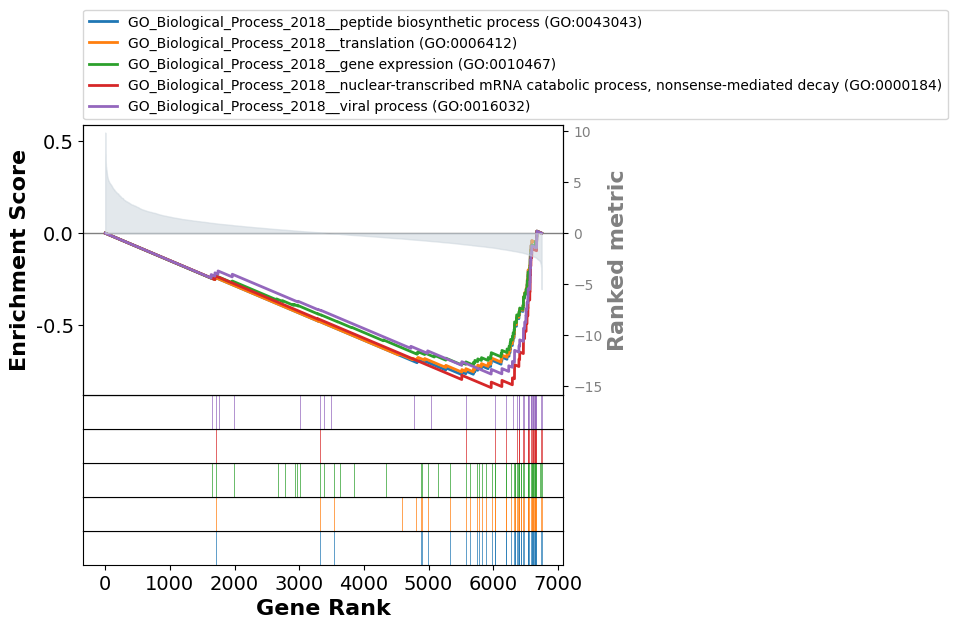

In [91]:
terms = pre_res.res2d.Term

axs = pre_res.plot(terms = terms[0:5],
                   show_ranking=True,
                   figsize=(6, 8)
                  )

Congratulations! We have obtained the top five pathways affected by a depletion in FACT. Let's dive in.

The graph at the top has values for the enrichment scores for a gene set. The score at the trough (or peak if we had positive enrichment scores) of one of the lines is the enrichment score for that specific gene set. The graphs at the bottom show where the members of the gene set appear in the ranked list of genes. The leading edge subset consists of the genes that appear after the trough of the top graph (or before the peak if we had positive enrichment scores). This subset contributes most to the enrichment score, and has the most important genes. 

We can see some interesting results. A depletion of FACT does in fact very significantly and negatively affect peptide biosynthetic processes, translation, gene expression, nonsense-mediated decay, and viral processes. In fact, the top 33 pathways show a significant negative effect on those processes. The absence of one histone chaperone has a massive effect on the cellular environment! The affected pathways are listed below.

In [92]:
for i, term in enumerate(terms[:33]):
    print(i, term)

0 GO_Biological_Process_2018__peptide biosynthetic process (GO:0043043)
1 GO_Biological_Process_2018__translation (GO:0006412)
2 GO_Biological_Process_2018__gene expression (GO:0010467)
3 GO_Biological_Process_2018__nuclear-transcribed mRNA catabolic process, nonsense-mediated decay (GO:0000184)
4 GO_Biological_Process_2018__viral process (GO:0016032)
5 GO_Biological_Process_2018__cellular protein metabolic process (GO:0044267)
6 GO_Biological_Process_2018__viral transcription (GO:0019083)
7 GO_Biological_Process_2018__viral gene expression (GO:0019080)
8 GO_Biological_Process_2018__cotranslational protein targeting to membrane (GO:0006613)
9 GO_Biological_Process_2018__protein targeting to ER (GO:0045047)
10 GO_Biological_Process_2018__nuclear-transcribed mRNA catabolic process (GO:0000956)
11 GO_Biological_Process_2018__SRP-dependent cotranslational protein targeting to membrane (GO:0006614)
12 GO_Biological_Process_2018__cellular macromolecule biosynthetic process (GO:0034645)
13 GO

Although we didn't see a significant effect on pathways relating to cohesin, sister chromatids, or even mitosis, we can still get a scope of the importance of FACT.